In [ ]:
pip install deep-pipe

In [ ]:
pip install torchgeometry

In [ ]:
pip install kornia

In [ ]:
import torch
import torch.nn as nn
from torch.nn import init
import torch.nn.functional as F

from torch.autograd import Variable
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import datasets, models, transforms
from torchvision.models.resnet import ResNet, BasicBlock

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import time, os, copy
from PIL import Image
import natsort
import cv2
import random 


from PIL import Image
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os
import cv2
from tqdm import tqdm

import torch
import nibabel as nib
from torch.utils.data import Dataset
from torch.utils.data import random_split
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler

from statistics import mean

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive') #, force_remount = True

Mounted at /content/gdrive


# Model

In [ ]:
from torch import nn
from dpipe.layers.resblock import ResBlock2d
from dpipe.layers.conv import PreActivation2d


class UNet2D(nn.Module):
    def __init__(self, n_chans_in, n_chans_out, kernel_size=3, padding=1, pooling_size=2, n_filters_init=8,
                 dropout=False, p=0.1):
        super().__init__()
        self.kernel_size = kernel_size
        self.padding = padding
        self.pooling_size = pooling_size
        n = n_filters_init
        if dropout:
            dropout_layer = nn.Dropout(p)
        else:
            dropout_layer = nn.Identity()

        self.init_path = nn.Sequential(
            nn.Conv2d(n_chans_in, n, self.kernel_size, padding=self.padding, bias=False),
            nn.ReLU(),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n, n, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut0 = nn.Conv2d(n, n, 1)

        self.down1 = nn.Sequential(
            nn.BatchNorm2d(n),
            nn.Conv2d(n, n * 2, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut1 = nn.Conv2d(n * 2, n * 2, 1)

        self.down2 = nn.Sequential(
            nn.BatchNorm2d(n * 2),
            nn.Conv2d(n * 2, n * 4, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding)
        )
        self.shortcut2 = nn.Conv2d(n * 4, n * 4, 1)

        self.down3 = nn.Sequential(
            nn.BatchNorm2d(n * 4),
            nn.Conv2d(n * 4, n * 8, kernel_size=pooling_size, stride=pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer,
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            dropout_layer
        )

        self.up3 = nn.Sequential(
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 8, n * 8, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 8),
            nn.ConvTranspose2d(n * 8, n * 4, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.up2 = nn.Sequential(
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 4, n * 4, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 4),
            nn.ConvTranspose2d(n * 4, n * 2, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.up1 = nn.Sequential(
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            ResBlock2d(n * 2, n * 2, kernel_size=self.kernel_size, padding=self.padding),
            nn.BatchNorm2d(n * 2),
            nn.ConvTranspose2d(n * 2, n, kernel_size=self.pooling_size, stride=self.pooling_size, bias=False),
            nn.ReLU(),
            dropout_layer
        )

        self.out_path = nn.Sequential(
            ResBlock2d(n, n, kernel_size=1),
            PreActivation2d(n, n_chans_out, kernel_size=1),
            nn.BatchNorm2d(n_chans_out)
        )

    def forward(self, x):
        x0 = self.init_path(x)
        x1 = self.down1(x0)
        x2 = self.down2(x1)
        x3 = self.down3(x2)

        x2_up = self.up3(x3)
        x1_up = self.up2(x2_up + self.shortcut2(x2))
        x0_up = self.up1(x1_up + self.shortcut1(x1))
        x_out = self.out_path(x0_up + self.shortcut0(x0))

        return F.sigmoid(x_out)

# Dataset

In [ ]:
class ScanDataset(Dataset):
    def __init__(self, mode = 'train'):
      
      self.original_images = np.load('/content/gdrive/MyDrive/GE/ge3_'+ mode + '_original_images.npy')
      self.mask_images = np.load('/content/gdrive/MyDrive/GE/ge3_'+ mode + '_mask_images.npy')

    def __len__(self):
        return len(self.original_images)

    def __getitem__(self, idx):

        original_batch = torch.from_numpy(self.original_images[idx]).float()
        mask_batch = torch.from_numpy(self.mask_images[idx]).float()

        return original_batch, mask_batch

In [ ]:
train_data = ScanDataset( mode = 'train' )
print(len(train_data))

8280


In [ ]:
val_data = ScanDataset( mode = 'val' )
print(len(val_data))

2152


In [ ]:
test_data = ScanDataset( mode = 'test' )
print(len(test_data))

In [ ]:
100 * 288 * 288

In [ ]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
      
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()  
                                 
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  

        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE, BCE, dice_loss

In [ ]:
def plotting(path, current_epoch, batch_idx, original, mask, pred):
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
  fig.set_size_inches(6, 8, forward=True)
  fig.set_dpi(120)
  fig.tight_layout()
  ax1.imshow(original[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax2.imshow(mask[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax3.imshow(pred[0][0].detach().cpu().numpy(), cmap = 'gray')
  ax1.set_title('original')
  ax2.set_title('mask')
  ax3.set_title('pred')
  plt.savefig(path + str(current_epoch) + '_' + str(batch_idx))
  plt.pause(0.00001)

# Training

In [ ]:
batch_size = 16
train_loader = torch.utils.data.DataLoader(dataset = train_data, batch_size = batch_size, shuffle = True ,num_workers = 0)

val_batch_size = 16
val_loader = torch.utils.data.DataLoader(dataset = val_data, batch_size = val_batch_size, shuffle = True ,num_workers = 0)

In [ ]:
def train(model, train_loader, optimizer, loss_func, current_epoch, device):
  
  # train 
  model.train()

  loss_hist = []  # loss
  BCE_loss_hist = []
  dice_loss_hist = []

  for batch_idx, data in enumerate(train_loader):

      optimizer.zero_grad()

      original = torch.unsqueeze(data[0].float(), axis = 1).to(device)
      
      mask = torch.unsqueeze(data[1].float(), axis = 1).to(device)
          
      pred = model(original)

      loss, BCE, dice_loss = loss_func(pred, mask)

      if batch_idx %  10 == 0:
        print( "Train: Epoch",current_epoch,"| Batch:",batch_idx,"| Combined Loss:", loss.item(),"| BCE",BCE.item(),"| dice_loss",dice_loss.item() )

      if batch_idx % 100 == 0:
        plotting('/content/gdrive/MyDrive/VMIA_Lab_Data/Plots/Combined_Loss/Train/plot_',current_epoch, batch_idx, original, mask, pred)

      loss_hist.append(loss.item())
      BCE_loss_hist.append(BCE.item())
      dice_loss_hist.append(dice_loss.item())

      loss.backward()

      optimizer.step()

  return model, optimizer, loss_hist, BCE_loss_hist, dice_loss_hist


In [ ]:


def val(model, val_loader, loss_func, current_epoch, device):

  model.eval()
  
  val_loss_hist = []
  val_BCE_loss_hist = []
  val_dice_loss_hist = []

  with torch.no_grad():

    for batch_idx, data in enumerate(val_loader):

        original = torch.unsqueeze(data[0].float(), axis = 1).to(device)
        
        mask = torch.unsqueeze(data[1].float(), axis = 1).to(device)

        pred = model(original)

        val_loss, val_BCE, val_dice_loss = loss_func(pred, mask)

        if batch_idx % 10 == 0:
          print( "Val: Epoch",current_epoch,"| Batch:",batch_idx,"| Combined Loss:", val_loss.item(),"| BCE",val_BCE.item(),"| dice_loss",val_dice_loss.item() )
  

        if batch_idx % 30 == 0:
          plotting('/content/gdrive/MyDrive/VMIA_Lab_Data/Plots/Combined_Loss/Val/plot_', current_epoch, batch_idx, original, mask, pred)

        val_loss_hist.append(val_loss.item())
        val_BCE_loss_hist.append(val_BCE.item())
        val_dice_loss_hist.append(val_dice_loss.item())


  return val_loss_hist, val_BCE_loss_hist, val_dice_loss_hist

In [ ]:
device

device(type='cuda')

In [ ]:
model = UNet2D(1,1).to(device)

optimizer = optim.Adam( model.parameters(), lr = 0.001 )

from kornia.losses import dice_loss

loss_func = DiceBCELoss()

In [ ]:
no_of_epochs = 25 #16

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:1806: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


Train: Epoch 0 | Batch: 0 | Combined Loss: 1.6146466732025146 | BCE 0.7776502370834351 | dice_loss 0.8369963765144348


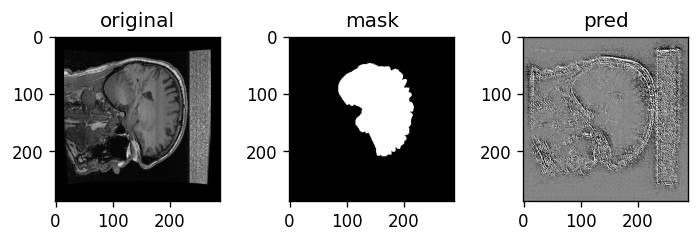

Train: Epoch 0 | Batch: 10 | Combined Loss: 1.4848835468292236 | BCE 0.6665363907814026 | dice_loss 0.818347156047821
Train: Epoch 0 | Batch: 20 | Combined Loss: 1.3152971267700195 | BCE 0.5579796433448792 | dice_loss 0.7573174238204956
Train: Epoch 0 | Batch: 30 | Combined Loss: 1.277137279510498 | BCE 0.532604455947876 | dice_loss 0.7445328831672668
Train: Epoch 0 | Batch: 40 | Combined Loss: 1.2468159198760986 | BCE 0.5186952948570251 | dice_loss 0.7281206846237183
Train: Epoch 0 | Batch: 50 | Combined Loss: 1.265900731086731 | BCE 0.5201869606971741 | dice_loss 0.7457137703895569
Train: Epoch 0 | Batch: 60 | Combined Loss: 1.274532437324524 | BCE 0.5174523591995239 | dice_loss 0.757080078125
Train: Epoch 0 | Batch: 70 | Combined Loss: 1.2184298038482666 | BCE 0.4978494942188263 | dice_loss 0.7205802798271179
Train: Epoch 0 | Batch: 80 | Combined Loss: 1.2985265254974365 | BCE 0.5178912281990051 | dice_loss 0.7806353569030762
Train: Epoch 0 | Batch: 90 | Combined Loss: 1.16487216949

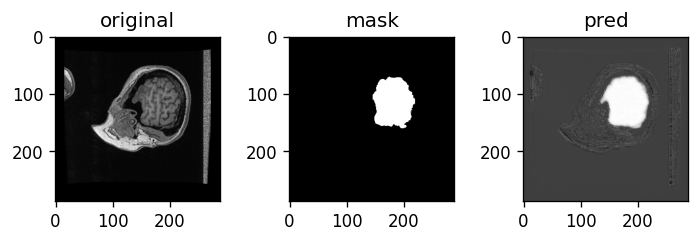

Train: Epoch 0 | Batch: 110 | Combined Loss: 1.116608738899231 | BCE 0.45317280292510986 | dice_loss 0.6634359359741211
Train: Epoch 0 | Batch: 120 | Combined Loss: 1.0875344276428223 | BCE 0.442075252532959 | dice_loss 0.6454591751098633
Train: Epoch 0 | Batch: 130 | Combined Loss: 1.239526629447937 | BCE 0.4826320707798004 | dice_loss 0.756894588470459
Train: Epoch 0 | Batch: 140 | Combined Loss: 1.228353500366211 | BCE 0.47656363248825073 | dice_loss 0.751789927482605
Train: Epoch 0 | Batch: 150 | Combined Loss: 1.1958036422729492 | BCE 0.46338239312171936 | dice_loss 0.7324212193489075
Train: Epoch 0 | Batch: 160 | Combined Loss: 1.1225262880325317 | BCE 0.4398000240325928 | dice_loss 0.682726263999939
Train: Epoch 0 | Batch: 170 | Combined Loss: 1.2762813568115234 | BCE 0.4846211075782776 | dice_loss 0.7916603088378906
Train: Epoch 0 | Batch: 180 | Combined Loss: 1.196144700050354 | BCE 0.4603494703769684 | dice_loss 0.735795259475708
Train: Epoch 0 | Batch: 190 | Combined Loss: 1

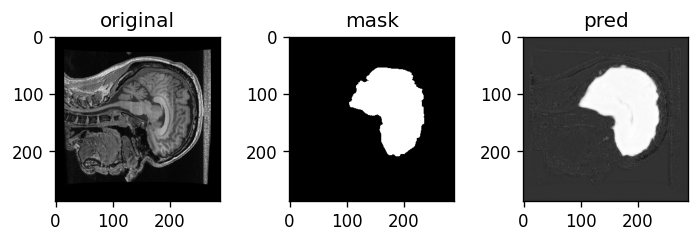

Train: Epoch 0 | Batch: 210 | Combined Loss: 1.1872355937957764 | BCE 0.4457331895828247 | dice_loss 0.7415024638175964
Train: Epoch 0 | Batch: 220 | Combined Loss: 0.9803371429443359 | BCE 0.3853992521762848 | dice_loss 0.5949379205703735
Train: Epoch 0 | Batch: 230 | Combined Loss: 1.163512110710144 | BCE 0.4385802745819092 | dice_loss 0.7249318361282349
Train: Epoch 0 | Batch: 240 | Combined Loss: 0.997276782989502 | BCE 0.3863430321216583 | dice_loss 0.610933780670166
Train: Epoch 0 | Batch: 250 | Combined Loss: 1.0538039207458496 | BCE 0.40046823024749756 | dice_loss 0.653335690498352
Train: Epoch 0 | Batch: 260 | Combined Loss: 1.1016241312026978 | BCE 0.4094039499759674 | dice_loss 0.692220151424408
Train: Epoch 0 | Batch: 270 | Combined Loss: 1.0303478240966797 | BCE 0.38737741112709045 | dice_loss 0.6429704427719116
Train: Epoch 0 | Batch: 280 | Combined Loss: 1.0551598072052002 | BCE 0.39200538396835327 | dice_loss 0.6631543636322021
Train: Epoch 0 | Batch: 290 | Combined Los

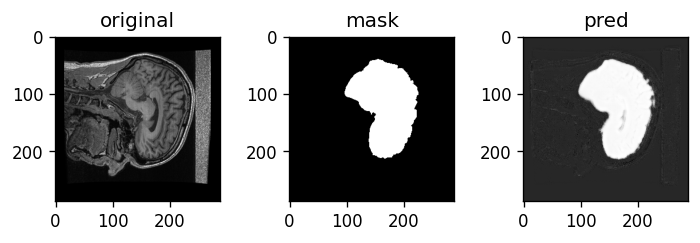

Train: Epoch 0 | Batch: 310 | Combined Loss: 0.9911301732063293 | BCE 0.3667883276939392 | dice_loss 0.6243418455123901
Train: Epoch 0 | Batch: 320 | Combined Loss: 1.078643798828125 | BCE 0.3879780173301697 | dice_loss 0.6906657218933105
Train: Epoch 0 | Batch: 330 | Combined Loss: 0.9085413813591003 | BCE 0.34060782194137573 | dice_loss 0.5679335594177246
Train: Epoch 0 | Batch: 340 | Combined Loss: 1.0115638971328735 | BCE 0.36622580885887146 | dice_loss 0.6453380584716797
Train: Epoch 0 | Batch: 350 | Combined Loss: 1.0927224159240723 | BCE 0.3841860294342041 | dice_loss 0.7085364460945129
Train: Epoch 0 | Batch: 360 | Combined Loss: 0.9141718149185181 | BCE 0.3359910547733307 | dice_loss 0.5781807899475098
Train: Epoch 0 | Batch: 370 | Combined Loss: 1.0973231792449951 | BCE 0.3795381188392639 | dice_loss 0.717785120010376
Train: Epoch 0 | Batch: 380 | Combined Loss: 1.0537376403808594 | BCE 0.3670056462287903 | dice_loss 0.6867320537567139
Train: Epoch 0 | Batch: 390 | Combined L

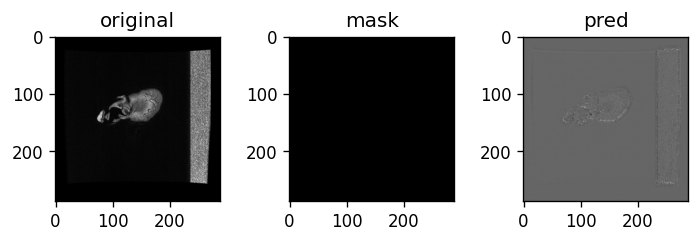

Train: Epoch 0 | Batch: 410 | Combined Loss: 0.8812969923019409 | BCE 0.31650859117507935 | dice_loss 0.5647884011268616
Train: Epoch 0 | Batch: 420 | Combined Loss: 1.017707347869873 | BCE 0.3480508327484131 | dice_loss 0.6696564555168152
Train: Epoch 0 | Batch: 430 | Combined Loss: 0.8704374432563782 | BCE 0.3123701810836792 | dice_loss 0.558067262172699
Train: Epoch 0 | Batch: 440 | Combined Loss: 0.9552112221717834 | BCE 0.33215421438217163 | dice_loss 0.6230570077896118
Train: Epoch 0 | Batch: 450 | Combined Loss: 1.050035834312439 | BCE 0.35001638531684875 | dice_loss 0.7000194191932678
Train: Epoch 0 | Batch: 460 | Combined Loss: 0.8642148375511169 | BCE 0.30586105585098267 | dice_loss 0.5583537817001343
Train: Epoch 0 | Batch: 470 | Combined Loss: 0.9349691867828369 | BCE 0.319034218788147 | dice_loss 0.6159349679946899
Train: Epoch 0 | Batch: 480 | Combined Loss: 0.9327541589736938 | BCE 0.3158213794231415 | dice_loss 0.6169328093528748
Train: Epoch 0 | Batch: 490 | Combined L

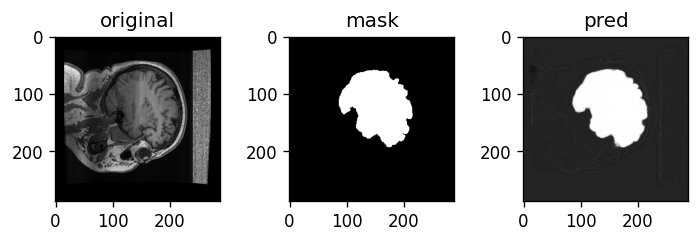

Train: Epoch 0 | Batch: 510 | Combined Loss: 1.003298282623291 | BCE 0.3287033438682556 | dice_loss 0.6745949983596802
Avg train loss for epoch  --> 1.09319332057905 | BCE: 0.4147536894414416 | dice_loss: 0.6784396310800751
Val: Epoch 0 | Batch: 0 | Combined Loss: 0.8658868074417114 | BCE 0.3100149631500244 | dice_loss 0.555871844291687


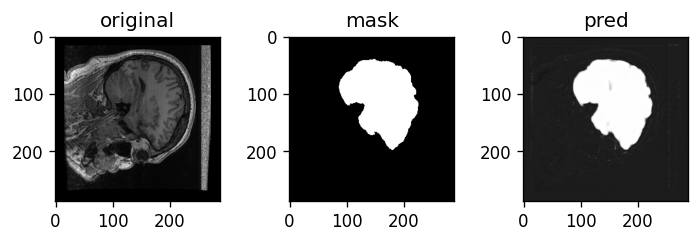

Val: Epoch 0 | Batch: 10 | Combined Loss: 0.9386946558952332 | BCE 0.31869256496429443 | dice_loss 0.6200020909309387
Val: Epoch 0 | Batch: 20 | Combined Loss: 0.9236934185028076 | BCE 0.3145997226238251 | dice_loss 0.6090936660766602
Val: Epoch 0 | Batch: 30 | Combined Loss: 0.8830693364143372 | BCE 0.3141217827796936 | dice_loss 0.5689475536346436


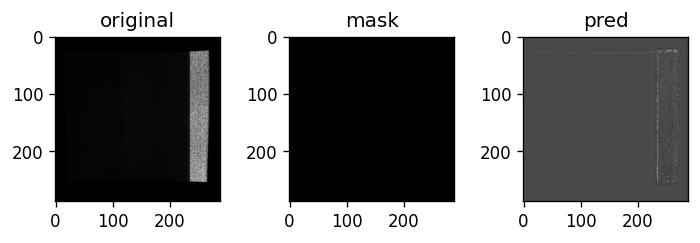

Val: Epoch 0 | Batch: 40 | Combined Loss: 0.9044660329818726 | BCE 0.31439563632011414 | dice_loss 0.590070366859436
Val: Epoch 0 | Batch: 50 | Combined Loss: 0.8931843042373657 | BCE 0.3159538209438324 | dice_loss 0.5772304534912109
Val: Epoch 0 | Batch: 60 | Combined Loss: 0.8676908016204834 | BCE 0.314689964056015 | dice_loss 0.553000807762146


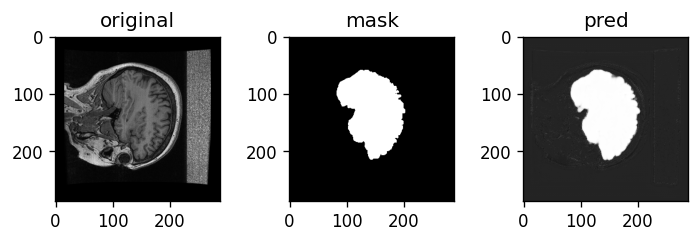

Val: Epoch 0 | Batch: 70 | Combined Loss: 0.9783626198768616 | BCE 0.3215523362159729 | dice_loss 0.6568102836608887
Val: Epoch 0 | Batch: 80 | Combined Loss: 0.9274953603744507 | BCE 0.3175904452800751 | dice_loss 0.6099048852920532
Val: Epoch 0 | Batch: 90 | Combined Loss: 0.9956018924713135 | BCE 0.32196757197380066 | dice_loss 0.6736342906951904


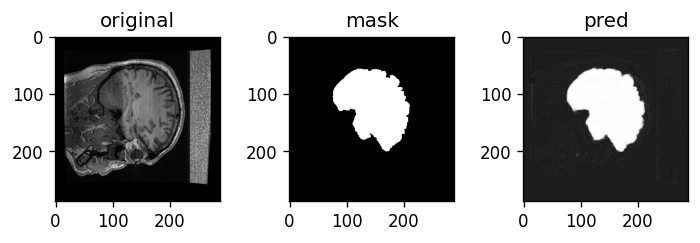

Val: Epoch 0 | Batch: 100 | Combined Loss: 0.8632974624633789 | BCE 0.314291387796402 | dice_loss 0.5490061044692993
Val: Epoch 0 | Batch: 110 | Combined Loss: 0.9326611757278442 | BCE 0.31498685479164124 | dice_loss 0.6176743507385254
Val: Epoch 0 | Batch: 120 | Combined Loss: 0.8414959907531738 | BCE 0.309438019990921 | dice_loss 0.5320580005645752


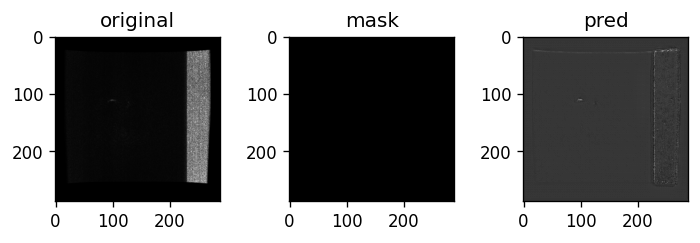

Val: Epoch 0 | Batch: 130 | Combined Loss: 0.8782626390457153 | BCE 0.3147435486316681 | dice_loss 0.5635191202163696
Average val loss for epoch  --> 0.9375746192755523 | BCE: 0.31740729588049427 | dice_loss: 0.6201673220705103
****************************************************************************************************
Train: Epoch 1 | Batch: 0 | Combined Loss: 0.9385076761245728 | BCE 0.3116224706172943 | dice_loss 0.626885175704956


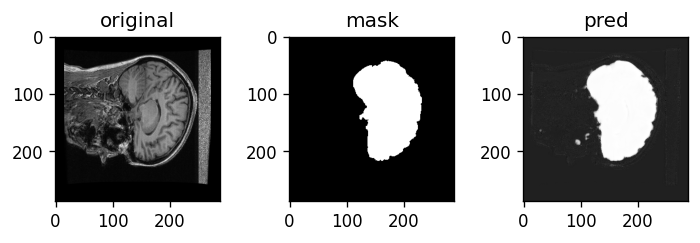

Train: Epoch 1 | Batch: 10 | Combined Loss: 0.8910777568817139 | BCE 0.2969372272491455 | dice_loss 0.5941405296325684
Train: Epoch 1 | Batch: 20 | Combined Loss: 1.0833113193511963 | BCE 0.3416701853275299 | dice_loss 0.7416411638259888
Train: Epoch 1 | Batch: 30 | Combined Loss: 0.9340384006500244 | BCE 0.30430763959884644 | dice_loss 0.629730761051178
Train: Epoch 1 | Batch: 40 | Combined Loss: 0.8341348171234131 | BCE 0.2795243561267853 | dice_loss 0.5546104311943054
Train: Epoch 1 | Batch: 50 | Combined Loss: 0.9590321779251099 | BCE 0.30677154660224915 | dice_loss 0.6522606611251831
Train: Epoch 1 | Batch: 60 | Combined Loss: 0.9716387987136841 | BCE 0.30582913756370544 | dice_loss 0.6658096313476562
Train: Epoch 1 | Batch: 70 | Combined Loss: 0.8651756048202515 | BCE 0.27965664863586426 | dice_loss 0.5855189561843872
Train: Epoch 1 | Batch: 80 | Combined Loss: 0.8986629247665405 | BCE 0.28669801354408264 | dice_loss 0.6119649410247803
Train: Epoch 1 | Batch: 90 | Combined Loss: 

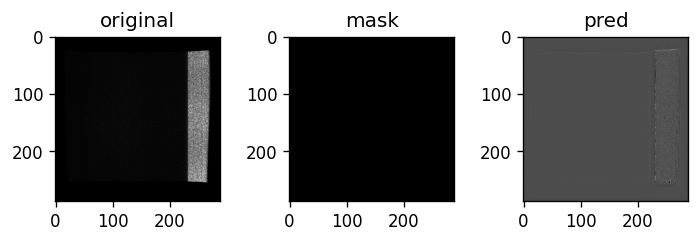

Train: Epoch 1 | Batch: 110 | Combined Loss: 0.8547028303146362 | BCE 0.2720522880554199 | dice_loss 0.5826505422592163
Train: Epoch 1 | Batch: 120 | Combined Loss: 1.0209176540374756 | BCE 0.307203084230423 | dice_loss 0.7137145400047302
Train: Epoch 1 | Batch: 130 | Combined Loss: 0.8811682462692261 | BCE 0.27502021193504333 | dice_loss 0.6061480641365051
Train: Epoch 1 | Batch: 140 | Combined Loss: 0.8105447292327881 | BCE 0.2569691240787506 | dice_loss 0.5535756349563599
Train: Epoch 1 | Batch: 150 | Combined Loss: 0.8063170909881592 | BCE 0.25483980774879456 | dice_loss 0.5514772534370422
Train: Epoch 1 | Batch: 160 | Combined Loss: 0.7694704532623291 | BCE 0.2465626299381256 | dice_loss 0.5229077935218811
Train: Epoch 1 | Batch: 170 | Combined Loss: 0.8347707986831665 | BCE 0.2585485875606537 | dice_loss 0.5762221813201904
Train: Epoch 1 | Batch: 180 | Combined Loss: 0.8161227703094482 | BCE 0.2522813379764557 | dice_loss 0.5638414025306702
Train: Epoch 1 | Batch: 190 | Combined 

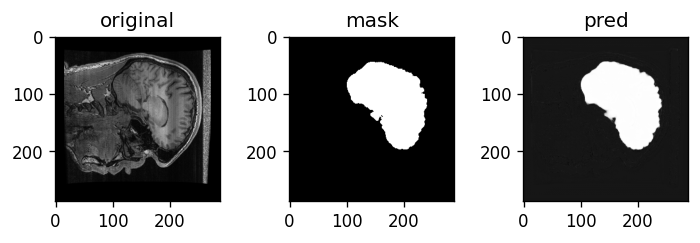

Train: Epoch 1 | Batch: 210 | Combined Loss: 0.8952457904815674 | BCE 0.2629100978374481 | dice_loss 0.6323356628417969
Train: Epoch 1 | Batch: 220 | Combined Loss: 0.8352223038673401 | BCE 0.2501799464225769 | dice_loss 0.5850423574447632
Train: Epoch 1 | Batch: 230 | Combined Loss: 0.88934326171875 | BCE 0.25791022181510925 | dice_loss 0.6314330101013184
Train: Epoch 1 | Batch: 240 | Combined Loss: 0.7333090305328369 | BCE 0.22685477137565613 | dice_loss 0.5064542889595032
Train: Epoch 1 | Batch: 250 | Combined Loss: 0.7439433932304382 | BCE 0.22657281160354614 | dice_loss 0.5173705816268921
Train: Epoch 1 | Batch: 260 | Combined Loss: 0.6667144298553467 | BCE 0.20959515869617462 | dice_loss 0.45711928606033325
Train: Epoch 1 | Batch: 270 | Combined Loss: 0.8431767821311951 | BCE 0.24323195219039917 | dice_loss 0.5999448299407959
Train: Epoch 1 | Batch: 280 | Combined Loss: 0.721042275428772 | BCE 0.21935483813285828 | dice_loss 0.5016874074935913
Train: Epoch 1 | Batch: 290 | Combin

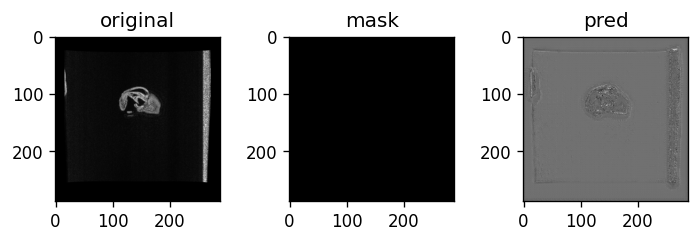

Train: Epoch 1 | Batch: 310 | Combined Loss: 0.6394203305244446 | BCE 0.19829697906970978 | dice_loss 0.441123366355896
Train: Epoch 1 | Batch: 320 | Combined Loss: 0.7894863486289978 | BCE 0.22714394330978394 | dice_loss 0.5623424053192139
Train: Epoch 1 | Batch: 330 | Combined Loss: 0.7318455576896667 | BCE 0.21811695396900177 | dice_loss 0.5137286186218262
Train: Epoch 1 | Batch: 340 | Combined Loss: 0.7874965667724609 | BCE 0.22807203233242035 | dice_loss 0.5594245195388794
Train: Epoch 1 | Batch: 350 | Combined Loss: 0.862375795841217 | BCE 0.24040299654006958 | dice_loss 0.6219727993011475
Train: Epoch 1 | Batch: 360 | Combined Loss: 0.7053039073944092 | BCE 0.20667019486427307 | dice_loss 0.4986336827278137
Train: Epoch 1 | Batch: 370 | Combined Loss: 0.7665835618972778 | BCE 0.21600881218910217 | dice_loss 0.550574779510498
Train: Epoch 1 | Batch: 380 | Combined Loss: 0.7481781244277954 | BCE 0.20989729464054108 | dice_loss 0.5382808446884155
Train: Epoch 1 | Batch: 390 | Combi

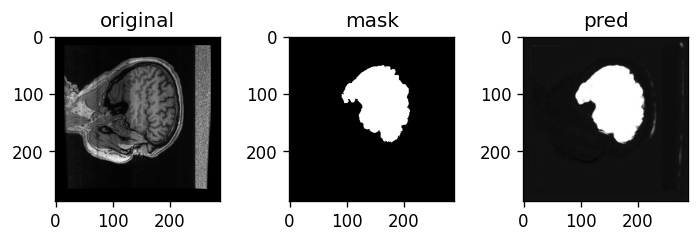

Train: Epoch 1 | Batch: 410 | Combined Loss: 0.7480931282043457 | BCE 0.21259889006614685 | dice_loss 0.5354942083358765
Train: Epoch 1 | Batch: 420 | Combined Loss: 0.8360299468040466 | BCE 0.22074301540851593 | dice_loss 0.6152869462966919
Train: Epoch 1 | Batch: 430 | Combined Loss: 0.7255569696426392 | BCE 0.20035722851753235 | dice_loss 0.5251997709274292
Train: Epoch 1 | Batch: 440 | Combined Loss: 0.8306931853294373 | BCE 0.2189767211675644 | dice_loss 0.6117164492607117
Train: Epoch 1 | Batch: 450 | Combined Loss: 0.6797077059745789 | BCE 0.1929280161857605 | dice_loss 0.48677968978881836
Train: Epoch 1 | Batch: 460 | Combined Loss: 0.7191522121429443 | BCE 0.19830971956253052 | dice_loss 0.5208424925804138
Train: Epoch 1 | Batch: 470 | Combined Loss: 0.6174885034561157 | BCE 0.17767852544784546 | dice_loss 0.43980997800827026
Train: Epoch 1 | Batch: 480 | Combined Loss: 0.5900245904922485 | BCE 0.17125177383422852 | dice_loss 0.41877281665802
Train: Epoch 1 | Batch: 490 | Comb

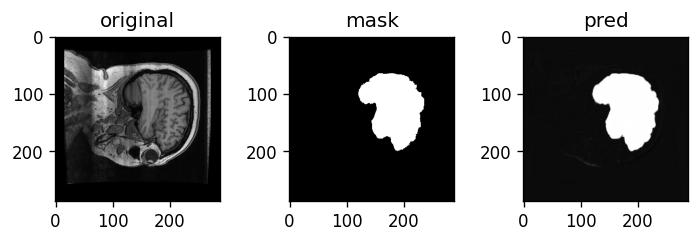

Train: Epoch 1 | Batch: 510 | Combined Loss: 0.7697422504425049 | BCE 0.19876287877559662 | dice_loss 0.5709793567657471
Avg train loss for epoch  --> 0.8135498498627578 | BCE: 0.24344463177514353 | dice_loss: 0.5701052185191151
Val: Epoch 1 | Batch: 0 | Combined Loss: 0.6764054894447327 | BCE 0.18337392807006836 | dice_loss 0.4930315613746643


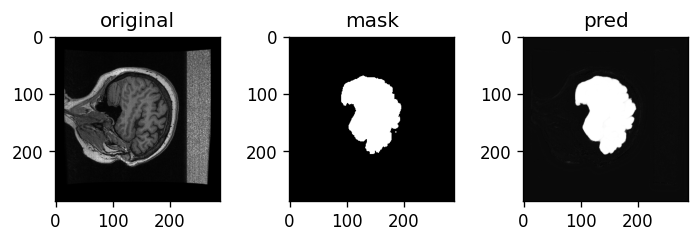

Val: Epoch 1 | Batch: 10 | Combined Loss: 0.599336564540863 | BCE 0.18098121881484985 | dice_loss 0.4183553457260132
Val: Epoch 1 | Batch: 20 | Combined Loss: 0.6161274909973145 | BCE 0.1818588227033615 | dice_loss 0.43426865339279175
Val: Epoch 1 | Batch: 30 | Combined Loss: 0.6656357049942017 | BCE 0.18429763615131378 | dice_loss 0.4813380837440491


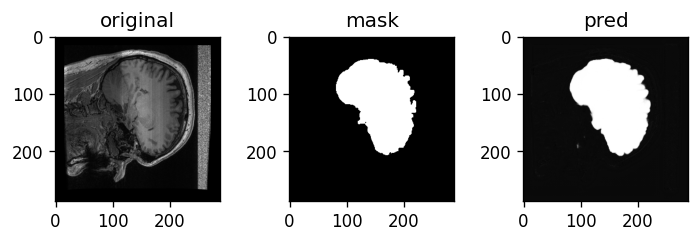

Val: Epoch 1 | Batch: 40 | Combined Loss: 0.7040467858314514 | BCE 0.18528683483600616 | dice_loss 0.5187599658966064
Val: Epoch 1 | Batch: 50 | Combined Loss: 0.6873661875724792 | BCE 0.18472690880298615 | dice_loss 0.5026392936706543
Val: Epoch 1 | Batch: 60 | Combined Loss: 0.6736237406730652 | BCE 0.18522827327251434 | dice_loss 0.48839545249938965


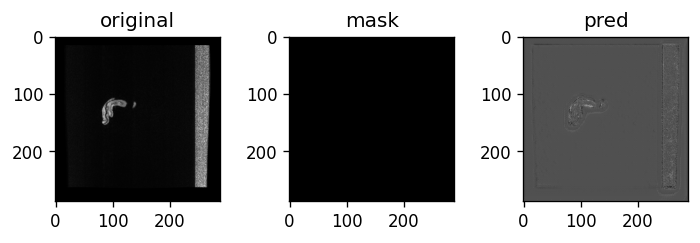

Val: Epoch 1 | Batch: 70 | Combined Loss: 0.6848489046096802 | BCE 0.18513324856758118 | dice_loss 0.4997156858444214
Val: Epoch 1 | Batch: 80 | Combined Loss: 0.6735443472862244 | BCE 0.18437819182872772 | dice_loss 0.48916614055633545
Val: Epoch 1 | Batch: 90 | Combined Loss: 0.8320071697235107 | BCE 0.19055722653865814 | dice_loss 0.6414499282836914


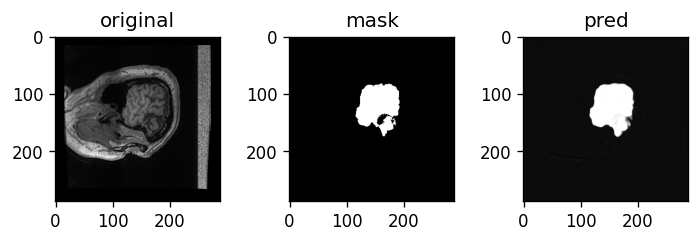

Val: Epoch 1 | Batch: 100 | Combined Loss: 0.6934446096420288 | BCE 0.1857626587152481 | dice_loss 0.5076819658279419
Val: Epoch 1 | Batch: 110 | Combined Loss: 0.6321369409561157 | BCE 0.1852351725101471 | dice_loss 0.446901798248291
Val: Epoch 1 | Batch: 120 | Combined Loss: 0.6761299967765808 | BCE 0.18515117466449738 | dice_loss 0.49097883701324463


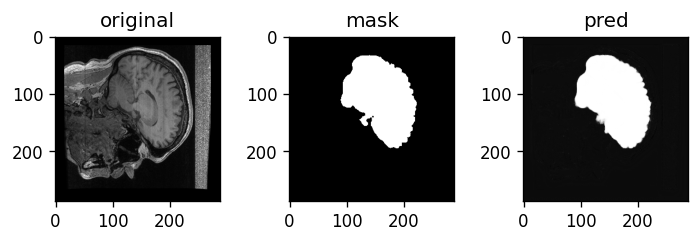

Val: Epoch 1 | Batch: 130 | Combined Loss: 0.6768746376037598 | BCE 0.18607324361801147 | dice_loss 0.4908013939857483
Average val loss for epoch  --> 0.6895371918325071 | BCE: 0.1852943515336072 | dice_loss: 0.5042428431687531
****************************************************************************************************
Train: Epoch 2 | Batch: 0 | Combined Loss: 0.7072348594665527 | BCE 0.18809844553470612 | dice_loss 0.5191364288330078


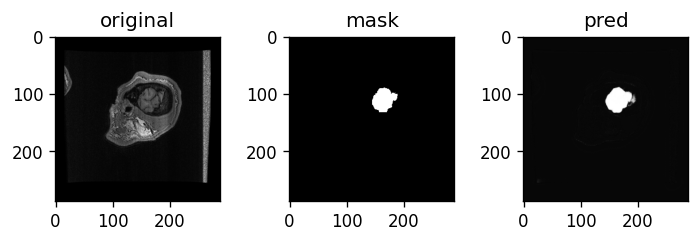

Train: Epoch 2 | Batch: 10 | Combined Loss: 0.586948573589325 | BCE 0.16685698926448822 | dice_loss 0.42009156942367554
Train: Epoch 2 | Batch: 20 | Combined Loss: 0.8535947203636169 | BCE 0.20782487094402313 | dice_loss 0.6457698345184326
Train: Epoch 2 | Batch: 30 | Combined Loss: 0.584417998790741 | BCE 0.16547928750514984 | dice_loss 0.41893869638442993
Train: Epoch 2 | Batch: 40 | Combined Loss: 0.5791369676589966 | BCE 0.16380347311496735 | dice_loss 0.41533350944519043
Train: Epoch 2 | Batch: 50 | Combined Loss: 0.6378260850906372 | BCE 0.17203402519226074 | dice_loss 0.46579205989837646
Train: Epoch 2 | Batch: 60 | Combined Loss: 0.7081207036972046 | BCE 0.17997489869594574 | dice_loss 0.5281457901000977
Train: Epoch 2 | Batch: 70 | Combined Loss: 0.6441618204116821 | BCE 0.17063400149345398 | dice_loss 0.47352784872055054
Train: Epoch 2 | Batch: 80 | Combined Loss: 0.6950579881668091 | BCE 0.17682668566703796 | dice_loss 0.5182312726974487
Train: Epoch 2 | Batch: 90 | Combined

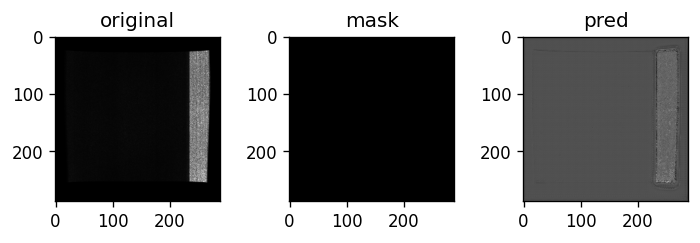

Train: Epoch 2 | Batch: 110 | Combined Loss: 0.8076816201210022 | BCE 0.1905250996351242 | dice_loss 0.6171565055847168
Train: Epoch 2 | Batch: 120 | Combined Loss: 0.616065502166748 | BCE 0.1584051251411438 | dice_loss 0.45766037702560425
Train: Epoch 2 | Batch: 130 | Combined Loss: 0.5143182277679443 | BCE 0.1441565454006195 | dice_loss 0.3701617121696472
Train: Epoch 2 | Batch: 140 | Combined Loss: 0.5915824174880981 | BCE 0.153382807970047 | dice_loss 0.43819957971572876
Train: Epoch 2 | Batch: 150 | Combined Loss: 0.6437954902648926 | BCE 0.16012459993362427 | dice_loss 0.4836708903312683
Train: Epoch 2 | Batch: 160 | Combined Loss: 0.5771204829216003 | BCE 0.15029247105121613 | dice_loss 0.4268280267715454
Train: Epoch 2 | Batch: 170 | Combined Loss: 0.548832893371582 | BCE 0.1440204232931137 | dice_loss 0.40481245517730713
Train: Epoch 2 | Batch: 180 | Combined Loss: 0.5338324904441833 | BCE 0.14153824746608734 | dice_loss 0.3922942280769348
Train: Epoch 2 | Batch: 190 | Combine

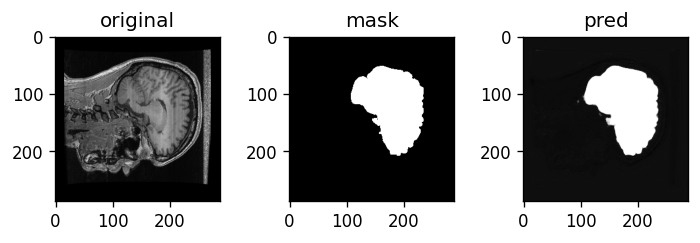

Train: Epoch 2 | Batch: 210 | Combined Loss: 0.6386218070983887 | BCE 0.15457841753959656 | dice_loss 0.4840433597564697
Train: Epoch 2 | Batch: 220 | Combined Loss: 0.4984303116798401 | BCE 0.1324404925107956 | dice_loss 0.3659898042678833
Train: Epoch 2 | Batch: 230 | Combined Loss: 0.6125490069389343 | BCE 0.14871644973754883 | dice_loss 0.4638325572013855
Train: Epoch 2 | Batch: 240 | Combined Loss: 0.5612496733665466 | BCE 0.14247001707553864 | dice_loss 0.4187796711921692
Train: Epoch 2 | Batch: 250 | Combined Loss: 0.4682295620441437 | BCE 0.12712344527244568 | dice_loss 0.341106116771698
Train: Epoch 2 | Batch: 260 | Combined Loss: 0.586017906665802 | BCE 0.14549992978572845 | dice_loss 0.44051796197891235
Train: Epoch 2 | Batch: 270 | Combined Loss: 0.6295638084411621 | BCE 0.14658406376838684 | dice_loss 0.4829797148704529
Train: Epoch 2 | Batch: 280 | Combined Loss: 0.6124287247657776 | BCE 0.1428341418504715 | dice_loss 0.4695945978164673
Train: Epoch 2 | Batch: 290 | Combi

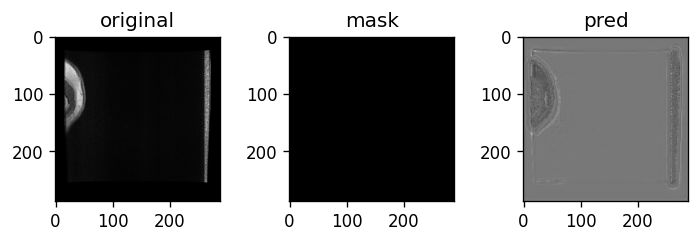

Train: Epoch 2 | Batch: 310 | Combined Loss: 0.8544631600379944 | BCE 0.17321395874023438 | dice_loss 0.68124920129776
Train: Epoch 2 | Batch: 320 | Combined Loss: 0.7103733420372009 | BCE 0.15232764184474945 | dice_loss 0.5580456852912903
Train: Epoch 2 | Batch: 330 | Combined Loss: 0.51612788438797 | BCE 0.12708525359630585 | dice_loss 0.38904261589050293
Train: Epoch 2 | Batch: 340 | Combined Loss: 0.6791058778762817 | BCE 0.1459101140499115 | dice_loss 0.5331957340240479
Train: Epoch 2 | Batch: 350 | Combined Loss: 0.4469291567802429 | BCE 0.11600826680660248 | dice_loss 0.33092087507247925
Train: Epoch 2 | Batch: 360 | Combined Loss: 0.6360344290733337 | BCE 0.14043374359607697 | dice_loss 0.49560070037841797
Train: Epoch 2 | Batch: 370 | Combined Loss: 0.46430307626724243 | BCE 0.11721337586641312 | dice_loss 0.3470897078514099
Train: Epoch 2 | Batch: 380 | Combined Loss: 0.5096334218978882 | BCE 0.12231674790382385 | dice_loss 0.38731664419174194
Train: Epoch 2 | Batch: 390 | Co

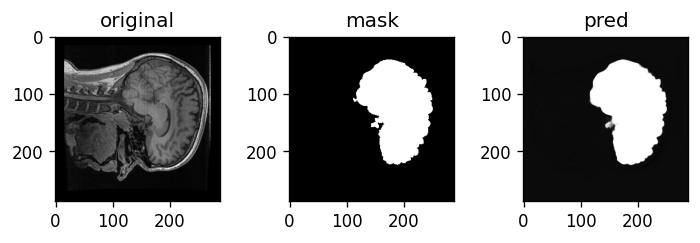

Train: Epoch 2 | Batch: 410 | Combined Loss: 0.5513371229171753 | BCE 0.12761926651000977 | dice_loss 0.4237178564071655
Train: Epoch 2 | Batch: 420 | Combined Loss: 0.551785945892334 | BCE 0.12431862950325012 | dice_loss 0.42746734619140625
Train: Epoch 2 | Batch: 430 | Combined Loss: 0.5810518860816956 | BCE 0.12791894376277924 | dice_loss 0.4531329274177551
Train: Epoch 2 | Batch: 440 | Combined Loss: 0.5731799006462097 | BCE 0.12500561773777008 | dice_loss 0.44817429780960083
Train: Epoch 2 | Batch: 450 | Combined Loss: 0.6522345542907715 | BCE 0.13520358502864838 | dice_loss 0.5170309543609619
Train: Epoch 2 | Batch: 460 | Combined Loss: 0.6637091636657715 | BCE 0.13518774509429932 | dice_loss 0.5285214185714722
Train: Epoch 2 | Batch: 470 | Combined Loss: 0.522045373916626 | BCE 0.11888832598924637 | dice_loss 0.4031570553779602
Train: Epoch 2 | Batch: 480 | Combined Loss: 0.6182547807693481 | BCE 0.1274995505809784 | dice_loss 0.49075525999069214
Train: Epoch 2 | Batch: 490 | Co

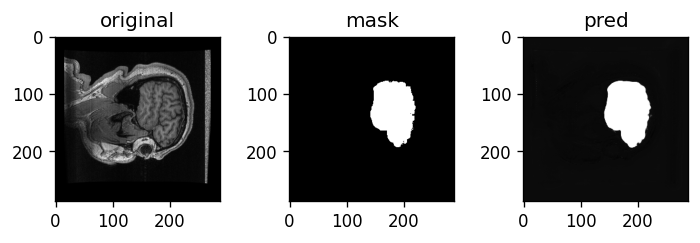

Train: Epoch 2 | Batch: 510 | Combined Loss: 0.43928036093711853 | BCE 0.10692354291677475 | dice_loss 0.3323568105697632
Avg train loss for epoch  --> 0.6006632003659907 | BCE: 0.14628160845588994 | dice_loss: 0.4543815904142314
Val: Epoch 2 | Batch: 0 | Combined Loss: 0.4263055920600891 | BCE 0.1163036897778511 | dice_loss 0.3100019097328186


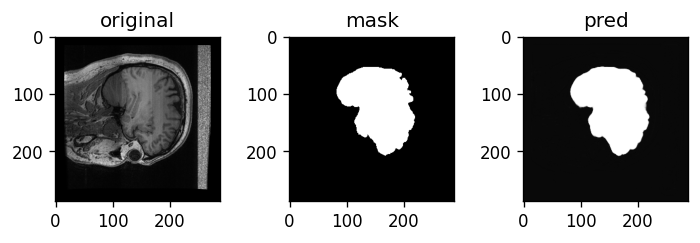

Val: Epoch 2 | Batch: 10 | Combined Loss: 0.53448486328125 | BCE 0.11319316923618317 | dice_loss 0.421291708946228
Val: Epoch 2 | Batch: 20 | Combined Loss: 0.6059107780456543 | BCE 0.11444614827632904 | dice_loss 0.49146461486816406
Val: Epoch 2 | Batch: 30 | Combined Loss: 0.4246848225593567 | BCE 0.11391305178403854 | dice_loss 0.31077176332473755


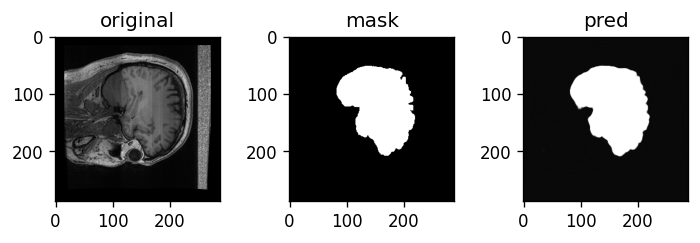

Val: Epoch 2 | Batch: 40 | Combined Loss: 0.5595278739929199 | BCE 0.11570461094379425 | dice_loss 0.44382327795028687
Val: Epoch 2 | Batch: 50 | Combined Loss: 0.7566396594047546 | BCE 0.11637034267187119 | dice_loss 0.6402693390846252
Val: Epoch 2 | Batch: 60 | Combined Loss: 0.5081503391265869 | BCE 0.11424606293439865 | dice_loss 0.39390426874160767


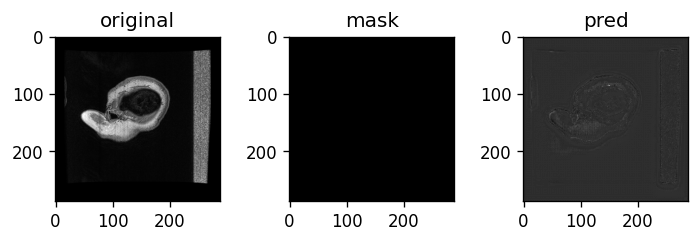

Val: Epoch 2 | Batch: 70 | Combined Loss: 0.4893741011619568 | BCE 0.11509515345096588 | dice_loss 0.3742789626121521
Val: Epoch 2 | Batch: 80 | Combined Loss: 0.6093412637710571 | BCE 0.11605306714773178 | dice_loss 0.49328821897506714
Val: Epoch 2 | Batch: 90 | Combined Loss: 0.5224917531013489 | BCE 0.1145574226975441 | dice_loss 0.407934308052063


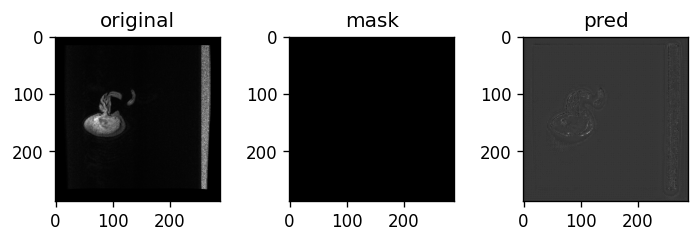

Val: Epoch 2 | Batch: 100 | Combined Loss: 0.47968268394470215 | BCE 0.11515982449054718 | dice_loss 0.36452287435531616
Val: Epoch 2 | Batch: 110 | Combined Loss: 0.5078352689743042 | BCE 0.11912315338850021 | dice_loss 0.3887121081352234
Val: Epoch 2 | Batch: 120 | Combined Loss: 0.47893351316452026 | BCE 0.11669217795133591 | dice_loss 0.36224132776260376


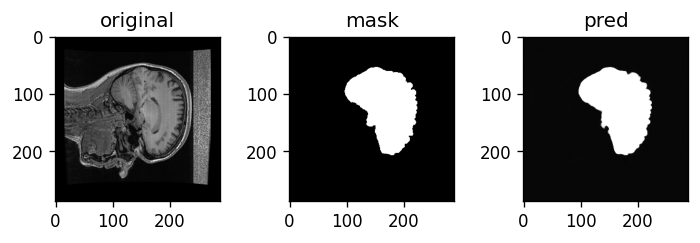

Val: Epoch 2 | Batch: 130 | Combined Loss: 0.5241876840591431 | BCE 0.11618193984031677 | dice_loss 0.4080057740211487
Average val loss for epoch  --> 0.5095132673228229 | BCE: 0.1155176603131824 | dice_loss: 0.3939956073407774
****************************************************************************************************
Train: Epoch 3 | Batch: 0 | Combined Loss: 0.381120502948761 | BCE 0.09755806624889374 | dice_loss 0.28356242179870605


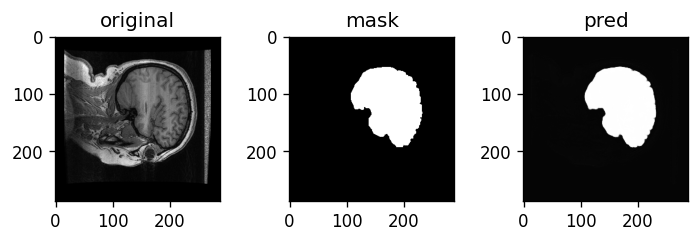

Train: Epoch 3 | Batch: 10 | Combined Loss: 0.4791812002658844 | BCE 0.10849454998970032 | dice_loss 0.3706866502761841
Train: Epoch 3 | Batch: 20 | Combined Loss: 0.4510299563407898 | BCE 0.10450722277164459 | dice_loss 0.3465227484703064
Train: Epoch 3 | Batch: 30 | Combined Loss: 0.4893047511577606 | BCE 0.10847196727991104 | dice_loss 0.3808327913284302
Train: Epoch 3 | Batch: 40 | Combined Loss: 0.540614128112793 | BCE 0.11386396735906601 | dice_loss 0.42675018310546875
Train: Epoch 3 | Batch: 50 | Combined Loss: 0.557073712348938 | BCE 0.11719263345003128 | dice_loss 0.4398810863494873
Train: Epoch 3 | Batch: 60 | Combined Loss: 0.5376514792442322 | BCE 0.11056613177061081 | dice_loss 0.42708534002304077
Train: Epoch 3 | Batch: 70 | Combined Loss: 0.5369216203689575 | BCE 0.1100841835141182 | dice_loss 0.4268374443054199
Train: Epoch 3 | Batch: 80 | Combined Loss: 0.45383909344673157 | BCE 0.10009565204381943 | dice_loss 0.35374343395233154
Train: Epoch 3 | Batch: 90 | Combined L

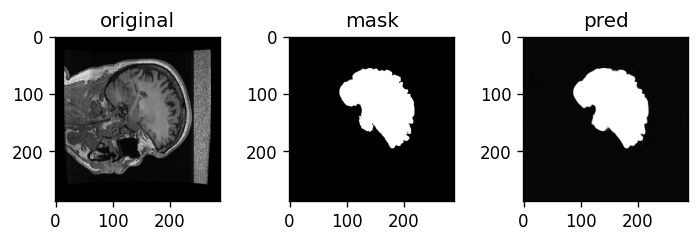

Train: Epoch 3 | Batch: 110 | Combined Loss: 0.5176785588264465 | BCE 0.10668295621871948 | dice_loss 0.41099560260772705
Train: Epoch 3 | Batch: 120 | Combined Loss: 0.41221821308135986 | BCE 0.09307372570037842 | dice_loss 0.31914448738098145
Train: Epoch 3 | Batch: 130 | Combined Loss: 0.43232160806655884 | BCE 0.09517760574817657 | dice_loss 0.33714401721954346
Train: Epoch 3 | Batch: 140 | Combined Loss: 0.47492289543151855 | BCE 0.10025042295455933 | dice_loss 0.37467247247695923
Train: Epoch 3 | Batch: 150 | Combined Loss: 0.5006726384162903 | BCE 0.10261036455631256 | dice_loss 0.3980622887611389
Train: Epoch 3 | Batch: 160 | Combined Loss: 0.4097464382648468 | BCE 0.09119025617837906 | dice_loss 0.31855618953704834
Train: Epoch 3 | Batch: 170 | Combined Loss: 0.44836655259132385 | BCE 0.09651610255241394 | dice_loss 0.3518504500389099
Train: Epoch 3 | Batch: 180 | Combined Loss: 0.4163576066493988 | BCE 0.09194299578666687 | dice_loss 0.32441461086273193
Train: Epoch 3 | Batch

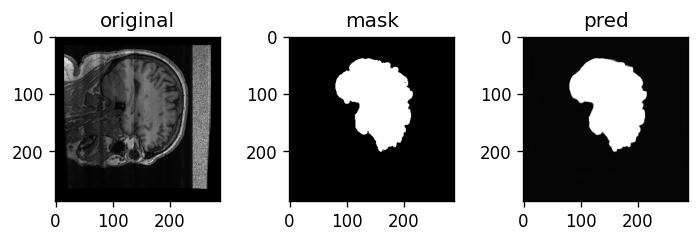

Train: Epoch 3 | Batch: 210 | Combined Loss: 0.3520292043685913 | BCE 0.08244282752275467 | dice_loss 0.26958638429641724
Train: Epoch 3 | Batch: 220 | Combined Loss: 0.3667156398296356 | BCE 0.08418020606040955 | dice_loss 0.2825354337692261
Train: Epoch 3 | Batch: 230 | Combined Loss: 0.28372204303741455 | BCE 0.07384126633405685 | dice_loss 0.2098807692527771
Train: Epoch 3 | Batch: 240 | Combined Loss: 0.36210349202156067 | BCE 0.08165201544761658 | dice_loss 0.2804514765739441
Train: Epoch 3 | Batch: 250 | Combined Loss: 0.3922730088233948 | BCE 0.08414529263973236 | dice_loss 0.3081277012825012
Train: Epoch 3 | Batch: 260 | Combined Loss: 0.3666602671146393 | BCE 0.08328165858983994 | dice_loss 0.28337860107421875
Train: Epoch 3 | Batch: 270 | Combined Loss: 0.4795951843261719 | BCE 0.09370489418506622 | dice_loss 0.38589030504226685
Train: Epoch 3 | Batch: 280 | Combined Loss: 0.32412034273147583 | BCE 0.07563169300556183 | dice_loss 0.2484886646270752
Train: Epoch 3 | Batch: 29

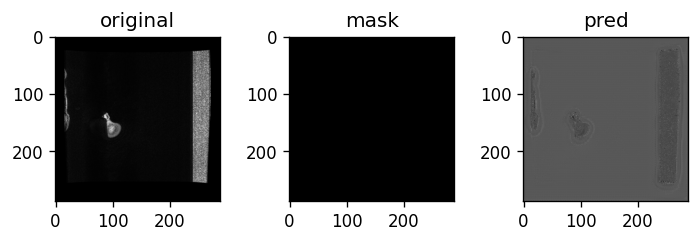

Train: Epoch 3 | Batch: 310 | Combined Loss: 0.31011664867401123 | BCE 0.07326458394527435 | dice_loss 0.23685204982757568
Train: Epoch 3 | Batch: 320 | Combined Loss: 0.5401315689086914 | BCE 0.09383181482553482 | dice_loss 0.4462997317314148
Train: Epoch 3 | Batch: 330 | Combined Loss: 0.45800578594207764 | BCE 0.09023808687925339 | dice_loss 0.36776769161224365
Train: Epoch 3 | Batch: 340 | Combined Loss: 0.4771222472190857 | BCE 0.0950617864727974 | dice_loss 0.3820604681968689
Train: Epoch 3 | Batch: 350 | Combined Loss: 0.32169094681739807 | BCE 0.07323053479194641 | dice_loss 0.24846041202545166
Train: Epoch 3 | Batch: 360 | Combined Loss: 0.46006107330322266 | BCE 0.08867819607257843 | dice_loss 0.3713828921318054
Train: Epoch 3 | Batch: 370 | Combined Loss: 0.4828910231590271 | BCE 0.08822483569383621 | dice_loss 0.3946661949157715
Train: Epoch 3 | Batch: 380 | Combined Loss: 0.349610835313797 | BCE 0.07493481785058975 | dice_loss 0.27467602491378784
Train: Epoch 3 | Batch: 39

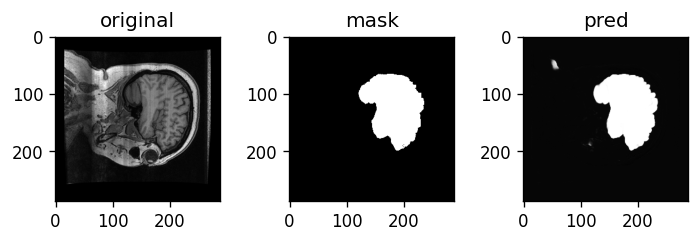

Train: Epoch 3 | Batch: 410 | Combined Loss: 0.35036346316337585 | BCE 0.07739820331335068 | dice_loss 0.2729652523994446
Train: Epoch 3 | Batch: 420 | Combined Loss: 0.38883647322654724 | BCE 0.07743994146585464 | dice_loss 0.3113965392112732
Train: Epoch 3 | Batch: 430 | Combined Loss: 0.5144528746604919 | BCE 0.09197109192609787 | dice_loss 0.4224817752838135
Train: Epoch 3 | Batch: 440 | Combined Loss: 0.3295597732067108 | BCE 0.07095417380332947 | dice_loss 0.25860559940338135
Train: Epoch 3 | Batch: 450 | Combined Loss: 0.3085591197013855 | BCE 0.06730808317661285 | dice_loss 0.24125105142593384
Train: Epoch 3 | Batch: 460 | Combined Loss: 0.2811136543750763 | BCE 0.06483910232782364 | dice_loss 0.21627455949783325
Train: Epoch 3 | Batch: 470 | Combined Loss: 0.3534039855003357 | BCE 0.07235056906938553 | dice_loss 0.28105342388153076
Train: Epoch 3 | Batch: 480 | Combined Loss: 0.33693167567253113 | BCE 0.06855353713035583 | dice_loss 0.2683781385421753
Train: Epoch 3 | Batch: 4

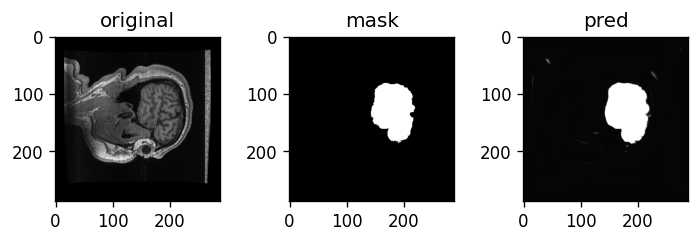

Train: Epoch 3 | Batch: 510 | Combined Loss: 0.35181036591529846 | BCE 0.07110759615898132 | dice_loss 0.28070276975631714
Avg train loss for epoch  --> 0.43658941388705524 | BCE: 0.09063177255187256 | dice_loss: 0.3459576412057324
Val: Epoch 3 | Batch: 0 | Combined Loss: 0.4097816050052643 | BCE 0.07164439558982849 | dice_loss 0.3381372094154358


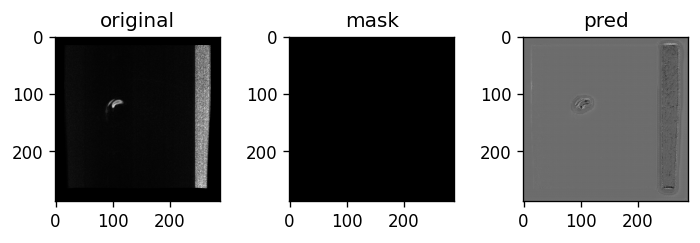

Val: Epoch 3 | Batch: 10 | Combined Loss: 0.6397303342819214 | BCE 0.07266158610582352 | dice_loss 0.5670687556266785
Val: Epoch 3 | Batch: 20 | Combined Loss: 0.5622128248214722 | BCE 0.0821046382188797 | dice_loss 0.48010820150375366
Val: Epoch 3 | Batch: 30 | Combined Loss: 0.3587067723274231 | BCE 0.07175338268280029 | dice_loss 0.2869533896446228


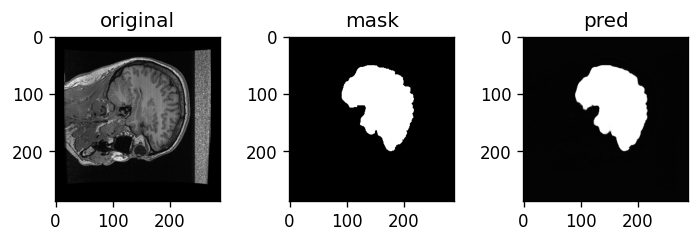

Val: Epoch 3 | Batch: 40 | Combined Loss: 0.45074397325515747 | BCE 0.07804834097623825 | dice_loss 0.3726956248283386
Val: Epoch 3 | Batch: 50 | Combined Loss: 0.4855809211730957 | BCE 0.07509444653987885 | dice_loss 0.41048645973205566
Val: Epoch 3 | Batch: 60 | Combined Loss: 0.37431398034095764 | BCE 0.07735535502433777 | dice_loss 0.2969586253166199


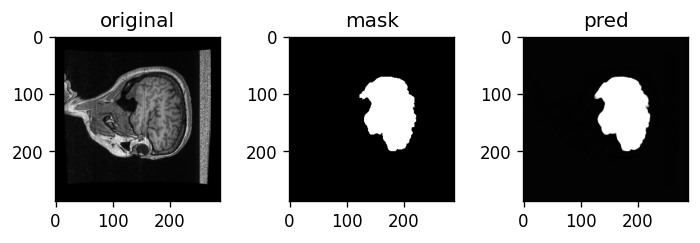

Val: Epoch 3 | Batch: 70 | Combined Loss: 0.31957846879959106 | BCE 0.07129067182540894 | dice_loss 0.24828779697418213
Val: Epoch 3 | Batch: 80 | Combined Loss: 0.3136853873729706 | BCE 0.07548811286687851 | dice_loss 0.23819726705551147
Val: Epoch 3 | Batch: 90 | Combined Loss: 0.40950626134872437 | BCE 0.0877988338470459 | dice_loss 0.32170742750167847


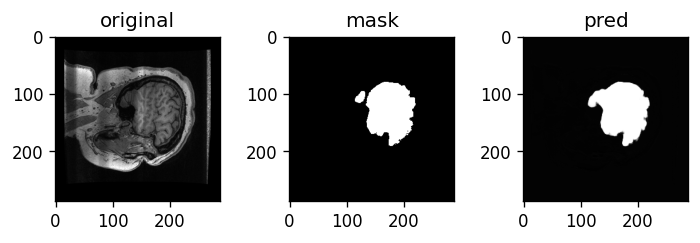

Val: Epoch 3 | Batch: 100 | Combined Loss: 0.3938099145889282 | BCE 0.07209552824497223 | dice_loss 0.3217144012451172
Val: Epoch 3 | Batch: 110 | Combined Loss: 0.3872125744819641 | BCE 0.07325684279203415 | dice_loss 0.31395572423934937
Val: Epoch 3 | Batch: 120 | Combined Loss: 0.3096965551376343 | BCE 0.07097119092941284 | dice_loss 0.23872536420822144


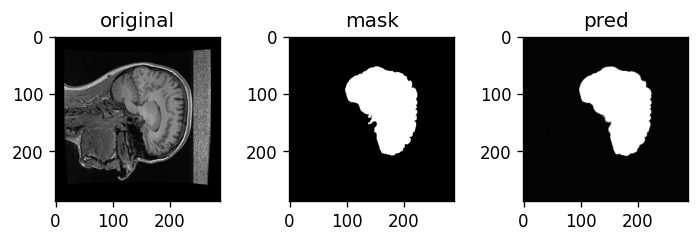

Val: Epoch 3 | Batch: 130 | Combined Loss: 0.33891233801841736 | BCE 0.07079526036977768 | dice_loss 0.2681170701980591
Average val loss for epoch  --> 0.3667764436315607 | BCE: 0.07389297413605231 | dice_loss: 0.29288346988183483
****************************************************************************************************
Train: Epoch 4 | Batch: 0 | Combined Loss: 0.2555762231349945 | BCE 0.06009361520409584 | dice_loss 0.19548261165618896


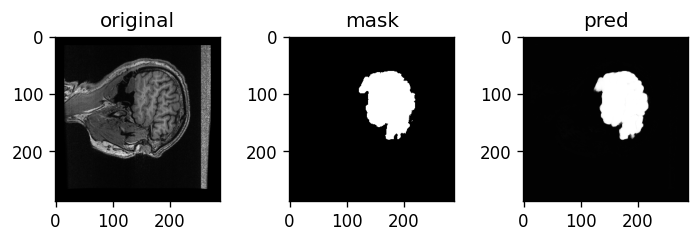

Train: Epoch 4 | Batch: 10 | Combined Loss: 0.29953068494796753 | BCE 0.06344090402126312 | dice_loss 0.2360897660255432
Train: Epoch 4 | Batch: 20 | Combined Loss: 0.355075478553772 | BCE 0.07202719897031784 | dice_loss 0.28304827213287354
Train: Epoch 4 | Batch: 30 | Combined Loss: 0.34496039152145386 | BCE 0.06883905827999115 | dice_loss 0.2761213183403015
Train: Epoch 4 | Batch: 40 | Combined Loss: 0.3005727529525757 | BCE 0.06280683726072311 | dice_loss 0.23776590824127197
Train: Epoch 4 | Batch: 50 | Combined Loss: 0.3597625494003296 | BCE 0.06775142252445221 | dice_loss 0.2920111417770386
Train: Epoch 4 | Batch: 60 | Combined Loss: 0.3976256251335144 | BCE 0.07380437105894089 | dice_loss 0.3238212466239929
Train: Epoch 4 | Batch: 70 | Combined Loss: 0.3808549642562866 | BCE 0.07003700733184814 | dice_loss 0.3108179569244385
Train: Epoch 4 | Batch: 80 | Combined Loss: 0.2479277104139328 | BCE 0.057741034775972366 | dice_loss 0.19018667936325073
Train: Epoch 4 | Batch: 90 | Combin

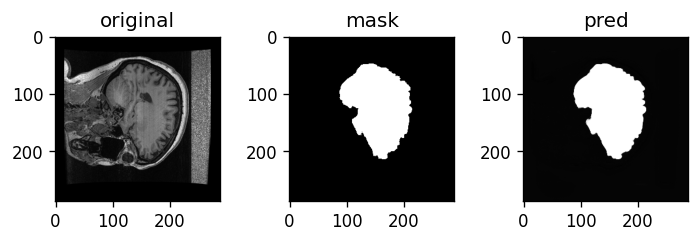

Train: Epoch 4 | Batch: 110 | Combined Loss: 0.2650703489780426 | BCE 0.05918804183602333 | dice_loss 0.20588231086730957
Train: Epoch 4 | Batch: 120 | Combined Loss: 0.39337870478630066 | BCE 0.06811049580574036 | dice_loss 0.3252682089805603
Train: Epoch 4 | Batch: 130 | Combined Loss: 0.3045225143432617 | BCE 0.0608832873404026 | dice_loss 0.24363923072814941
Train: Epoch 4 | Batch: 140 | Combined Loss: 0.4194677472114563 | BCE 0.07017946988344193 | dice_loss 0.34928828477859497
Train: Epoch 4 | Batch: 150 | Combined Loss: 0.3076155483722687 | BCE 0.0610516332089901 | dice_loss 0.24656391143798828
Train: Epoch 4 | Batch: 160 | Combined Loss: 0.4184715151786804 | BCE 0.06829319894313812 | dice_loss 0.3501783013343811
Train: Epoch 4 | Batch: 170 | Combined Loss: 0.34576690196990967 | BCE 0.06455516815185547 | dice_loss 0.2812117338180542
Train: Epoch 4 | Batch: 180 | Combined Loss: 0.4749988913536072 | BCE 0.07287340611219406 | dice_loss 0.4021254777908325
Train: Epoch 4 | Batch: 190 

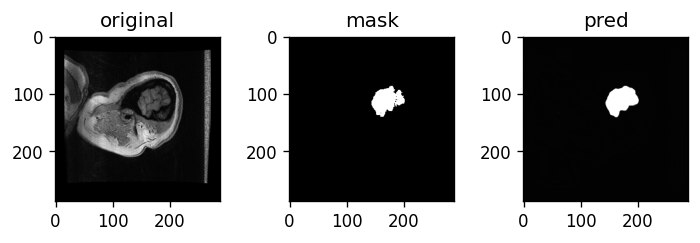

Train: Epoch 4 | Batch: 210 | Combined Loss: 0.3135041892528534 | BCE 0.05841848626732826 | dice_loss 0.25508570671081543
Train: Epoch 4 | Batch: 220 | Combined Loss: 0.36329466104507446 | BCE 0.06438189744949341 | dice_loss 0.29891276359558105
Train: Epoch 4 | Batch: 230 | Combined Loss: 0.4065151810646057 | BCE 0.06646168977022171 | dice_loss 0.3400534987449646
Train: Epoch 4 | Batch: 240 | Combined Loss: 0.32303574681282043 | BCE 0.05899670720100403 | dice_loss 0.2640390396118164
Train: Epoch 4 | Batch: 250 | Combined Loss: 0.3184070289134979 | BCE 0.057827550917863846 | dice_loss 0.2605794668197632
Train: Epoch 4 | Batch: 260 | Combined Loss: 0.26606714725494385 | BCE 0.05351041257381439 | dice_loss 0.21255671977996826
Train: Epoch 4 | Batch: 270 | Combined Loss: 0.3019165098667145 | BCE 0.05830629914999008 | dice_loss 0.2436102032661438
Train: Epoch 4 | Batch: 280 | Combined Loss: 0.2186691164970398 | BCE 0.04852127656340599 | dice_loss 0.1701478362083435
Train: Epoch 4 | Batch: 2

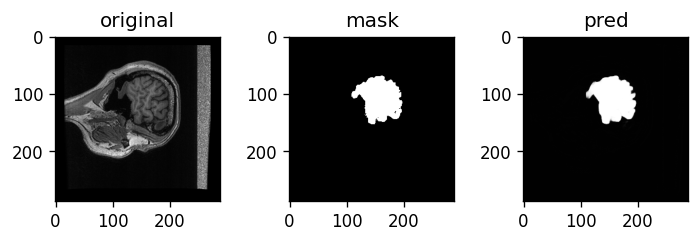

Train: Epoch 4 | Batch: 310 | Combined Loss: 0.35969263315200806 | BCE 0.0599098801612854 | dice_loss 0.29978275299072266
Train: Epoch 4 | Batch: 320 | Combined Loss: 0.325437068939209 | BCE 0.05696295574307442 | dice_loss 0.26847410202026367
Train: Epoch 4 | Batch: 330 | Combined Loss: 0.43621715903282166 | BCE 0.06434943526983261 | dice_loss 0.37186771631240845
Train: Epoch 4 | Batch: 340 | Combined Loss: 0.3119119703769684 | BCE 0.05464920029044151 | dice_loss 0.2572627663612366
Train: Epoch 4 | Batch: 350 | Combined Loss: 0.27304553985595703 | BCE 0.0522606298327446 | dice_loss 0.22078490257263184
Train: Epoch 4 | Batch: 360 | Combined Loss: 0.334023654460907 | BCE 0.05674171447753906 | dice_loss 0.2772819399833679
Train: Epoch 4 | Batch: 370 | Combined Loss: 0.25156185030937195 | BCE 0.049460917711257935 | dice_loss 0.202100932598114
Train: Epoch 4 | Batch: 380 | Combined Loss: 0.2735641300678253 | BCE 0.05192258208990097 | dice_loss 0.22164154052734375
Train: Epoch 4 | Batch: 390

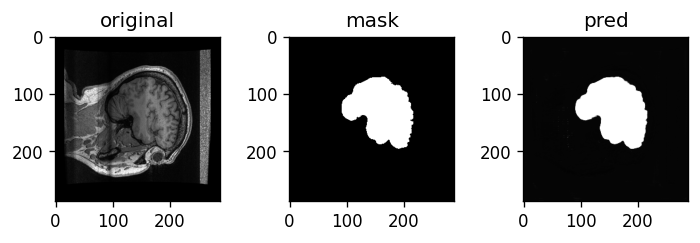

Train: Epoch 4 | Batch: 410 | Combined Loss: 0.2729035019874573 | BCE 0.04997844621539116 | dice_loss 0.222925066947937
Train: Epoch 4 | Batch: 420 | Combined Loss: 0.2317826896905899 | BCE 0.04616476222872734 | dice_loss 0.18561792373657227
Train: Epoch 4 | Batch: 430 | Combined Loss: 0.26003411412239075 | BCE 0.04981968179345131 | dice_loss 0.21021443605422974
Train: Epoch 4 | Batch: 440 | Combined Loss: 0.24465245008468628 | BCE 0.046922508627176285 | dice_loss 0.1977299451828003
Train: Epoch 4 | Batch: 450 | Combined Loss: 0.26092177629470825 | BCE 0.04928220808506012 | dice_loss 0.21163958311080933
Train: Epoch 4 | Batch: 460 | Combined Loss: 0.19257397949695587 | BCE 0.04230107367038727 | dice_loss 0.1502729058265686
Train: Epoch 4 | Batch: 470 | Combined Loss: 0.29202911257743835 | BCE 0.05020609125494957 | dice_loss 0.2418230175971985
Train: Epoch 4 | Batch: 480 | Combined Loss: 0.24095280468463898 | BCE 0.04915858432650566 | dice_loss 0.19179421663284302
Train: Epoch 4 | Batch

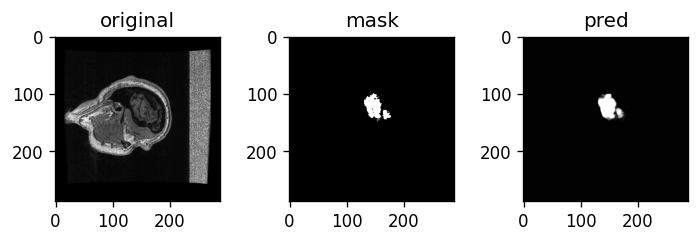

Train: Epoch 4 | Batch: 510 | Combined Loss: 0.2056727111339569 | BCE 0.04298373684287071 | dice_loss 0.1626889705657959
Avg train loss for epoch  --> 0.3138619460539468 | BCE: 0.05827817867391358 | dice_loss: 0.2555837669197657
Val: Epoch 4 | Batch: 0 | Combined Loss: 0.2931773364543915 | BCE 0.046592917293310165 | dice_loss 0.24658441543579102


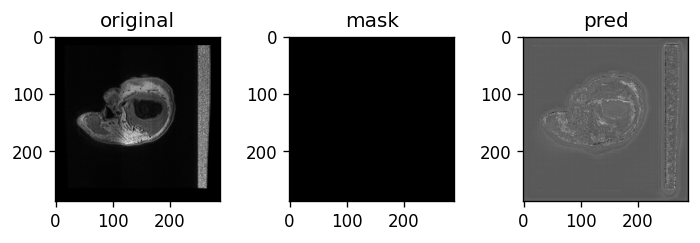

Val: Epoch 4 | Batch: 10 | Combined Loss: 0.2640789747238159 | BCE 0.04612521827220917 | dice_loss 0.21795374155044556
Val: Epoch 4 | Batch: 20 | Combined Loss: 0.3219519555568695 | BCE 0.046703316271305084 | dice_loss 0.275248646736145
Val: Epoch 4 | Batch: 30 | Combined Loss: 0.2165989875793457 | BCE 0.04573219642043114 | dice_loss 0.17086678743362427


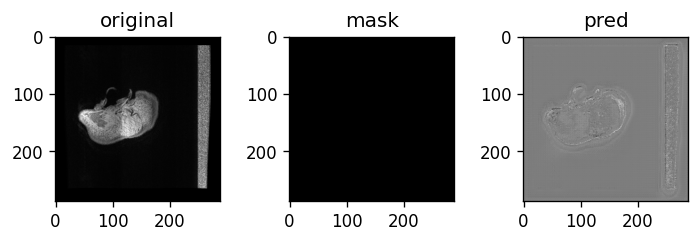

Val: Epoch 4 | Batch: 40 | Combined Loss: 0.28061047196388245 | BCE 0.04570050910115242 | dice_loss 0.23490995168685913
Val: Epoch 4 | Batch: 50 | Combined Loss: 0.3045103847980499 | BCE 0.046846307814121246 | dice_loss 0.2576640844345093
Val: Epoch 4 | Batch: 60 | Combined Loss: 0.26218748092651367 | BCE 0.0469772145152092 | dice_loss 0.21521025896072388


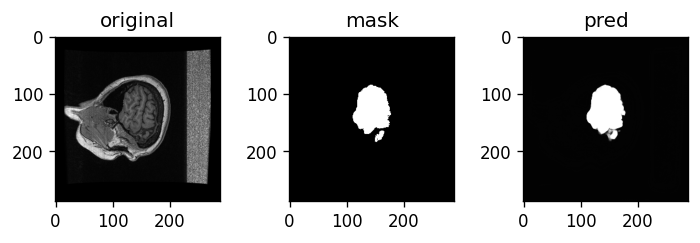

Val: Epoch 4 | Batch: 70 | Combined Loss: 0.2402254045009613 | BCE 0.04543420299887657 | dice_loss 0.19479119777679443
Val: Epoch 4 | Batch: 80 | Combined Loss: 0.2108747810125351 | BCE 0.04578546807169914 | dice_loss 0.16508930921554565
Val: Epoch 4 | Batch: 90 | Combined Loss: 0.265618234872818 | BCE 0.04614522308111191 | dice_loss 0.2194730043411255


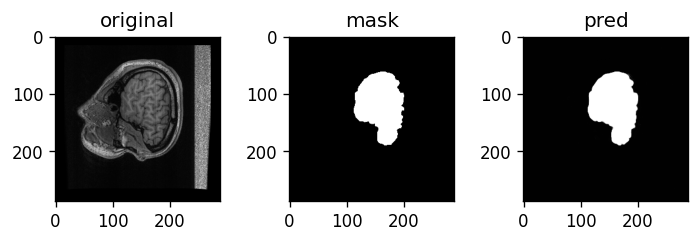

Val: Epoch 4 | Batch: 100 | Combined Loss: 0.2582542598247528 | BCE 0.04482986778020859 | dice_loss 0.21342438459396362
Val: Epoch 4 | Batch: 110 | Combined Loss: 0.21892540156841278 | BCE 0.04481576755642891 | dice_loss 0.17410963773727417
Val: Epoch 4 | Batch: 120 | Combined Loss: 0.22305728495121002 | BCE 0.04640134051442146 | dice_loss 0.17665594816207886


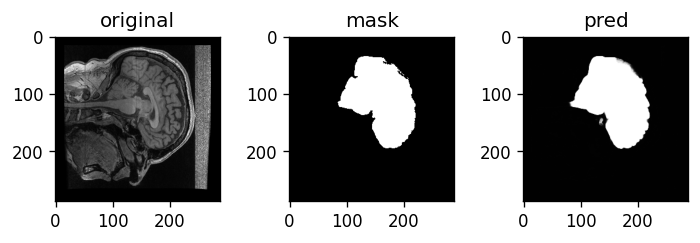

Val: Epoch 4 | Batch: 130 | Combined Loss: 0.2540382742881775 | BCE 0.0446355827152729 | dice_loss 0.2094026803970337
Average val loss for epoch  --> 0.2556099956786191 | BCE: 0.046350608931647407 | dice_loss: 0.20925938641583477
****************************************************************************************************
Train: Epoch 5 | Batch: 0 | Combined Loss: 0.22193767130374908 | BCE 0.043227989226579666 | dice_loss 0.17870968580245972


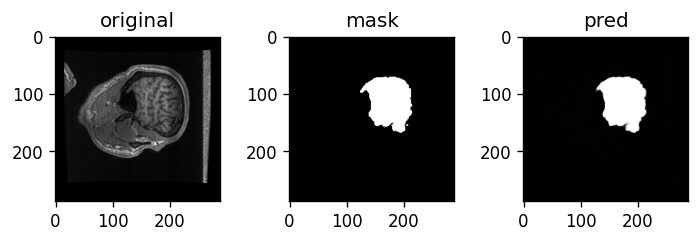

Train: Epoch 5 | Batch: 10 | Combined Loss: 0.23286966979503632 | BCE 0.044418204575777054 | dice_loss 0.18845146894454956
Train: Epoch 5 | Batch: 20 | Combined Loss: 0.21733389794826508 | BCE 0.043259840458631516 | dice_loss 0.17407405376434326
Train: Epoch 5 | Batch: 30 | Combined Loss: 0.2605944275856018 | BCE 0.04741077497601509 | dice_loss 0.21318364143371582
Train: Epoch 5 | Batch: 40 | Combined Loss: 0.19465520977973938 | BCE 0.03937361016869545 | dice_loss 0.15528160333633423
Train: Epoch 5 | Batch: 50 | Combined Loss: 0.24753426015377045 | BCE 0.04505084082484245 | dice_loss 0.2024834156036377
Train: Epoch 5 | Batch: 60 | Combined Loss: 0.24411243200302124 | BCE 0.045874305069446564 | dice_loss 0.19823813438415527
Train: Epoch 5 | Batch: 70 | Combined Loss: 0.240494966506958 | BCE 0.04358106106519699 | dice_loss 0.19691389799118042
Train: Epoch 5 | Batch: 80 | Combined Loss: 0.15023621916770935 | BCE 0.03630790486931801 | dice_loss 0.11392831802368164
Train: Epoch 5 | Batch: 9

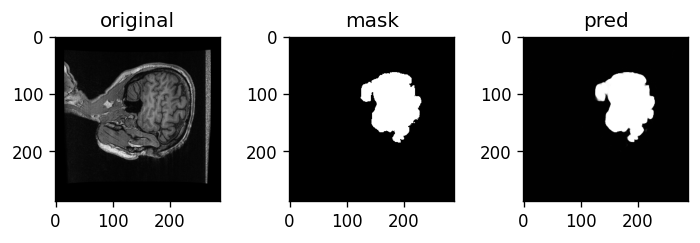

Train: Epoch 5 | Batch: 110 | Combined Loss: 0.38618674874305725 | BCE 0.052346207201480865 | dice_loss 0.333840548992157
Train: Epoch 5 | Batch: 120 | Combined Loss: 0.27005597949028015 | BCE 0.04469035193324089 | dice_loss 0.22536563873291016
Train: Epoch 5 | Batch: 130 | Combined Loss: 0.24344973266124725 | BCE 0.043098192662000656 | dice_loss 0.2003515362739563
Train: Epoch 5 | Batch: 140 | Combined Loss: 0.3009166717529297 | BCE 0.0480739027261734 | dice_loss 0.2528427839279175
Train: Epoch 5 | Batch: 150 | Combined Loss: 0.323159784078598 | BCE 0.04788712039589882 | dice_loss 0.2752726674079895
Train: Epoch 5 | Batch: 160 | Combined Loss: 0.3326043486595154 | BCE 0.04996579512953758 | dice_loss 0.2826385498046875
Train: Epoch 5 | Batch: 170 | Combined Loss: 0.2475731372833252 | BCE 0.04493093118071556 | dice_loss 0.20264220237731934
Train: Epoch 5 | Batch: 180 | Combined Loss: 0.24192287027835846 | BCE 0.0419810526072979 | dice_loss 0.19994181394577026
Train: Epoch 5 | Batch: 190

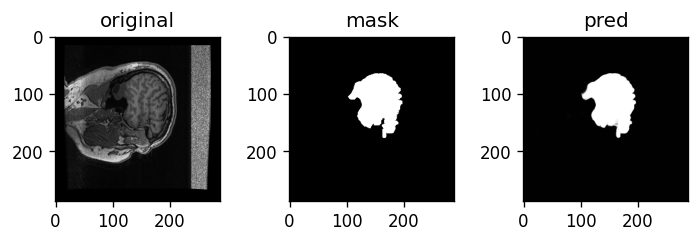

Train: Epoch 5 | Batch: 210 | Combined Loss: 0.3209950029850006 | BCE 0.04754529520869255 | dice_loss 0.27344971895217896
Train: Epoch 5 | Batch: 220 | Combined Loss: 0.21403750777244568 | BCE 0.04136470705270767 | dice_loss 0.1726728081703186
Train: Epoch 5 | Batch: 230 | Combined Loss: 0.1859055459499359 | BCE 0.037200186401605606 | dice_loss 0.1487053632736206
Train: Epoch 5 | Batch: 240 | Combined Loss: 0.23676344752311707 | BCE 0.040490832179784775 | dice_loss 0.196272611618042
Train: Epoch 5 | Batch: 250 | Combined Loss: 0.158977672457695 | BCE 0.0371277816593647 | dice_loss 0.1218498945236206
Train: Epoch 5 | Batch: 260 | Combined Loss: 0.19262295961380005 | BCE 0.03764605149626732 | dice_loss 0.15497690439224243
Train: Epoch 5 | Batch: 270 | Combined Loss: 0.22818274796009064 | BCE 0.04075570032000542 | dice_loss 0.18742704391479492
Train: Epoch 5 | Batch: 280 | Combined Loss: 0.18066473305225372 | BCE 0.036554884165525436 | dice_loss 0.144109845161438
Train: Epoch 5 | Batch: 2

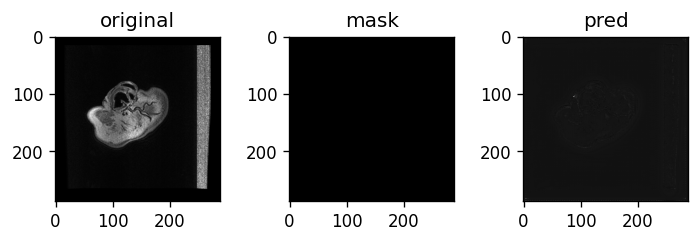

Train: Epoch 5 | Batch: 310 | Combined Loss: 0.2194458246231079 | BCE 0.041052576154470444 | dice_loss 0.17839324474334717
Train: Epoch 5 | Batch: 320 | Combined Loss: 0.2203899621963501 | BCE 0.03898113593459129 | dice_loss 0.1814088225364685
Train: Epoch 5 | Batch: 330 | Combined Loss: 0.2290566861629486 | BCE 0.03957238048315048 | dice_loss 0.18948429822921753
Train: Epoch 5 | Batch: 340 | Combined Loss: 0.2522106468677521 | BCE 0.03989938646554947 | dice_loss 0.2123112678527832
Train: Epoch 5 | Batch: 350 | Combined Loss: 0.2010209709405899 | BCE 0.037362948060035706 | dice_loss 0.1636580228805542
Train: Epoch 5 | Batch: 360 | Combined Loss: 0.22733822464942932 | BCE 0.038158565759658813 | dice_loss 0.1891796588897705
Train: Epoch 5 | Batch: 370 | Combined Loss: 0.265575647354126 | BCE 0.04021131619811058 | dice_loss 0.2253643274307251
Train: Epoch 5 | Batch: 380 | Combined Loss: 0.19210872054100037 | BCE 0.035388506948947906 | dice_loss 0.15672022104263306
Train: Epoch 5 | Batch: 

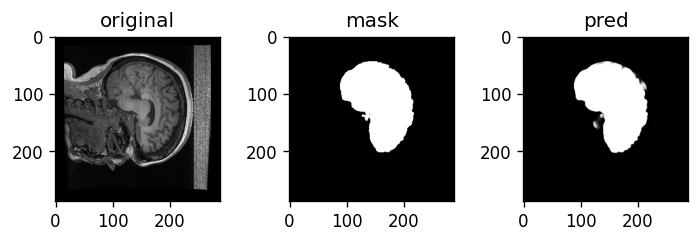

Train: Epoch 5 | Batch: 410 | Combined Loss: 0.1656368225812912 | BCE 0.03291432559490204 | dice_loss 0.13272249698638916
Train: Epoch 5 | Batch: 420 | Combined Loss: 0.22785985469818115 | BCE 0.038403868675231934 | dice_loss 0.18945598602294922
Train: Epoch 5 | Batch: 430 | Combined Loss: 0.33526861667633057 | BCE 0.042808838188648224 | dice_loss 0.29245978593826294
Train: Epoch 5 | Batch: 440 | Combined Loss: 0.22761985659599304 | BCE 0.03653278574347496 | dice_loss 0.19108706712722778
Train: Epoch 5 | Batch: 450 | Combined Loss: 0.15728121995925903 | BCE 0.03784608840942383 | dice_loss 0.1194351315498352
Train: Epoch 5 | Batch: 460 | Combined Loss: 0.369671493768692 | BCE 0.04515203833580017 | dice_loss 0.32451945543289185
Train: Epoch 5 | Batch: 470 | Combined Loss: 0.19860832393169403 | BCE 0.03404580429196358 | dice_loss 0.16456252336502075
Train: Epoch 5 | Batch: 480 | Combined Loss: 0.1904963105916977 | BCE 0.03360728546977043 | dice_loss 0.15688902139663696
Train: Epoch 5 | Ba

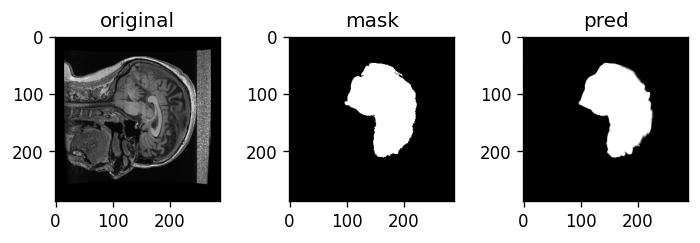

Train: Epoch 5 | Batch: 510 | Combined Loss: 0.12954413890838623 | BCE 0.028512420132756233 | dice_loss 0.10103172063827515
Avg train loss for epoch  --> 0.2290873552985403 | BCE: 0.040297796946148386 | dice_loss: 0.18878955857173815
Val: Epoch 5 | Batch: 0 | Combined Loss: 0.19614824652671814 | BCE 0.03322460502386093 | dice_loss 0.1629236340522766


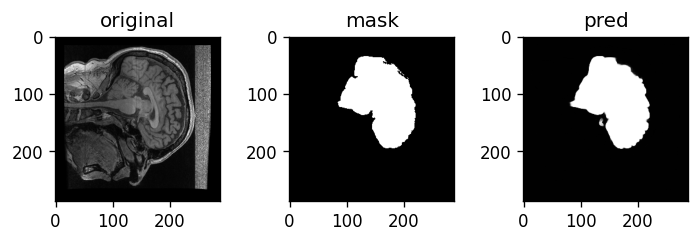

Val: Epoch 5 | Batch: 10 | Combined Loss: 0.16322261095046997 | BCE 0.03279811888933182 | dice_loss 0.13042449951171875
Val: Epoch 5 | Batch: 20 | Combined Loss: 0.17754627764225006 | BCE 0.03229684755206108 | dice_loss 0.14524942636489868
Val: Epoch 5 | Batch: 30 | Combined Loss: 0.19050681591033936 | BCE 0.03187780827283859 | dice_loss 0.15862900018692017


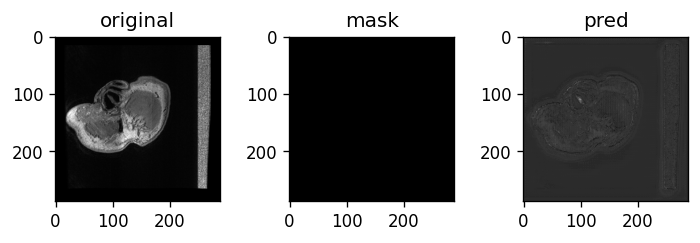

Val: Epoch 5 | Batch: 40 | Combined Loss: 0.24327252805233002 | BCE 0.03267918899655342 | dice_loss 0.2105933427810669
Val: Epoch 5 | Batch: 50 | Combined Loss: 0.2079107016324997 | BCE 0.0326492004096508 | dice_loss 0.1752614974975586
Val: Epoch 5 | Batch: 60 | Combined Loss: 0.17299440503120422 | BCE 0.03258243203163147 | dice_loss 0.14041197299957275


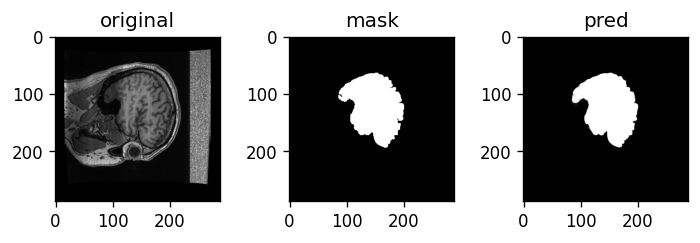

Val: Epoch 5 | Batch: 70 | Combined Loss: 0.18406136333942413 | BCE 0.031998228281736374 | dice_loss 0.15206313133239746
Val: Epoch 5 | Batch: 80 | Combined Loss: 0.17212355136871338 | BCE 0.03357558697462082 | dice_loss 0.13854795694351196
Val: Epoch 5 | Batch: 90 | Combined Loss: 0.1513727605342865 | BCE 0.03318234533071518 | dice_loss 0.11819040775299072


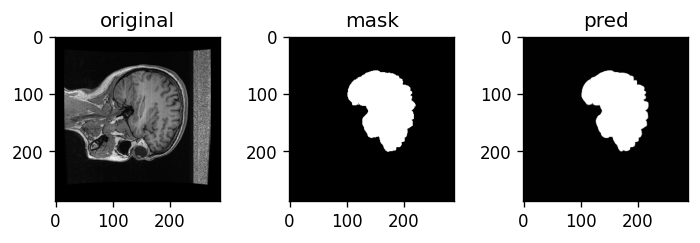

Val: Epoch 5 | Batch: 100 | Combined Loss: 0.1803433895111084 | BCE 0.03345203399658203 | dice_loss 0.14689135551452637
Val: Epoch 5 | Batch: 110 | Combined Loss: 0.1975264847278595 | BCE 0.036077115684747696 | dice_loss 0.1614493727684021
Val: Epoch 5 | Batch: 120 | Combined Loss: 0.15604862570762634 | BCE 0.03338732570409775 | dice_loss 0.122661292552948


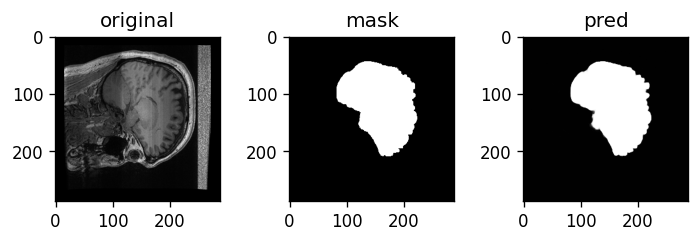

Val: Epoch 5 | Batch: 130 | Combined Loss: 0.223617285490036 | BCE 0.03500250726938248 | dice_loss 0.18861478567123413
Average val loss for epoch  --> 0.19130303771407517 | BCE: 0.03317331633082143 | dice_loss: 0.1581297212176853
****************************************************************************************************
Train: Epoch 6 | Batch: 0 | Combined Loss: 0.18461188673973083 | BCE 0.03239741921424866 | dice_loss 0.15221446752548218


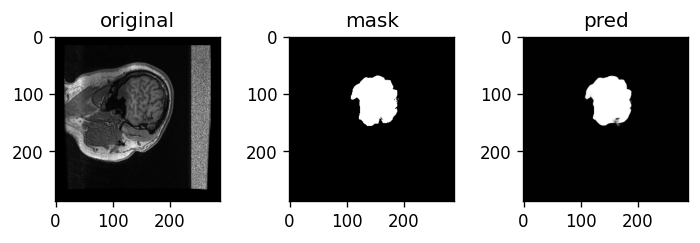

Train: Epoch 6 | Batch: 10 | Combined Loss: 0.16113348305225372 | BCE 0.03268368914723396 | dice_loss 0.12844979763031006
Train: Epoch 6 | Batch: 20 | Combined Loss: 0.2026401162147522 | BCE 0.034576114267110825 | dice_loss 0.16806399822235107
Train: Epoch 6 | Batch: 30 | Combined Loss: 0.2871370315551758 | BCE 0.04356503114104271 | dice_loss 0.24357199668884277
Train: Epoch 6 | Batch: 40 | Combined Loss: 0.3467525839805603 | BCE 0.058324821293354034 | dice_loss 0.28842777013778687
Train: Epoch 6 | Batch: 50 | Combined Loss: 0.29877737164497375 | BCE 0.04436483979225159 | dice_loss 0.25441253185272217
Train: Epoch 6 | Batch: 60 | Combined Loss: 0.13018719851970673 | BCE 0.029843254014849663 | dice_loss 0.10034394264221191
Train: Epoch 6 | Batch: 70 | Combined Loss: 0.21270443499088287 | BCE 0.03436465188860893 | dice_loss 0.17833977937698364
Train: Epoch 6 | Batch: 80 | Combined Loss: 0.2753753364086151 | BCE 0.03840015456080437 | dice_loss 0.23697519302368164
Train: Epoch 6 | Batch: 9

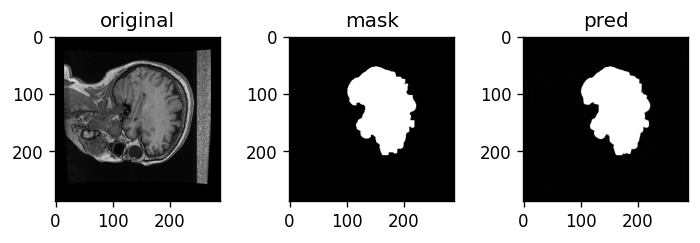

Train: Epoch 6 | Batch: 110 | Combined Loss: 0.20049965381622314 | BCE 0.03247886523604393 | dice_loss 0.16802078485488892
Train: Epoch 6 | Batch: 120 | Combined Loss: 0.20254115760326385 | BCE 0.0334654338657856 | dice_loss 0.16907572746276855
Train: Epoch 6 | Batch: 130 | Combined Loss: 0.25791260600090027 | BCE 0.03613604977726936 | dice_loss 0.22177654504776
Train: Epoch 6 | Batch: 140 | Combined Loss: 0.13849042356014252 | BCE 0.028487373143434525 | dice_loss 0.11000305414199829
Train: Epoch 6 | Batch: 150 | Combined Loss: 0.19635654985904694 | BCE 0.032773151993751526 | dice_loss 0.1635833978652954
Train: Epoch 6 | Batch: 160 | Combined Loss: 0.1653090864419937 | BCE 0.029263390228152275 | dice_loss 0.1360456943511963
Train: Epoch 6 | Batch: 170 | Combined Loss: 0.1340918242931366 | BCE 0.027949899435043335 | dice_loss 0.10614192485809326
Train: Epoch 6 | Batch: 180 | Combined Loss: 0.1734079271554947 | BCE 0.0309385247528553 | dice_loss 0.1424694061279297
Train: Epoch 6 | Batch:

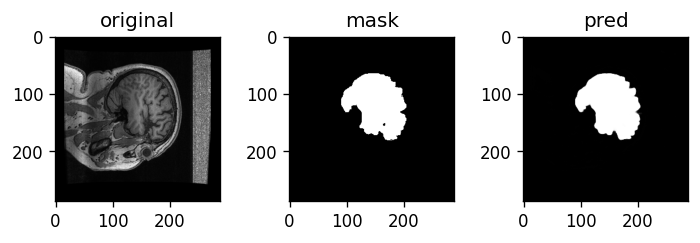

Train: Epoch 6 | Batch: 210 | Combined Loss: 0.16186471283435822 | BCE 0.030357254669070244 | dice_loss 0.13150745630264282
Train: Epoch 6 | Batch: 220 | Combined Loss: 0.19355207681655884 | BCE 0.029388664290308952 | dice_loss 0.16416341066360474
Train: Epoch 6 | Batch: 230 | Combined Loss: 0.15925182402133942 | BCE 0.028678078204393387 | dice_loss 0.13057374954223633
Train: Epoch 6 | Batch: 240 | Combined Loss: 0.18789491057395935 | BCE 0.029868749901652336 | dice_loss 0.15802615880966187
Train: Epoch 6 | Batch: 250 | Combined Loss: 0.18236102163791656 | BCE 0.029452040791511536 | dice_loss 0.15290898084640503
Train: Epoch 6 | Batch: 260 | Combined Loss: 0.13628393411636353 | BCE 0.02559799700975418 | dice_loss 0.11068594455718994
Train: Epoch 6 | Batch: 270 | Combined Loss: 0.10879946500062943 | BCE 0.024017343297600746 | dice_loss 0.08478212356567383
Train: Epoch 6 | Batch: 280 | Combined Loss: 0.18337418138980865 | BCE 0.02768351510167122 | dice_loss 0.15569067001342773
Train: Epo

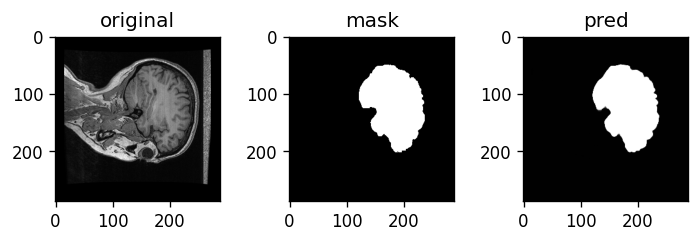

Train: Epoch 6 | Batch: 310 | Combined Loss: 0.1450728476047516 | BCE 0.02724752016365528 | dice_loss 0.11782532930374146
Train: Epoch 6 | Batch: 320 | Combined Loss: 0.12795521318912506 | BCE 0.02542639710009098 | dice_loss 0.10252881050109863
Train: Epoch 6 | Batch: 330 | Combined Loss: 0.10145710408687592 | BCE 0.02316420152783394 | dice_loss 0.07829290628433228
Train: Epoch 6 | Batch: 340 | Combined Loss: 0.10479319095611572 | BCE 0.023799780756235123 | dice_loss 0.0809934139251709
Train: Epoch 6 | Batch: 350 | Combined Loss: 0.15342417359352112 | BCE 0.02646728605031967 | dice_loss 0.12695688009262085
Train: Epoch 6 | Batch: 360 | Combined Loss: 0.22697490453720093 | BCE 0.031094254925847054 | dice_loss 0.19588065147399902
Train: Epoch 6 | Batch: 370 | Combined Loss: 0.12026801705360413 | BCE 0.02535555139183998 | dice_loss 0.09491246938705444
Train: Epoch 6 | Batch: 380 | Combined Loss: 0.17345990240573883 | BCE 0.029102163389325142 | dice_loss 0.14435774087905884
Train: Epoch 6 

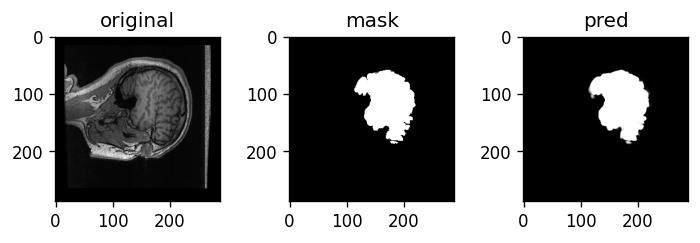

Train: Epoch 6 | Batch: 410 | Combined Loss: 0.15351080894470215 | BCE 0.027415750548243523 | dice_loss 0.12609505653381348
Train: Epoch 6 | Batch: 420 | Combined Loss: 0.18472224473953247 | BCE 0.0285226721316576 | dice_loss 0.15619957447052002
Train: Epoch 6 | Batch: 430 | Combined Loss: 0.13982084393501282 | BCE 0.02495405077934265 | dice_loss 0.11486679315567017
Train: Epoch 6 | Batch: 440 | Combined Loss: 0.15249618887901306 | BCE 0.026897937059402466 | dice_loss 0.1255982518196106
Train: Epoch 6 | Batch: 450 | Combined Loss: 0.1413254737854004 | BCE 0.0256266538053751 | dice_loss 0.11569881439208984
Train: Epoch 6 | Batch: 460 | Combined Loss: 0.1442089080810547 | BCE 0.025176580995321274 | dice_loss 0.11903232336044312
Train: Epoch 6 | Batch: 470 | Combined Loss: 0.16951125860214233 | BCE 0.02590280957520008 | dice_loss 0.1436084508895874
Train: Epoch 6 | Batch: 480 | Combined Loss: 0.12212024629116058 | BCE 0.02346746437251568 | dice_loss 0.09865278005599976
Train: Epoch 6 | Ba

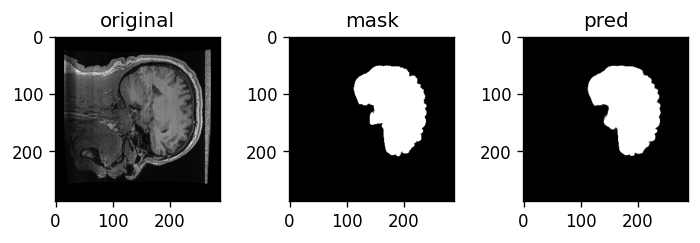

Train: Epoch 6 | Batch: 510 | Combined Loss: 0.14335909485816956 | BCE 0.02392777055501938 | dice_loss 0.11943131685256958
Avg train loss for epoch  --> 0.1700738014861884 | BCE: 0.02948664904403065 | dice_loss: 0.1405871524313702
Val: Epoch 6 | Batch: 0 | Combined Loss: 0.1427498459815979 | BCE 0.02389579638838768 | dice_loss 0.11885404586791992


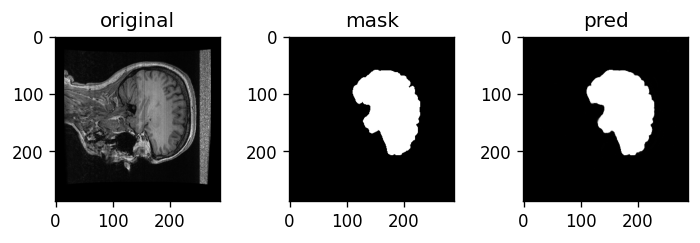

Val: Epoch 6 | Batch: 10 | Combined Loss: 0.1527738720178604 | BCE 0.025689611211419106 | dice_loss 0.12708425521850586
Val: Epoch 6 | Batch: 20 | Combined Loss: 0.17143788933753967 | BCE 0.02413954958319664 | dice_loss 0.14729833602905273
Val: Epoch 6 | Batch: 30 | Combined Loss: 0.16361868381500244 | BCE 0.0260471124202013 | dice_loss 0.1375715732574463


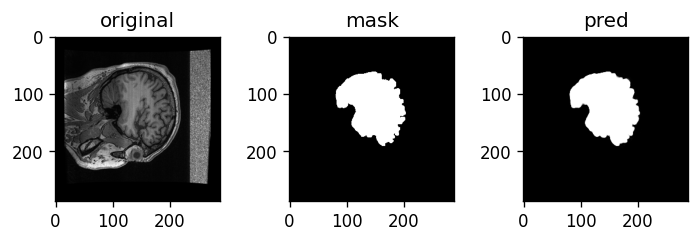

Val: Epoch 6 | Batch: 40 | Combined Loss: 0.14032083749771118 | BCE 0.024532439187169075 | dice_loss 0.11578840017318726
Val: Epoch 6 | Batch: 50 | Combined Loss: 0.14263956248760223 | BCE 0.02635679766535759 | dice_loss 0.11628276109695435
Val: Epoch 6 | Batch: 60 | Combined Loss: 0.13329645991325378 | BCE 0.025680577382445335 | dice_loss 0.1076158881187439


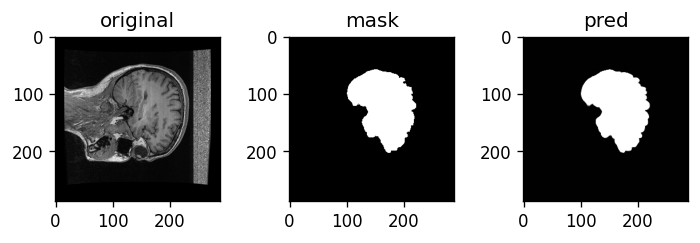

Val: Epoch 6 | Batch: 70 | Combined Loss: 0.1402376890182495 | BCE 0.026918772608041763 | dice_loss 0.11331892013549805
Val: Epoch 6 | Batch: 80 | Combined Loss: 0.1314803659915924 | BCE 0.024832693859934807 | dice_loss 0.10664767026901245
Val: Epoch 6 | Batch: 90 | Combined Loss: 0.11543147265911102 | BCE 0.02534673921763897 | dice_loss 0.0900847315788269


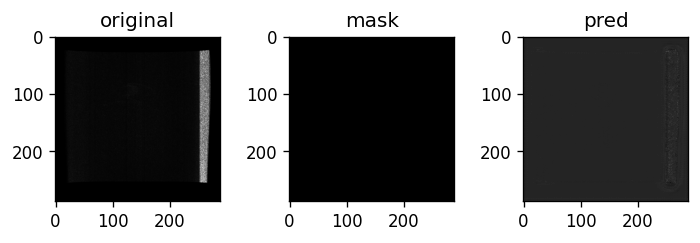

Val: Epoch 6 | Batch: 100 | Combined Loss: 0.13885556161403656 | BCE 0.024581173434853554 | dice_loss 0.11427438259124756
Val: Epoch 6 | Batch: 110 | Combined Loss: 0.13189467787742615 | BCE 0.02482846938073635 | dice_loss 0.10706621408462524
Val: Epoch 6 | Batch: 120 | Combined Loss: 0.14583450555801392 | BCE 0.024609621614217758 | dice_loss 0.12122488021850586


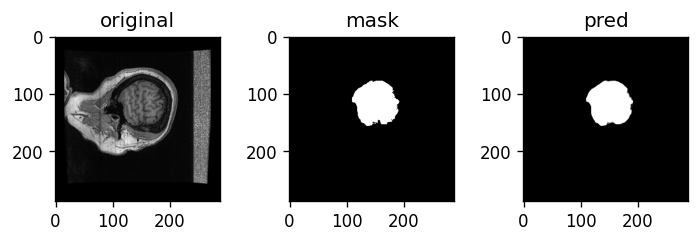

Val: Epoch 6 | Batch: 130 | Combined Loss: 0.15284428000450134 | BCE 0.023896362632513046 | dice_loss 0.128947913646698
Average val loss for epoch  --> 0.1447571716374821 | BCE: 0.02541375832149276 | dice_loss: 0.1193434132470025
****************************************************************************************************
Train: Epoch 7 | Batch: 0 | Combined Loss: 0.11123829334974289 | BCE 0.022156113758683205 | dice_loss 0.08908218145370483


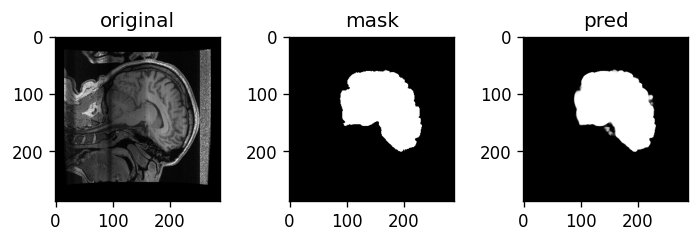

Train: Epoch 7 | Batch: 10 | Combined Loss: 0.11942869424819946 | BCE 0.022427977994084358 | dice_loss 0.09700071811676025
Train: Epoch 7 | Batch: 20 | Combined Loss: 0.17509828507900238 | BCE 0.025994347408413887 | dice_loss 0.14910393953323364
Train: Epoch 7 | Batch: 30 | Combined Loss: 0.11549345403909683 | BCE 0.02217409573495388 | dice_loss 0.0933193564414978
Train: Epoch 7 | Batch: 40 | Combined Loss: 0.12309522181749344 | BCE 0.023801393806934357 | dice_loss 0.09929382801055908
Train: Epoch 7 | Batch: 50 | Combined Loss: 0.1421484500169754 | BCE 0.024960171431303024 | dice_loss 0.11718827486038208
Train: Epoch 7 | Batch: 60 | Combined Loss: 0.15764157474040985 | BCE 0.025018854066729546 | dice_loss 0.13262271881103516
Train: Epoch 7 | Batch: 70 | Combined Loss: 0.10302536934614182 | BCE 0.02053927443921566 | dice_loss 0.082486093044281
Train: Epoch 7 | Batch: 80 | Combined Loss: 0.11546014249324799 | BCE 0.021870478987693787 | dice_loss 0.0935896635055542
Train: Epoch 7 | Batch:

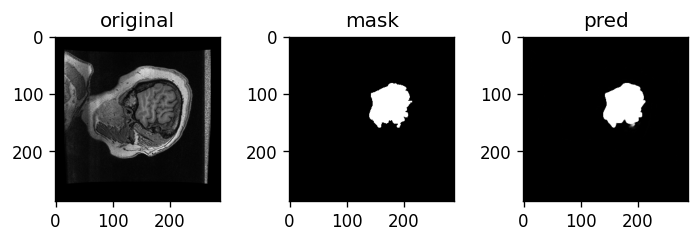

Train: Epoch 7 | Batch: 110 | Combined Loss: 0.12391894310712814 | BCE 0.022429341450333595 | dice_loss 0.1014896035194397
Train: Epoch 7 | Batch: 120 | Combined Loss: 0.2697942852973938 | BCE 0.028847642242908478 | dice_loss 0.24094665050506592
Train: Epoch 7 | Batch: 130 | Combined Loss: 0.11000329256057739 | BCE 0.02144545502960682 | dice_loss 0.08855783939361572
Train: Epoch 7 | Batch: 140 | Combined Loss: 0.20382563769817352 | BCE 0.02677159197628498 | dice_loss 0.1770540475845337
Train: Epoch 7 | Batch: 150 | Combined Loss: 0.13992775976657867 | BCE 0.024652615189552307 | dice_loss 0.11527514457702637
Train: Epoch 7 | Batch: 160 | Combined Loss: 0.16413697600364685 | BCE 0.025946758687496185 | dice_loss 0.13819020986557007
Train: Epoch 7 | Batch: 170 | Combined Loss: 0.1585056632757187 | BCE 0.024403134360909462 | dice_loss 0.13410252332687378
Train: Epoch 7 | Batch: 180 | Combined Loss: 0.08350184559822083 | BCE 0.02045324072241783 | dice_loss 0.0630486011505127
Train: Epoch 7 |

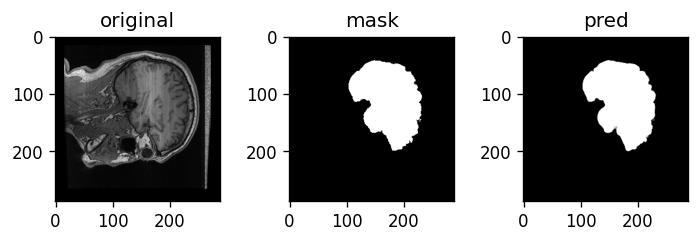

Train: Epoch 7 | Batch: 210 | Combined Loss: 0.16235849261283875 | BCE 0.02443673461675644 | dice_loss 0.1379217505455017
Train: Epoch 7 | Batch: 220 | Combined Loss: 0.10880602151155472 | BCE 0.02006048709154129 | dice_loss 0.08874553442001343
Train: Epoch 7 | Batch: 230 | Combined Loss: 0.12536932528018951 | BCE 0.022090865299105644 | dice_loss 0.10327845811843872
Train: Epoch 7 | Batch: 240 | Combined Loss: 0.11812447756528854 | BCE 0.023918502032756805 | dice_loss 0.09420597553253174
Train: Epoch 7 | Batch: 250 | Combined Loss: 0.123578742146492 | BCE 0.02124817855656147 | dice_loss 0.10233056545257568
Train: Epoch 7 | Batch: 260 | Combined Loss: 0.13435925543308258 | BCE 0.022021789103746414 | dice_loss 0.11233747005462646
Train: Epoch 7 | Batch: 270 | Combined Loss: 0.1319388449192047 | BCE 0.022649258375167847 | dice_loss 0.10928958654403687
Train: Epoch 7 | Batch: 280 | Combined Loss: 0.13144607841968536 | BCE 0.021904367953538895 | dice_loss 0.10954171419143677
Train: Epoch 7 

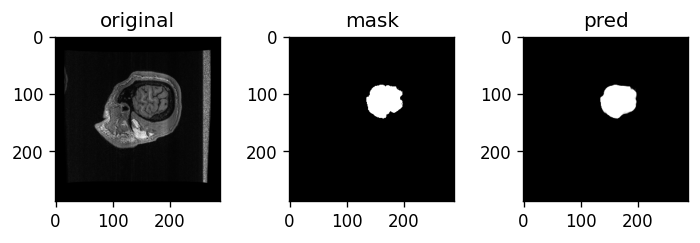

Train: Epoch 7 | Batch: 310 | Combined Loss: 0.08289077877998352 | BCE 0.01810261979699135 | dice_loss 0.06478816270828247
Train: Epoch 7 | Batch: 320 | Combined Loss: 0.1847483068704605 | BCE 0.024258866906166077 | dice_loss 0.16048943996429443
Train: Epoch 7 | Batch: 330 | Combined Loss: 0.17919586598873138 | BCE 0.023784378543496132 | dice_loss 0.1554114818572998
Train: Epoch 7 | Batch: 340 | Combined Loss: 0.074373260140419 | BCE 0.01782609149813652 | dice_loss 0.05654716491699219
Train: Epoch 7 | Batch: 350 | Combined Loss: 0.1231670156121254 | BCE 0.02099321223795414 | dice_loss 0.1021738052368164
Train: Epoch 7 | Batch: 360 | Combined Loss: 0.17631182074546814 | BCE 0.02237013541162014 | dice_loss 0.15394169092178345
Train: Epoch 7 | Batch: 370 | Combined Loss: 0.12423989921808243 | BCE 0.022768475115299225 | dice_loss 0.1014714241027832
Train: Epoch 7 | Batch: 380 | Combined Loss: 0.12402969598770142 | BCE 0.021090690046548843 | dice_loss 0.10293900966644287
Train: Epoch 7 | Ba

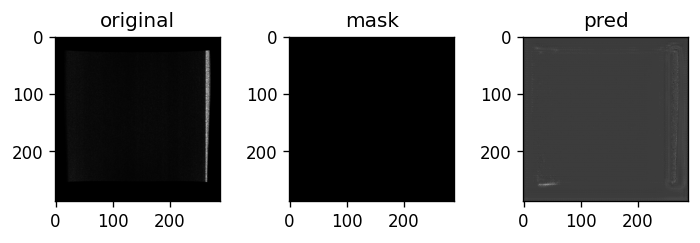

Train: Epoch 7 | Batch: 410 | Combined Loss: 0.0848083421587944 | BCE 0.018310777842998505 | dice_loss 0.0664975643157959
Train: Epoch 7 | Batch: 420 | Combined Loss: 0.12280818819999695 | BCE 0.019048843532800674 | dice_loss 0.10375934839248657
Train: Epoch 7 | Batch: 430 | Combined Loss: 0.08181273937225342 | BCE 0.01817012019455433 | dice_loss 0.06364262104034424
Train: Epoch 7 | Batch: 440 | Combined Loss: 0.08017665147781372 | BCE 0.017552020028233528 | dice_loss 0.06262463331222534
Train: Epoch 7 | Batch: 450 | Combined Loss: 0.18117646872997284 | BCE 0.021941466256976128 | dice_loss 0.15923500061035156
Train: Epoch 7 | Batch: 460 | Combined Loss: 0.09857401251792908 | BCE 0.02011677622795105 | dice_loss 0.07845723628997803
Train: Epoch 7 | Batch: 470 | Combined Loss: 0.12367606908082962 | BCE 0.019174760207533836 | dice_loss 0.10450130701065063
Train: Epoch 7 | Batch: 480 | Combined Loss: 0.09475956857204437 | BCE 0.018191855400800705 | dice_loss 0.07656770944595337
Train: Epoch

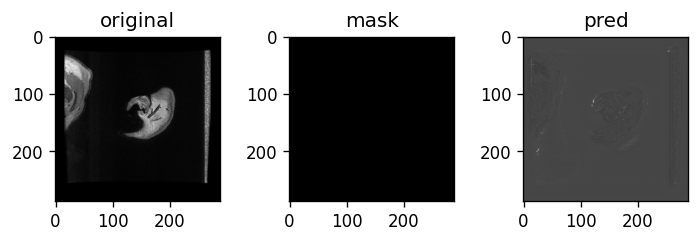

Train: Epoch 7 | Batch: 510 | Combined Loss: 0.0985950380563736 | BCE 0.01914312317967415 | dice_loss 0.07945191860198975
Avg train loss for epoch  --> 0.12832186369649692 | BCE: 0.02190881805372169 | dice_loss: 0.10641304567513779
Val: Epoch 7 | Batch: 0 | Combined Loss: 0.09427503496408463 | BCE 0.019945060834288597 | dice_loss 0.07432997226715088


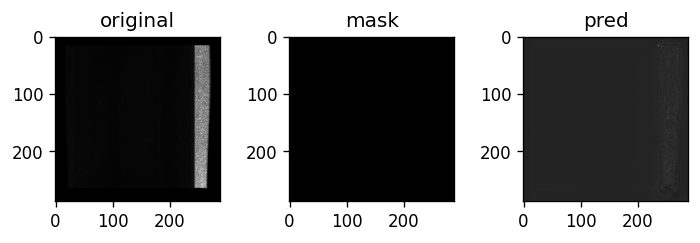

Val: Epoch 7 | Batch: 10 | Combined Loss: 0.10010156780481339 | BCE 0.01841721683740616 | dice_loss 0.08168435096740723
Val: Epoch 7 | Batch: 20 | Combined Loss: 0.10730108618736267 | BCE 0.023003365844488144 | dice_loss 0.08429771661758423
Val: Epoch 7 | Batch: 30 | Combined Loss: 0.12713105976581573 | BCE 0.01895292103290558 | dice_loss 0.10817813873291016


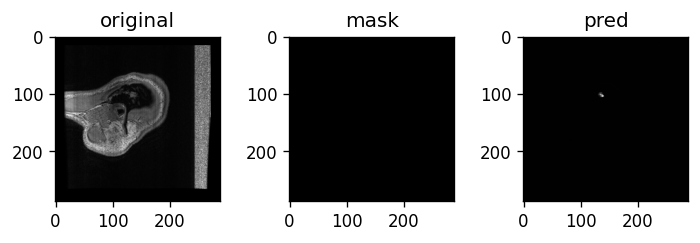

Val: Epoch 7 | Batch: 40 | Combined Loss: 0.09216408431529999 | BCE 0.019548045471310616 | dice_loss 0.07261604070663452
Val: Epoch 7 | Batch: 50 | Combined Loss: 0.10049548000097275 | BCE 0.021306835114955902 | dice_loss 0.07918864488601685
Val: Epoch 7 | Batch: 60 | Combined Loss: 0.13842329382896423 | BCE 0.019763324409723282 | dice_loss 0.11865997314453125


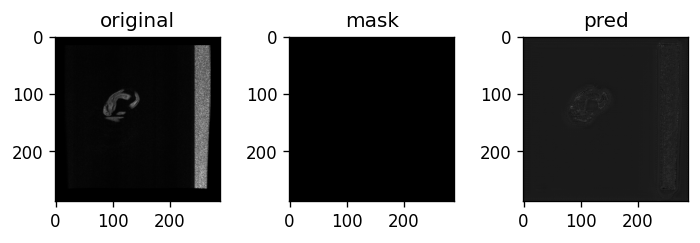

Val: Epoch 7 | Batch: 70 | Combined Loss: 0.12181048840284348 | BCE 0.01882629655301571 | dice_loss 0.10298418998718262
Val: Epoch 7 | Batch: 80 | Combined Loss: 0.09901747107505798 | BCE 0.019735369831323624 | dice_loss 0.07928210496902466
Val: Epoch 7 | Batch: 90 | Combined Loss: 0.10530240088701248 | BCE 0.019154613837599754 | dice_loss 0.08614778518676758


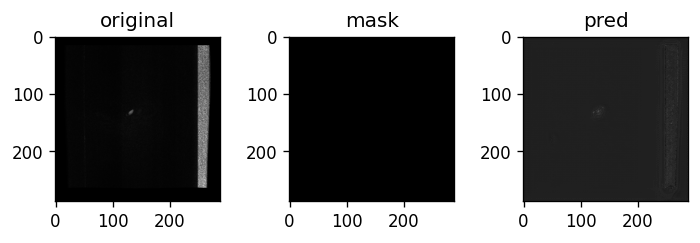

Val: Epoch 7 | Batch: 100 | Combined Loss: 0.1102241799235344 | BCE 0.019793381914496422 | dice_loss 0.09043079614639282
Val: Epoch 7 | Batch: 110 | Combined Loss: 0.09223609417676926 | BCE 0.01956062577664852 | dice_loss 0.07267546653747559
Val: Epoch 7 | Batch: 120 | Combined Loss: 0.14226378500461578 | BCE 0.017373938113451004 | dice_loss 0.12488985061645508


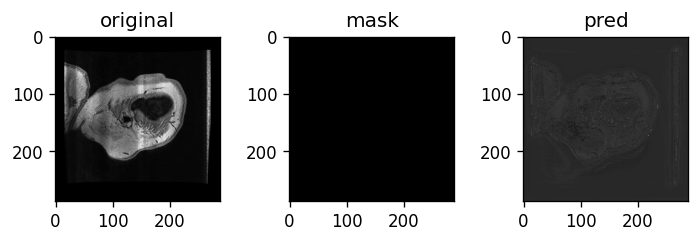

Val: Epoch 7 | Batch: 130 | Combined Loss: 0.10657799243927002 | BCE 0.0213011484593153 | dice_loss 0.08527684211730957
Average val loss for epoch  --> 0.11134753784647694 | BCE: 0.019408089433003355 | dice_loss: 0.09193944842727096
****************************************************************************************************
Train: Epoch 8 | Batch: 0 | Combined Loss: 0.06958785653114319 | BCE 0.017056312412023544 | dice_loss 0.052531540393829346


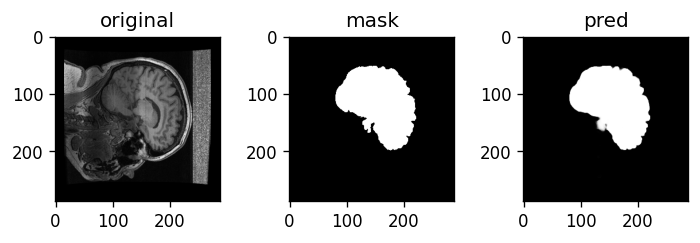

Train: Epoch 8 | Batch: 10 | Combined Loss: 0.16590814292430878 | BCE 0.023274589329957962 | dice_loss 0.1426335573196411
Train: Epoch 8 | Batch: 20 | Combined Loss: 0.07041487097740173 | BCE 0.01621207222342491 | dice_loss 0.05420279502868652
Train: Epoch 8 | Batch: 30 | Combined Loss: 0.0935758501291275 | BCE 0.017702654004096985 | dice_loss 0.07587319612503052
Train: Epoch 8 | Batch: 40 | Combined Loss: 0.10858403891324997 | BCE 0.019958965480327606 | dice_loss 0.08862507343292236
Train: Epoch 8 | Batch: 50 | Combined Loss: 0.1326054483652115 | BCE 0.020890967920422554 | dice_loss 0.11171448230743408
Train: Epoch 8 | Batch: 60 | Combined Loss: 0.06905905902385712 | BCE 0.01684681884944439 | dice_loss 0.05221223831176758
Train: Epoch 8 | Batch: 70 | Combined Loss: 0.10131704807281494 | BCE 0.02205115184187889 | dice_loss 0.07926589250564575
Train: Epoch 8 | Batch: 80 | Combined Loss: 0.17133161425590515 | BCE 0.02345028519630432 | dice_loss 0.14788132905960083
Train: Epoch 8 | Batch:

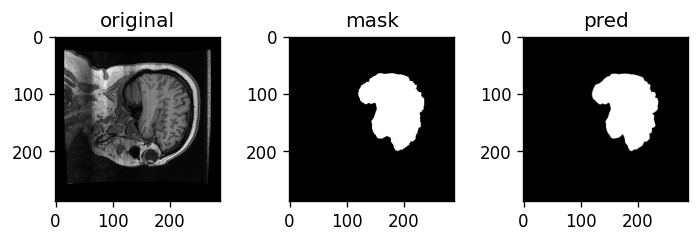

Train: Epoch 8 | Batch: 110 | Combined Loss: 0.10800652951002121 | BCE 0.020506611093878746 | dice_loss 0.08749991655349731
Train: Epoch 8 | Batch: 120 | Combined Loss: 0.07742263376712799 | BCE 0.01989765278995037 | dice_loss 0.05752497911453247
Train: Epoch 8 | Batch: 130 | Combined Loss: 0.1275082528591156 | BCE 0.019109273329377174 | dice_loss 0.10839897394180298
Train: Epoch 8 | Batch: 140 | Combined Loss: 0.12391877919435501 | BCE 0.018944328650832176 | dice_loss 0.10497444868087769
Train: Epoch 8 | Batch: 150 | Combined Loss: 0.08598854392766953 | BCE 0.016588114202022552 | dice_loss 0.06940042972564697
Train: Epoch 8 | Batch: 160 | Combined Loss: 0.11200293153524399 | BCE 0.019648872315883636 | dice_loss 0.09235405921936035
Train: Epoch 8 | Batch: 170 | Combined Loss: 0.12345296144485474 | BCE 0.02220565266907215 | dice_loss 0.10124731063842773
Train: Epoch 8 | Batch: 180 | Combined Loss: 0.09000677615404129 | BCE 0.016134686768054962 | dice_loss 0.07387208938598633
Train: Epoc

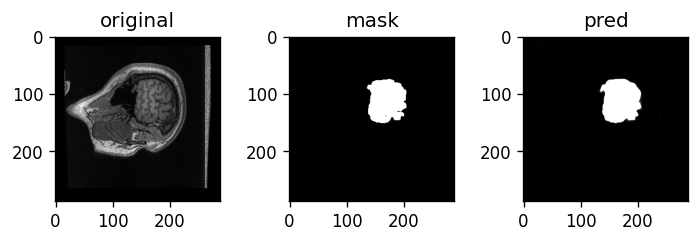

Train: Epoch 8 | Batch: 210 | Combined Loss: 0.11940402537584305 | BCE 0.01913721300661564 | dice_loss 0.10026681423187256
Train: Epoch 8 | Batch: 220 | Combined Loss: 0.10907606035470963 | BCE 0.017492929473519325 | dice_loss 0.09158313274383545
Train: Epoch 8 | Batch: 230 | Combined Loss: 0.11976569890975952 | BCE 0.01616823300719261 | dice_loss 0.10359746217727661
Train: Epoch 8 | Batch: 240 | Combined Loss: 0.0688900277018547 | BCE 0.015255025587975979 | dice_loss 0.05363500118255615
Train: Epoch 8 | Batch: 250 | Combined Loss: 0.07220743596553802 | BCE 0.017139481380581856 | dice_loss 0.05506795644760132
Train: Epoch 8 | Batch: 260 | Combined Loss: 0.08002009242773056 | BCE 0.015073319897055626 | dice_loss 0.06494677066802979
Train: Epoch 8 | Batch: 270 | Combined Loss: 0.06875085830688477 | BCE 0.016880927607417107 | dice_loss 0.05186992883682251
Train: Epoch 8 | Batch: 280 | Combined Loss: 0.09135998785495758 | BCE 0.017038654536008835 | dice_loss 0.07432132959365845
Train: Epoc

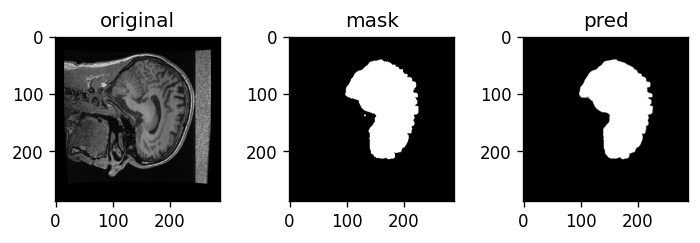

Train: Epoch 8 | Batch: 310 | Combined Loss: 0.08735182136297226 | BCE 0.015161237679421902 | dice_loss 0.07219058275222778
Train: Epoch 8 | Batch: 320 | Combined Loss: 0.05985592305660248 | BCE 0.015361831523478031 | dice_loss 0.04449409246444702
Train: Epoch 8 | Batch: 330 | Combined Loss: 0.10031825304031372 | BCE 0.016550537198781967 | dice_loss 0.08376771211624146
Train: Epoch 8 | Batch: 340 | Combined Loss: 0.11205430328845978 | BCE 0.021004509180784225 | dice_loss 0.09104979038238525
Train: Epoch 8 | Batch: 350 | Combined Loss: 0.09740150719881058 | BCE 0.01811564527451992 | dice_loss 0.07928586006164551
Train: Epoch 8 | Batch: 360 | Combined Loss: 0.13598105311393738 | BCE 0.019246606156229973 | dice_loss 0.11673444509506226
Train: Epoch 8 | Batch: 370 | Combined Loss: 0.06067867949604988 | BCE 0.015940207988023758 | dice_loss 0.04473847150802612
Train: Epoch 8 | Batch: 380 | Combined Loss: 0.07460211962461472 | BCE 0.014967912808060646 | dice_loss 0.05963420867919922
Train: Ep

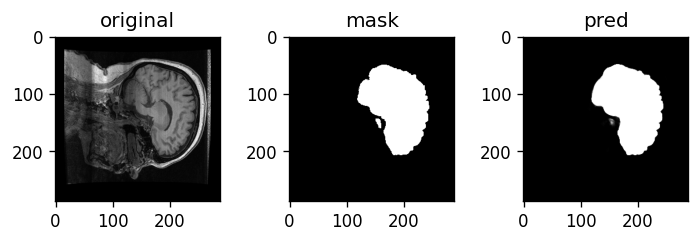

Train: Epoch 8 | Batch: 410 | Combined Loss: 0.08652974665164948 | BCE 0.015350176021456718 | dice_loss 0.07117956876754761
Train: Epoch 8 | Batch: 420 | Combined Loss: 0.07621514052152634 | BCE 0.01546888891607523 | dice_loss 0.06074625253677368
Train: Epoch 8 | Batch: 430 | Combined Loss: 0.07825767248868942 | BCE 0.01639431156218052 | dice_loss 0.06186336278915405
Train: Epoch 8 | Batch: 440 | Combined Loss: 0.1929090917110443 | BCE 0.018517520278692245 | dice_loss 0.17439156770706177
Train: Epoch 8 | Batch: 450 | Combined Loss: 0.12202805280685425 | BCE 0.01680845022201538 | dice_loss 0.10521960258483887
Train: Epoch 8 | Batch: 460 | Combined Loss: 0.10423405468463898 | BCE 0.01732279546558857 | dice_loss 0.08691126108169556
Train: Epoch 8 | Batch: 470 | Combined Loss: 0.07057996094226837 | BCE 0.017174256965517998 | dice_loss 0.053405702114105225
Train: Epoch 8 | Batch: 480 | Combined Loss: 0.055458854883909225 | BCE 0.01270593423396349 | dice_loss 0.04275292158126831
Train: Epoch

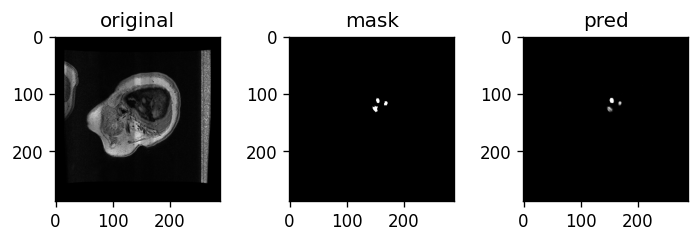

Train: Epoch 8 | Batch: 510 | Combined Loss: 0.08529436588287354 | BCE 0.014725684188306332 | dice_loss 0.07056868076324463
Avg train loss for epoch  --> 0.10237622087727873 | BCE: 0.017864049031151078 | dice_loss: 0.08451217171308156
Val: Epoch 8 | Batch: 0 | Combined Loss: 0.08358962088823318 | BCE 0.01318723801523447 | dice_loss 0.07040238380432129


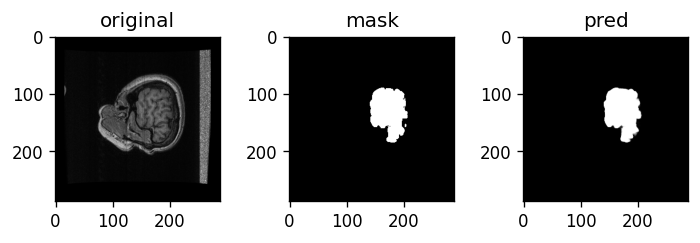

Val: Epoch 8 | Batch: 10 | Combined Loss: 0.06407738476991653 | BCE 0.014655237086117268 | dice_loss 0.04942214488983154
Val: Epoch 8 | Batch: 20 | Combined Loss: 0.06679191440343857 | BCE 0.015904270112514496 | dice_loss 0.05088764429092407
Val: Epoch 8 | Batch: 30 | Combined Loss: 0.06420459598302841 | BCE 0.014170671813189983 | dice_loss 0.05003392696380615


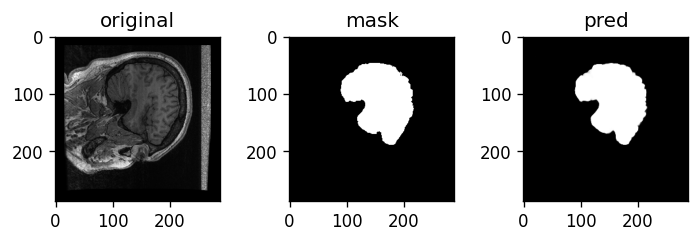

Val: Epoch 8 | Batch: 40 | Combined Loss: 0.06630127876996994 | BCE 0.01715659536421299 | dice_loss 0.0491446852684021
Val: Epoch 8 | Batch: 50 | Combined Loss: 0.07016763836145401 | BCE 0.01680556684732437 | dice_loss 0.05336207151412964
Val: Epoch 8 | Batch: 60 | Combined Loss: 0.07246556878089905 | BCE 0.016113074496388435 | dice_loss 0.05635249614715576


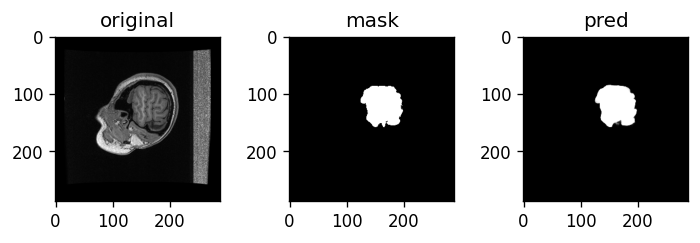

Val: Epoch 8 | Batch: 70 | Combined Loss: 0.07987259328365326 | BCE 0.01477150246500969 | dice_loss 0.06510108709335327
Val: Epoch 8 | Batch: 80 | Combined Loss: 0.08133264631032944 | BCE 0.016006136313080788 | dice_loss 0.0653265118598938
Val: Epoch 8 | Batch: 90 | Combined Loss: 0.07968326658010483 | BCE 0.01398684922605753 | dice_loss 0.06569641828536987


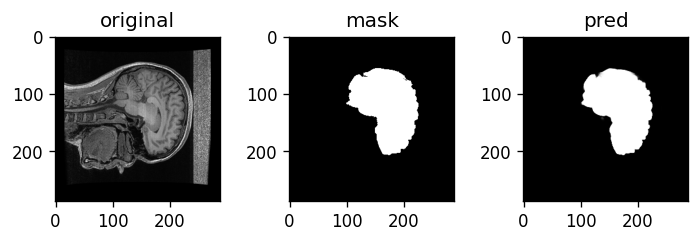

Val: Epoch 8 | Batch: 100 | Combined Loss: 0.08898603916168213 | BCE 0.017011519521474838 | dice_loss 0.07197451591491699
Val: Epoch 8 | Batch: 110 | Combined Loss: 0.08247527480125427 | BCE 0.014610972255468369 | dice_loss 0.0678642988204956
Val: Epoch 8 | Batch: 120 | Combined Loss: 0.06895743310451508 | BCE 0.013634908013045788 | dice_loss 0.05532252788543701


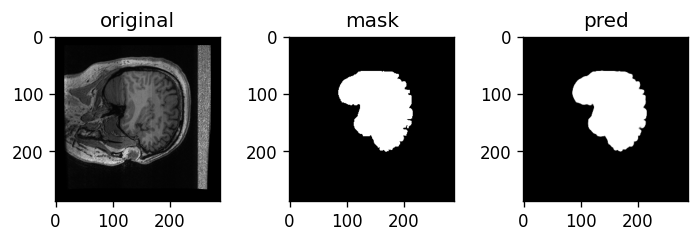

Val: Epoch 8 | Batch: 130 | Combined Loss: 0.07507055997848511 | BCE 0.015248656272888184 | dice_loss 0.059821903705596924
Average val loss for epoch  --> 0.08154996575580703 | BCE: 0.014774713982586507 | dice_loss: 0.06677525175942314
****************************************************************************************************
Train: Epoch 9 | Batch: 0 | Combined Loss: 0.10781984031200409 | BCE 0.01550512295216322 | dice_loss 0.0923147201538086


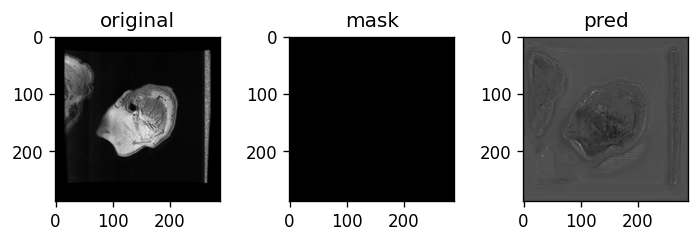

Train: Epoch 9 | Batch: 10 | Combined Loss: 0.06765997409820557 | BCE 0.014494601637125015 | dice_loss 0.05316537618637085
Train: Epoch 9 | Batch: 20 | Combined Loss: 0.14725089073181152 | BCE 0.01826363243162632 | dice_loss 0.12898725271224976
Train: Epoch 9 | Batch: 30 | Combined Loss: 0.11260151118040085 | BCE 0.01812153123319149 | dice_loss 0.09447997808456421
Train: Epoch 9 | Batch: 40 | Combined Loss: 0.0658915787935257 | BCE 0.016061443835496902 | dice_loss 0.04983013868331909
Train: Epoch 9 | Batch: 50 | Combined Loss: 0.08247540146112442 | BCE 0.015446880832314491 | dice_loss 0.06702852249145508
Train: Epoch 9 | Batch: 60 | Combined Loss: 0.06353680789470673 | BCE 0.012779461219906807 | dice_loss 0.05075734853744507
Train: Epoch 9 | Batch: 70 | Combined Loss: 0.07864855229854584 | BCE 0.013691706582903862 | dice_loss 0.06495684385299683
Train: Epoch 9 | Batch: 80 | Combined Loss: 0.07499564439058304 | BCE 0.014484590850770473 | dice_loss 0.06051105260848999
Train: Epoch 9 | Ba

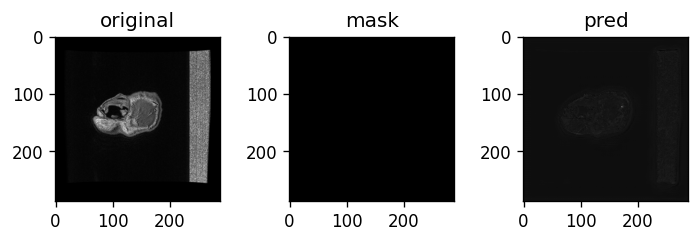

Train: Epoch 9 | Batch: 110 | Combined Loss: 0.10132920742034912 | BCE 0.014960948377847672 | dice_loss 0.08636826276779175
Train: Epoch 9 | Batch: 120 | Combined Loss: 0.07395584136247635 | BCE 0.013128286227583885 | dice_loss 0.060827553272247314
Train: Epoch 9 | Batch: 130 | Combined Loss: 0.05965672433376312 | BCE 0.01340596191585064 | dice_loss 0.046250760555267334
Train: Epoch 9 | Batch: 140 | Combined Loss: 0.10700714588165283 | BCE 0.014139949344098568 | dice_loss 0.09286719560623169
Train: Epoch 9 | Batch: 150 | Combined Loss: 0.08873731642961502 | BCE 0.013974612578749657 | dice_loss 0.07476270198822021
Train: Epoch 9 | Batch: 160 | Combined Loss: 0.08392871171236038 | BCE 0.014480480924248695 | dice_loss 0.06944823265075684
Train: Epoch 9 | Batch: 170 | Combined Loss: 0.10643637925386429 | BCE 0.01652354933321476 | dice_loss 0.08991283178329468
Train: Epoch 9 | Batch: 180 | Combined Loss: 0.07387092709541321 | BCE 0.013719826936721802 | dice_loss 0.060151100158691406
Train: 

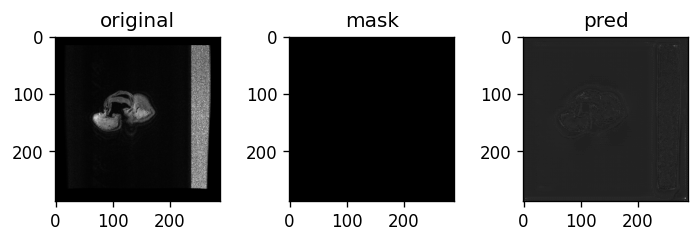

Train: Epoch 9 | Batch: 210 | Combined Loss: 0.0958908200263977 | BCE 0.014227272942662239 | dice_loss 0.08166354894638062
Train: Epoch 9 | Batch: 220 | Combined Loss: 0.10386254638433456 | BCE 0.01678820699453354 | dice_loss 0.08707433938980103
Train: Epoch 9 | Batch: 230 | Combined Loss: 0.0827469676733017 | BCE 0.0162460096180439 | dice_loss 0.0665009617805481
Train: Epoch 9 | Batch: 240 | Combined Loss: 0.07694945484399796 | BCE 0.014130630530416965 | dice_loss 0.06281882524490356
Train: Epoch 9 | Batch: 250 | Combined Loss: 0.07159477472305298 | BCE 0.01389843039214611 | dice_loss 0.05769634246826172
Train: Epoch 9 | Batch: 260 | Combined Loss: 0.06267200410366058 | BCE 0.013636037707328796 | dice_loss 0.04903596639633179
Train: Epoch 9 | Batch: 270 | Combined Loss: 0.09254734963178635 | BCE 0.01495778001844883 | dice_loss 0.07758957147598267
Train: Epoch 9 | Batch: 280 | Combined Loss: 0.08542653918266296 | BCE 0.01334503386169672 | dice_loss 0.07208150625228882
Train: Epoch 9 | 

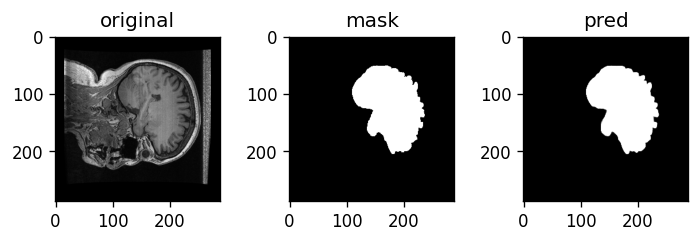

Train: Epoch 9 | Batch: 310 | Combined Loss: 0.07816626876592636 | BCE 0.013179146684706211 | dice_loss 0.06498712301254272
Train: Epoch 9 | Batch: 320 | Combined Loss: 0.07712249457836151 | BCE 0.0133693041279912 | dice_loss 0.06375318765640259
Train: Epoch 9 | Batch: 330 | Combined Loss: 0.05248406529426575 | BCE 0.012133686803281307 | dice_loss 0.040350377559661865
Train: Epoch 9 | Batch: 340 | Combined Loss: 0.05424607917666435 | BCE 0.013534198515117168 | dice_loss 0.04071187973022461
Train: Epoch 9 | Batch: 350 | Combined Loss: 0.11672984063625336 | BCE 0.014697003178298473 | dice_loss 0.10203284025192261
Train: Epoch 9 | Batch: 360 | Combined Loss: 0.060926735401153564 | BCE 0.01276773028075695 | dice_loss 0.048159003257751465
Train: Epoch 9 | Batch: 370 | Combined Loss: 0.06461481004953384 | BCE 0.013487912714481354 | dice_loss 0.05112689733505249
Train: Epoch 9 | Batch: 380 | Combined Loss: 0.09419392794370651 | BCE 0.01796012558043003 | dice_loss 0.07623380422592163
Train: Ep

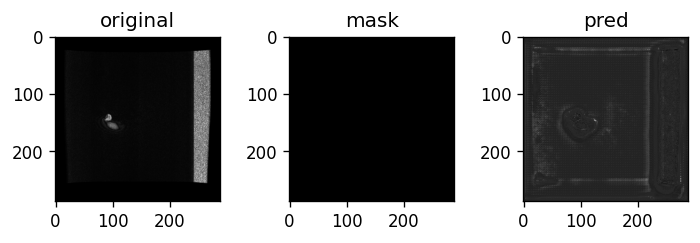

Train: Epoch 9 | Batch: 410 | Combined Loss: 0.06442730873823166 | BCE 0.013092215172946453 | dice_loss 0.05133509635925293
Train: Epoch 9 | Batch: 420 | Combined Loss: 0.113497793674469 | BCE 0.015279767103493214 | dice_loss 0.09821802377700806
Train: Epoch 9 | Batch: 430 | Combined Loss: 0.08063022047281265 | BCE 0.012441076338291168 | dice_loss 0.06818914413452148
Train: Epoch 9 | Batch: 440 | Combined Loss: 0.061336640268564224 | BCE 0.013653818517923355 | dice_loss 0.04768282175064087
Train: Epoch 9 | Batch: 450 | Combined Loss: 0.04695747047662735 | BCE 0.013137317262589931 | dice_loss 0.033820152282714844
Train: Epoch 9 | Batch: 460 | Combined Loss: 0.07928816229104996 | BCE 0.012754359282553196 | dice_loss 0.06653380393981934
Train: Epoch 9 | Batch: 470 | Combined Loss: 0.07437501847743988 | BCE 0.01717536523938179 | dice_loss 0.05719965696334839
Train: Epoch 9 | Batch: 480 | Combined Loss: 0.09472610056400299 | BCE 0.012820023111999035 | dice_loss 0.08190608024597168
Train: Ep

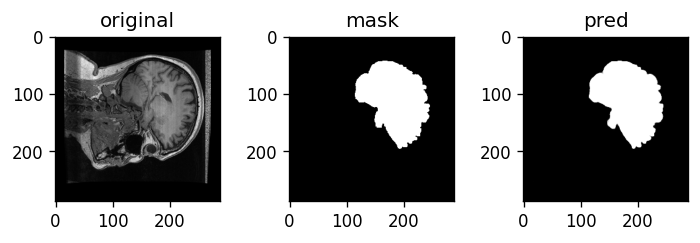

Train: Epoch 9 | Batch: 510 | Combined Loss: 0.06478730589151382 | BCE 0.011848844587802887 | dice_loss 0.05293846130371094
Avg train loss for epoch  --> 0.08042885875868751 | BCE: 0.01428115408342605 | dice_loss: 0.06614770484246803
Val: Epoch 9 | Batch: 0 | Combined Loss: 0.06638631969690323 | BCE 0.012773849070072174 | dice_loss 0.053612470626831055


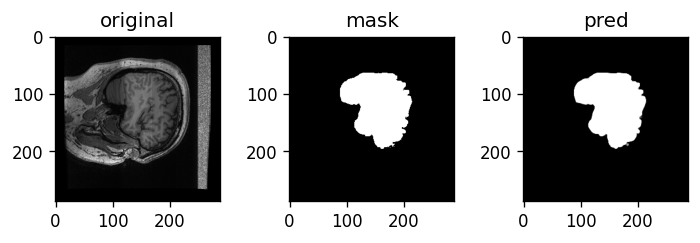

Val: Epoch 9 | Batch: 10 | Combined Loss: 0.07501471042633057 | BCE 0.0128175625577569 | dice_loss 0.06219714879989624
Val: Epoch 9 | Batch: 20 | Combined Loss: 0.06517855823040009 | BCE 0.01330218929797411 | dice_loss 0.05187636613845825
Val: Epoch 9 | Batch: 30 | Combined Loss: 0.09159377962350845 | BCE 0.012591579928994179 | dice_loss 0.07900220155715942


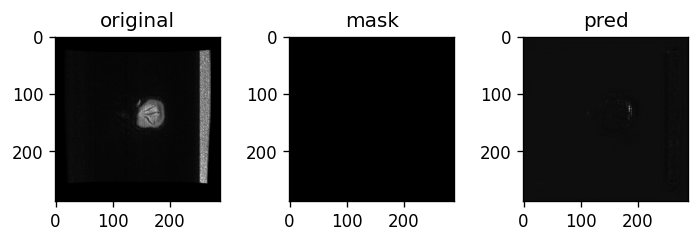

Val: Epoch 9 | Batch: 40 | Combined Loss: 0.06651259958744049 | BCE 0.014868571422994137 | dice_loss 0.05164402723312378
Val: Epoch 9 | Batch: 50 | Combined Loss: 0.07635385543107986 | BCE 0.011287636123597622 | dice_loss 0.06506621837615967
Val: Epoch 9 | Batch: 60 | Combined Loss: 0.06108549237251282 | BCE 0.015128998085856438 | dice_loss 0.04595649242401123


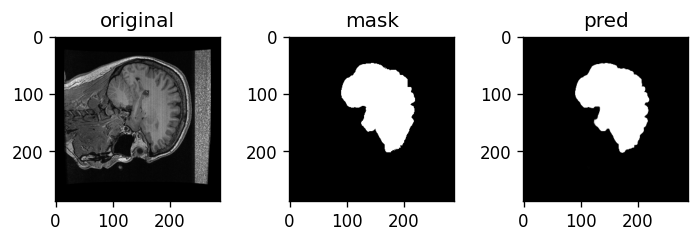

Val: Epoch 9 | Batch: 70 | Combined Loss: 0.07540380954742432 | BCE 0.014046906493604183 | dice_loss 0.06135690212249756
Val: Epoch 9 | Batch: 80 | Combined Loss: 0.07224978506565094 | BCE 0.01586867868900299 | dice_loss 0.05638110637664795
Val: Epoch 9 | Batch: 90 | Combined Loss: 0.06918122619390488 | BCE 0.012575707398355007 | dice_loss 0.056605517864227295


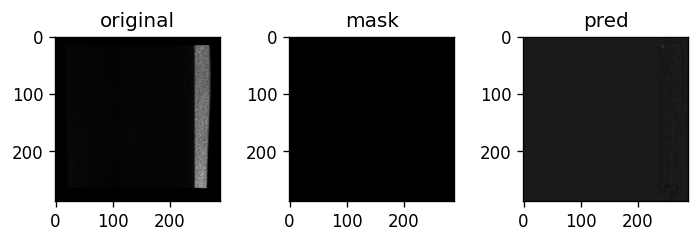

Val: Epoch 9 | Batch: 100 | Combined Loss: 0.06871698051691055 | BCE 0.015014980919659138 | dice_loss 0.05370199680328369
Val: Epoch 9 | Batch: 110 | Combined Loss: 0.07249908149242401 | BCE 0.015677792951464653 | dice_loss 0.05682128667831421
Val: Epoch 9 | Batch: 120 | Combined Loss: 0.08790118992328644 | BCE 0.012592033483088017 | dice_loss 0.075309157371521


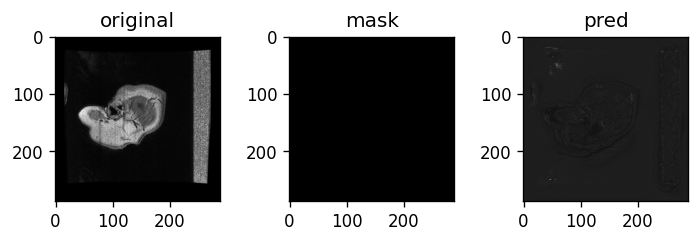

Val: Epoch 9 | Batch: 130 | Combined Loss: 0.08161598443984985 | BCE 0.0152130713686347 | dice_loss 0.06640291213989258
Average val loss for epoch  --> 0.07250478237315461 | BCE: 0.013618667099486899 | dice_loss: 0.05888611519778216
****************************************************************************************************
Train: Epoch 10 | Batch: 0 | Combined Loss: 0.06193581596016884 | BCE 0.011749301105737686 | dice_loss 0.05018651485443115


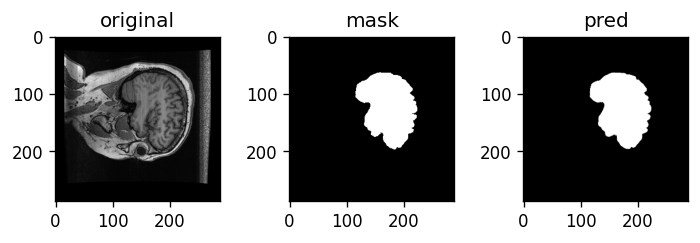

Train: Epoch 10 | Batch: 10 | Combined Loss: 0.08890758454799652 | BCE 0.01458041463047266 | dice_loss 0.07432717084884644
Train: Epoch 10 | Batch: 20 | Combined Loss: 0.0846395418047905 | BCE 0.012876625172793865 | dice_loss 0.07176291942596436
Train: Epoch 10 | Batch: 30 | Combined Loss: 0.09622607380151749 | BCE 0.012794055044651031 | dice_loss 0.08343201875686646
Train: Epoch 10 | Batch: 40 | Combined Loss: 0.04613838717341423 | BCE 0.011903862468898296 | dice_loss 0.03423452377319336
Train: Epoch 10 | Batch: 50 | Combined Loss: 0.0663161426782608 | BCE 0.012845586985349655 | dice_loss 0.05347055196762085
Train: Epoch 10 | Batch: 60 | Combined Loss: 0.053354959934949875 | BCE 0.011766057461500168 | dice_loss 0.04158890247344971
Train: Epoch 10 | Batch: 70 | Combined Loss: 0.08355993032455444 | BCE 0.014114739373326302 | dice_loss 0.06944519281387329
Train: Epoch 10 | Batch: 80 | Combined Loss: 0.13075217604637146 | BCE 0.03786303848028183 | dice_loss 0.09288913011550903
Train: Epoc

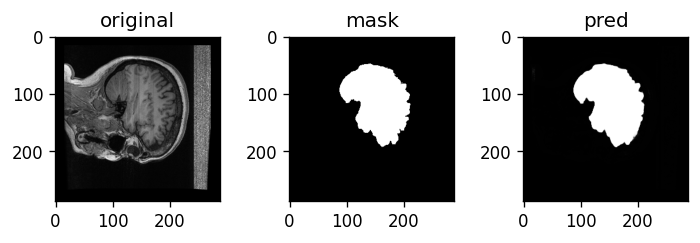

Train: Epoch 10 | Batch: 110 | Combined Loss: 0.056763797998428345 | BCE 0.016734985634684563 | dice_loss 0.04002881050109863
Train: Epoch 10 | Batch: 120 | Combined Loss: 0.050950463861227036 | BCE 0.014180895872414112 | dice_loss 0.0367695689201355
Train: Epoch 10 | Batch: 130 | Combined Loss: 0.047948889434337616 | BCE 0.014811686240136623 | dice_loss 0.03313720226287842
Train: Epoch 10 | Batch: 140 | Combined Loss: 0.08421871066093445 | BCE 0.013792184181511402 | dice_loss 0.07042652368545532
Train: Epoch 10 | Batch: 150 | Combined Loss: 0.05819690227508545 | BCE 0.01599252223968506 | dice_loss 0.04220438003540039
Train: Epoch 10 | Batch: 160 | Combined Loss: 0.05613645911216736 | BCE 0.01230660080909729 | dice_loss 0.04382985830307007
Train: Epoch 10 | Batch: 170 | Combined Loss: 0.08848866075277328 | BCE 0.014257335104048252 | dice_loss 0.07423132658004761
Train: Epoch 10 | Batch: 180 | Combined Loss: 0.08155553787946701 | BCE 0.013680688105523586 | dice_loss 0.06787484884262085


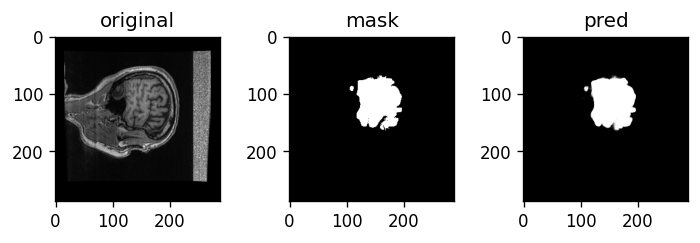

Train: Epoch 10 | Batch: 210 | Combined Loss: 0.05451592057943344 | BCE 0.012364169582724571 | dice_loss 0.04215174913406372
Train: Epoch 10 | Batch: 220 | Combined Loss: 0.056850723922252655 | BCE 0.014282039366662502 | dice_loss 0.04256868362426758
Train: Epoch 10 | Batch: 230 | Combined Loss: 0.04515586048364639 | BCE 0.01302800327539444 | dice_loss 0.03212785720825195
Train: Epoch 10 | Batch: 240 | Combined Loss: 0.05105489492416382 | BCE 0.012883066199719906 | dice_loss 0.03817182779312134
Train: Epoch 10 | Batch: 250 | Combined Loss: 0.05596233159303665 | BCE 0.01169014722108841 | dice_loss 0.04427218437194824
Train: Epoch 10 | Batch: 260 | Combined Loss: 0.07241303473711014 | BCE 0.014081427827477455 | dice_loss 0.05833160877227783
Train: Epoch 10 | Batch: 270 | Combined Loss: 0.06265164166688919 | BCE 0.011651167646050453 | dice_loss 0.05100047588348389
Train: Epoch 10 | Batch: 280 | Combined Loss: 0.07283063977956772 | BCE 0.011418662033975124 | dice_loss 0.06141197681427002
T

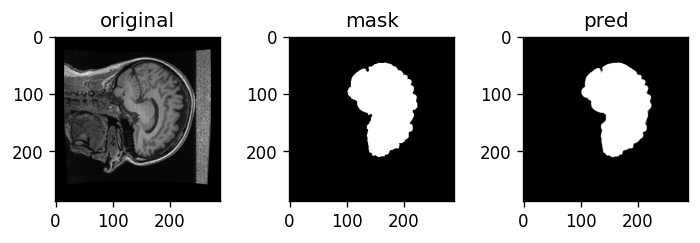

Train: Epoch 10 | Batch: 310 | Combined Loss: 0.06479818373918533 | BCE 0.011178920045495033 | dice_loss 0.05361926555633545
Train: Epoch 10 | Batch: 320 | Combined Loss: 0.05210195481777191 | BCE 0.011392278596758842 | dice_loss 0.04070967435836792
Train: Epoch 10 | Batch: 330 | Combined Loss: 0.043828241527080536 | BCE 0.01089739054441452 | dice_loss 0.032930850982666016
Train: Epoch 10 | Batch: 340 | Combined Loss: 0.06828048825263977 | BCE 0.013146314769983292 | dice_loss 0.05513417720794678
Train: Epoch 10 | Batch: 350 | Combined Loss: 0.052161671221256256 | BCE 0.01147846132516861 | dice_loss 0.040683209896087646
Train: Epoch 10 | Batch: 360 | Combined Loss: 0.10788780450820923 | BCE 0.012472512200474739 | dice_loss 0.09541529417037964
Train: Epoch 10 | Batch: 370 | Combined Loss: 0.04629970341920853 | BCE 0.012464171275496483 | dice_loss 0.033835530281066895
Train: Epoch 10 | Batch: 380 | Combined Loss: 0.0947224572300911 | BCE 0.01385642122477293 | dice_loss 0.08086603879928589

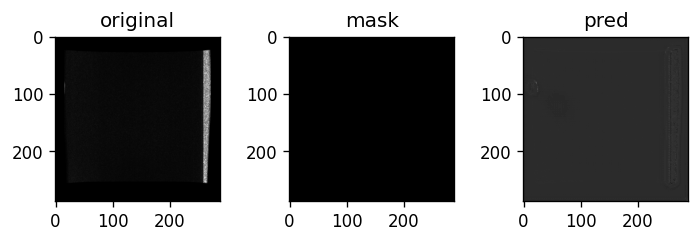

Train: Epoch 10 | Batch: 410 | Combined Loss: 0.05616194009780884 | BCE 0.010277034714818 | dice_loss 0.045884907245635986
Train: Epoch 10 | Batch: 420 | Combined Loss: 0.07403048127889633 | BCE 0.011605226434767246 | dice_loss 0.06242525577545166
Train: Epoch 10 | Batch: 430 | Combined Loss: 0.060038212686777115 | BCE 0.011400643736124039 | dice_loss 0.048637568950653076
Train: Epoch 10 | Batch: 440 | Combined Loss: 0.051928408443927765 | BCE 0.011169679462909698 | dice_loss 0.040758728981018066
Train: Epoch 10 | Batch: 450 | Combined Loss: 0.09413334727287292 | BCE 0.012357326224446297 | dice_loss 0.08177602291107178
Train: Epoch 10 | Batch: 460 | Combined Loss: 0.04151957109570503 | BCE 0.010812152177095413 | dice_loss 0.03070741891860962
Train: Epoch 10 | Batch: 470 | Combined Loss: 0.05105629190802574 | BCE 0.009651805274188519 | dice_loss 0.04140448570251465
Train: Epoch 10 | Batch: 480 | Combined Loss: 0.05195748060941696 | BCE 0.01113992277532816 | dice_loss 0.04081755876541138

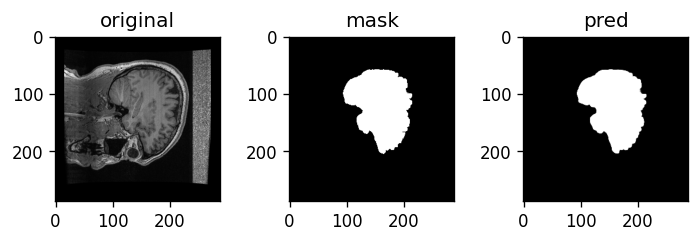

Train: Epoch 10 | Batch: 510 | Combined Loss: 0.05097523704171181 | BCE 0.0105610815808177 | dice_loss 0.04041415452957153
Avg train loss for epoch  --> 0.06854629055614868 | BCE: 0.013457053590882354 | dice_loss: 0.055089236801655596
Val: Epoch 10 | Batch: 0 | Combined Loss: 0.08732005208730698 | BCE 0.007862232625484467 | dice_loss 0.07945781946182251


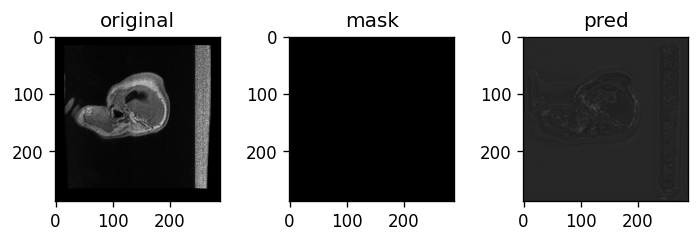

Val: Epoch 10 | Batch: 10 | Combined Loss: 0.05322539061307907 | BCE 0.008528701961040497 | dice_loss 0.044696688652038574
Val: Epoch 10 | Batch: 20 | Combined Loss: 0.05187605321407318 | BCE 0.00936411414295435 | dice_loss 0.042511940002441406
Val: Epoch 10 | Batch: 30 | Combined Loss: 0.058384254574775696 | BCE 0.012171522714197636 | dice_loss 0.046212732791900635


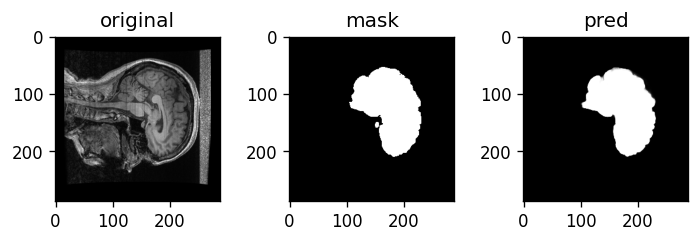

Val: Epoch 10 | Batch: 40 | Combined Loss: 0.05038025602698326 | BCE 0.010782028548419476 | dice_loss 0.03959822654724121
Val: Epoch 10 | Batch: 50 | Combined Loss: 0.051276691257953644 | BCE 0.013014739379286766 | dice_loss 0.03826195001602173
Val: Epoch 10 | Batch: 60 | Combined Loss: 0.045596033334732056 | BCE 0.010712655261158943 | dice_loss 0.03488337993621826


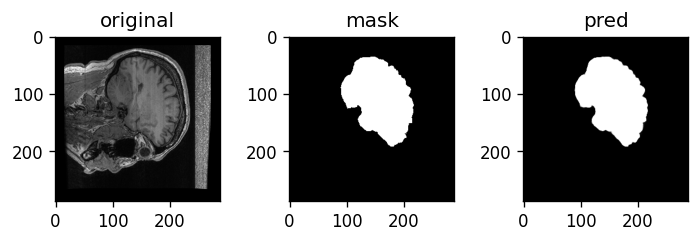

Val: Epoch 10 | Batch: 70 | Combined Loss: 0.04644893482327461 | BCE 0.010821270756423473 | dice_loss 0.035627663135528564
Val: Epoch 10 | Batch: 80 | Combined Loss: 0.060491934418678284 | BCE 0.01267178449779749 | dice_loss 0.04782015085220337
Val: Epoch 10 | Batch: 90 | Combined Loss: 0.04865172132849693 | BCE 0.01085581909865141 | dice_loss 0.03779590129852295


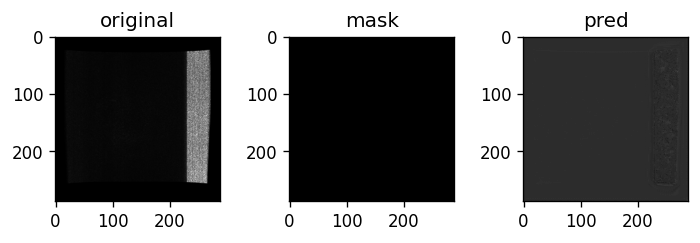

Val: Epoch 10 | Batch: 100 | Combined Loss: 0.062053095549345016 | BCE 0.009512913413345814 | dice_loss 0.05254018306732178
Val: Epoch 10 | Batch: 110 | Combined Loss: 0.047809720039367676 | BCE 0.01041704323142767 | dice_loss 0.03739267587661743
Val: Epoch 10 | Batch: 120 | Combined Loss: 0.05632290244102478 | BCE 0.01150086335837841 | dice_loss 0.04482203722000122


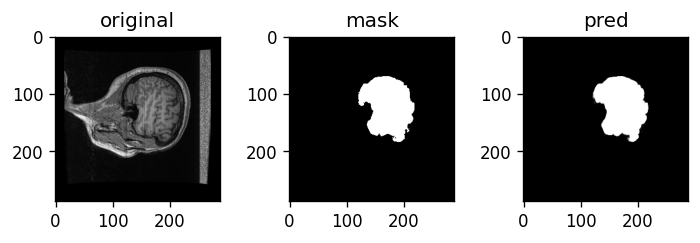

Val: Epoch 10 | Batch: 130 | Combined Loss: 0.05254310742020607 | BCE 0.011092784814536572 | dice_loss 0.041450321674346924
Average val loss for epoch  --> 0.05608287072843975 | BCE: 0.010913745600178286 | dice_loss: 0.04516912522139373
****************************************************************************************************
Train: Epoch 11 | Batch: 0 | Combined Loss: 0.0696074515581131 | BCE 0.0108576575294137 | dice_loss 0.05874979496002197


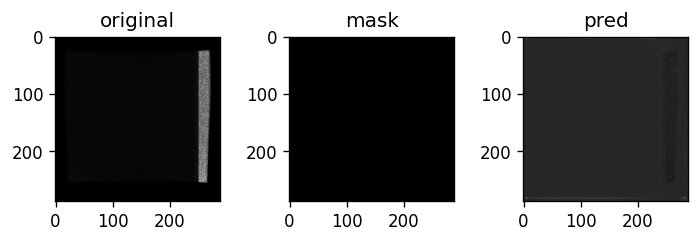

Train: Epoch 11 | Batch: 10 | Combined Loss: 0.043090932071208954 | BCE 0.01092629972845316 | dice_loss 0.03216463327407837
Train: Epoch 11 | Batch: 20 | Combined Loss: 0.08155012875795364 | BCE 0.012301752343773842 | dice_loss 0.06924837827682495
Train: Epoch 11 | Batch: 30 | Combined Loss: 0.06714427471160889 | BCE 0.011873843148350716 | dice_loss 0.05527043342590332
Train: Epoch 11 | Batch: 40 | Combined Loss: 0.05092260241508484 | BCE 0.011779100634157658 | dice_loss 0.039143502712249756
Train: Epoch 11 | Batch: 50 | Combined Loss: 0.06617630273103714 | BCE 0.01057721208781004 | dice_loss 0.055599093437194824
Train: Epoch 11 | Batch: 60 | Combined Loss: 0.07693856209516525 | BCE 0.012317772023379803 | dice_loss 0.06462079286575317
Train: Epoch 11 | Batch: 70 | Combined Loss: 0.06218203902244568 | BCE 0.011667937971651554 | dice_loss 0.0505141019821167
Train: Epoch 11 | Batch: 80 | Combined Loss: 0.042406901717185974 | BCE 0.010376139543950558 | dice_loss 0.03203076124191284
Train: 

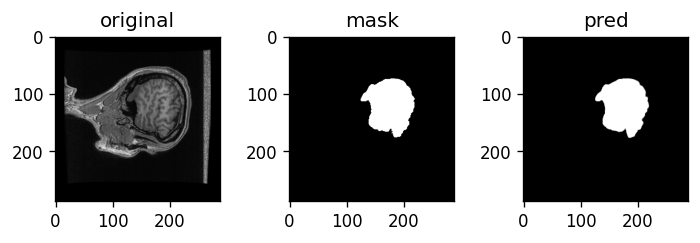

Train: Epoch 11 | Batch: 110 | Combined Loss: 0.04702475666999817 | BCE 0.010487408377230167 | dice_loss 0.036537349224090576
Train: Epoch 11 | Batch: 120 | Combined Loss: 0.053691066801548004 | BCE 0.012661672197282314 | dice_loss 0.041029393672943115
Train: Epoch 11 | Batch: 130 | Combined Loss: 0.05399274826049805 | BCE 0.010540544055402279 | dice_loss 0.04345220327377319
Train: Epoch 11 | Batch: 140 | Combined Loss: 0.039822209626436234 | BCE 0.01057814434170723 | dice_loss 0.029244065284729004
Train: Epoch 11 | Batch: 150 | Combined Loss: 0.054575733840465546 | BCE 0.010052256286144257 | dice_loss 0.04452347755432129
Train: Epoch 11 | Batch: 160 | Combined Loss: 0.054654091596603394 | BCE 0.011341781355440617 | dice_loss 0.04331231117248535
Train: Epoch 11 | Batch: 170 | Combined Loss: 0.0723508894443512 | BCE 0.011263755150139332 | dice_loss 0.06108713150024414
Train: Epoch 11 | Batch: 180 | Combined Loss: 0.05906739830970764 | BCE 0.010386436246335506 | dice_loss 0.0486809611320

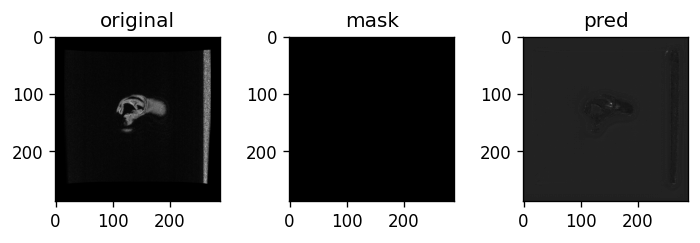

Train: Epoch 11 | Batch: 210 | Combined Loss: 0.08048486709594727 | BCE 0.01211094856262207 | dice_loss 0.0683739185333252
Train: Epoch 11 | Batch: 220 | Combined Loss: 0.043191634118556976 | BCE 0.009248040616512299 | dice_loss 0.03394359350204468
Train: Epoch 11 | Batch: 230 | Combined Loss: 0.05279696360230446 | BCE 0.010277274064719677 | dice_loss 0.04251968860626221
Train: Epoch 11 | Batch: 240 | Combined Loss: 0.0731247067451477 | BCE 0.01094174012541771 | dice_loss 0.0621829628944397
Train: Epoch 11 | Batch: 250 | Combined Loss: 0.04920724034309387 | BCE 0.011812478303909302 | dice_loss 0.03739476203918457
Train: Epoch 11 | Batch: 260 | Combined Loss: 0.055582981556653976 | BCE 0.010109525173902512 | dice_loss 0.045473456382751465
Train: Epoch 11 | Batch: 270 | Combined Loss: 0.06058361008763313 | BCE 0.012017148546874523 | dice_loss 0.048566460609436035
Train: Epoch 11 | Batch: 280 | Combined Loss: 0.04591625556349754 | BCE 0.00910919439047575 | dice_loss 0.03680706024169922
Tr

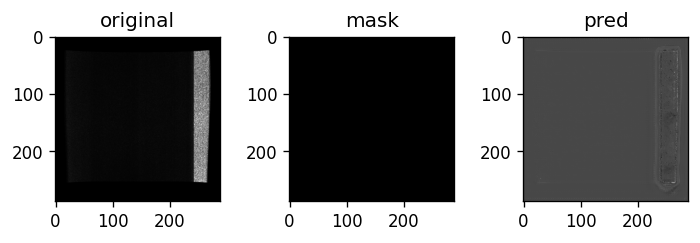

Train: Epoch 11 | Batch: 310 | Combined Loss: 0.053387902677059174 | BCE 0.010847235098481178 | dice_loss 0.042540669441223145
Train: Epoch 11 | Batch: 320 | Combined Loss: 0.07458067685365677 | BCE 0.010371631942689419 | dice_loss 0.06420904397964478
Train: Epoch 11 | Batch: 330 | Combined Loss: 0.043944768607616425 | BCE 0.009922855533659458 | dice_loss 0.03402191400527954
Train: Epoch 11 | Batch: 340 | Combined Loss: 0.05853567272424698 | BCE 0.009147620759904385 | dice_loss 0.04938805103302002
Train: Epoch 11 | Batch: 350 | Combined Loss: 0.058235183358192444 | BCE 0.011557416059076786 | dice_loss 0.04667776823043823
Train: Epoch 11 | Batch: 360 | Combined Loss: 0.04559066519141197 | BCE 0.010055746883153915 | dice_loss 0.03553491830825806
Train: Epoch 11 | Batch: 370 | Combined Loss: 0.047322168946266174 | BCE 0.01007403526455164 | dice_loss 0.03724813461303711
Train: Epoch 11 | Batch: 380 | Combined Loss: 0.10358846932649612 | BCE 0.015467057935893536 | dice_loss 0.08812141418457

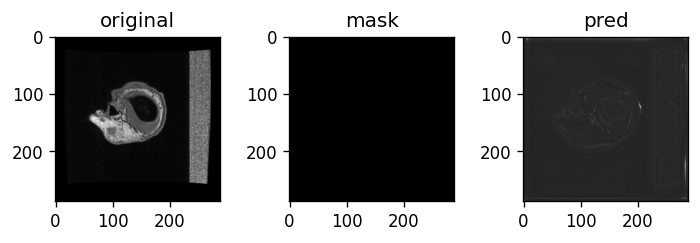

Train: Epoch 11 | Batch: 410 | Combined Loss: 0.04686180502176285 | BCE 0.012865281663835049 | dice_loss 0.033996522426605225
Train: Epoch 11 | Batch: 420 | Combined Loss: 0.05376478284597397 | BCE 0.010757705196738243 | dice_loss 0.043007075786590576
Train: Epoch 11 | Batch: 430 | Combined Loss: 0.05871724709868431 | BCE 0.009584124200046062 | dice_loss 0.049133121967315674
Train: Epoch 11 | Batch: 440 | Combined Loss: 0.04693341255187988 | BCE 0.008824707940220833 | dice_loss 0.0381087064743042
Train: Epoch 11 | Batch: 450 | Combined Loss: 0.06284818053245544 | BCE 0.014414936304092407 | dice_loss 0.04843324422836304
Train: Epoch 11 | Batch: 460 | Combined Loss: 0.04934021830558777 | BCE 0.009128125384449959 | dice_loss 0.04021209478378296
Train: Epoch 11 | Batch: 470 | Combined Loss: 0.03757990151643753 | BCE 0.010780343785881996 | dice_loss 0.026799559593200684
Train: Epoch 11 | Batch: 480 | Combined Loss: 0.047376830130815506 | BCE 0.008686740882694721 | dice_loss 0.03869009017944

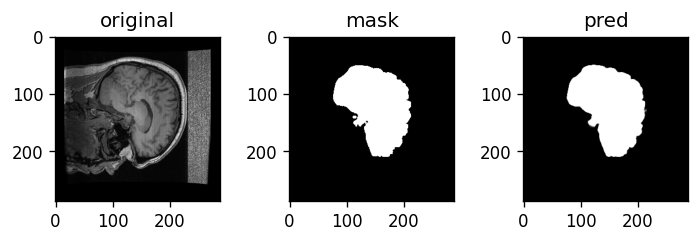

Train: Epoch 11 | Batch: 510 | Combined Loss: 0.06275827437639236 | BCE 0.01077176071703434 | dice_loss 0.051986515522003174
Avg train loss for epoch  --> 0.05478763500494616 | BCE: 0.010726468475772837 | dice_loss: 0.04406116655434421
Val: Epoch 11 | Batch: 0 | Combined Loss: 0.04966844618320465 | BCE 0.010363472625613213 | dice_loss 0.03930497169494629


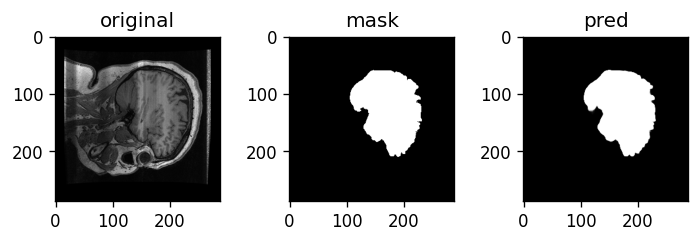

Val: Epoch 11 | Batch: 10 | Combined Loss: 0.04735240712761879 | BCE 0.010514412075281143 | dice_loss 0.036837995052337646
Val: Epoch 11 | Batch: 20 | Combined Loss: 0.04493950679898262 | BCE 0.011279333382844925 | dice_loss 0.033660173416137695
Val: Epoch 11 | Batch: 30 | Combined Loss: 0.050583481788635254 | BCE 0.011040747165679932 | dice_loss 0.03954273462295532


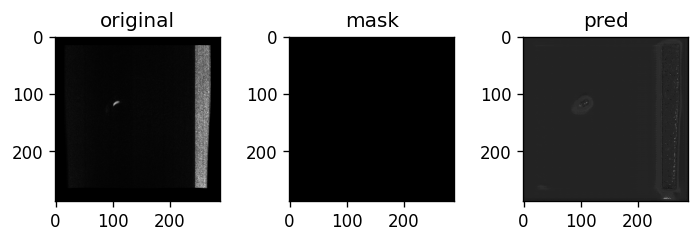

Val: Epoch 11 | Batch: 40 | Combined Loss: 0.04987132549285889 | BCE 0.013293685391545296 | dice_loss 0.03657764196395874
Val: Epoch 11 | Batch: 50 | Combined Loss: 0.05750328302383423 | BCE 0.011584343388676643 | dice_loss 0.045918941497802734
Val: Epoch 11 | Batch: 60 | Combined Loss: 0.06656035035848618 | BCE 0.009951731190085411 | dice_loss 0.056608617305755615


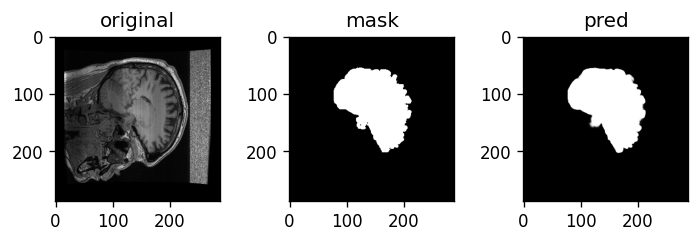

Val: Epoch 11 | Batch: 70 | Combined Loss: 0.0751279890537262 | BCE 0.00963303167372942 | dice_loss 0.06549495458602905
Val: Epoch 11 | Batch: 80 | Combined Loss: 0.05093361809849739 | BCE 0.012425084598362446 | dice_loss 0.03850853443145752
Val: Epoch 11 | Batch: 90 | Combined Loss: 0.05482715368270874 | BCE 0.010252000764012337 | dice_loss 0.04457515478134155


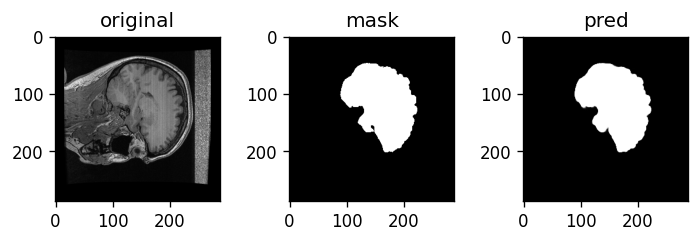

Val: Epoch 11 | Batch: 100 | Combined Loss: 0.046266697347164154 | BCE 0.010584794916212559 | dice_loss 0.03568190336227417
Val: Epoch 11 | Batch: 110 | Combined Loss: 0.04590144753456116 | BCE 0.011262746527791023 | dice_loss 0.03463870286941528
Val: Epoch 11 | Batch: 120 | Combined Loss: 0.05342409014701843 | BCE 0.008921057917177677 | dice_loss 0.04450303316116333


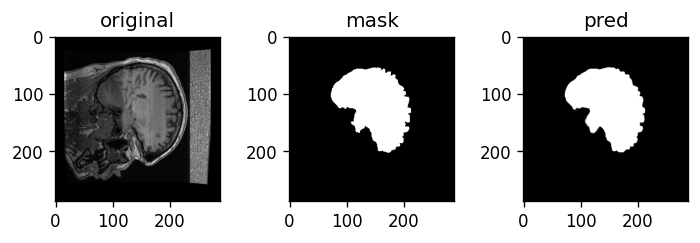

Val: Epoch 11 | Batch: 130 | Combined Loss: 0.04585324972867966 | BCE 0.010139519348740578 | dice_loss 0.03571373224258423
Average val loss for epoch  --> 0.052846729810591096 | BCE: 0.010787225276645687 | dice_loss: 0.04205950454429344
****************************************************************************************************
Train: Epoch 12 | Batch: 0 | Combined Loss: 0.042520616203546524 | BCE 0.011786376126110554 | dice_loss 0.030734241008758545


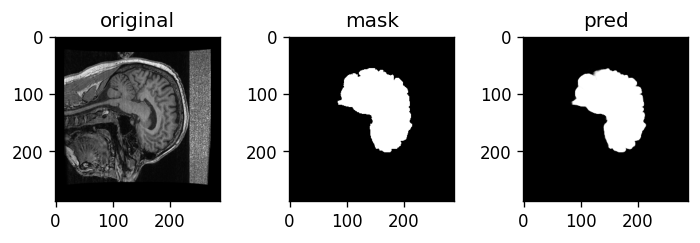

Train: Epoch 12 | Batch: 10 | Combined Loss: 0.04279853403568268 | BCE 0.011266840621829033 | dice_loss 0.031531691551208496
Train: Epoch 12 | Batch: 20 | Combined Loss: 0.037843577563762665 | BCE 0.008019678294658661 | dice_loss 0.029823899269104004
Train: Epoch 12 | Batch: 30 | Combined Loss: 0.04253627359867096 | BCE 0.009297325275838375 | dice_loss 0.03323894739151001
Train: Epoch 12 | Batch: 40 | Combined Loss: 0.06056150048971176 | BCE 0.008964737877249718 | dice_loss 0.051596760749816895
Train: Epoch 12 | Batch: 50 | Combined Loss: 0.03494289144873619 | BCE 0.009572353214025497 | dice_loss 0.025370538234710693
Train: Epoch 12 | Batch: 60 | Combined Loss: 0.05387315899133682 | BCE 0.009930351749062538 | dice_loss 0.043942809104919434
Train: Epoch 12 | Batch: 70 | Combined Loss: 0.03362172842025757 | BCE 0.008722066879272461 | dice_loss 0.024899661540985107
Train: Epoch 12 | Batch: 80 | Combined Loss: 0.05284390226006508 | BCE 0.010921510867774487 | dice_loss 0.04192239046096802
T

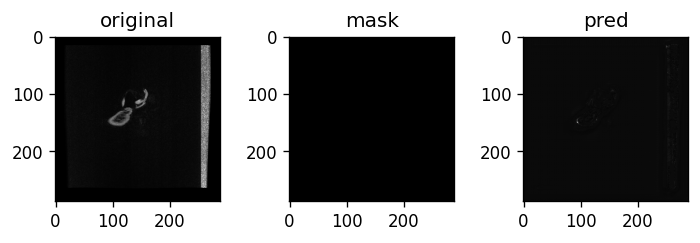

Train: Epoch 12 | Batch: 110 | Combined Loss: 0.04829617589712143 | BCE 0.010622763074934483 | dice_loss 0.03767341375350952
Train: Epoch 12 | Batch: 120 | Combined Loss: 0.038373690098524094 | BCE 0.010505001991987228 | dice_loss 0.027868688106536865
Train: Epoch 12 | Batch: 130 | Combined Loss: 0.03156275674700737 | BCE 0.0077375867404043674 | dice_loss 0.02382516860961914
Train: Epoch 12 | Batch: 140 | Combined Loss: 0.03395754471421242 | BCE 0.008882705122232437 | dice_loss 0.02507483959197998
Train: Epoch 12 | Batch: 150 | Combined Loss: 0.05209827423095703 | BCE 0.010209142230451107 | dice_loss 0.04188913106918335
Train: Epoch 12 | Batch: 160 | Combined Loss: 0.037622757256031036 | BCE 0.009480662643909454 | dice_loss 0.028142094612121582
Train: Epoch 12 | Batch: 170 | Combined Loss: 0.06259900331497192 | BCE 0.012107969261705875 | dice_loss 0.05049103498458862
Train: Epoch 12 | Batch: 180 | Combined Loss: 0.03591315448284149 | BCE 0.009033901616930962 | dice_loss 0.0268792510032

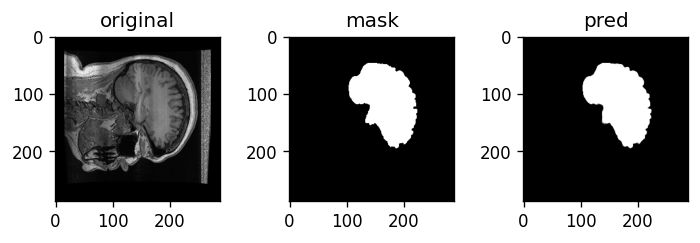

Train: Epoch 12 | Batch: 210 | Combined Loss: 0.06566619127988815 | BCE 0.009853234514594078 | dice_loss 0.055812954902648926
Train: Epoch 12 | Batch: 220 | Combined Loss: 0.0416279137134552 | BCE 0.009006710723042488 | dice_loss 0.03262120485305786
Train: Epoch 12 | Batch: 230 | Combined Loss: 0.0348685123026371 | BCE 0.008486839942634106 | dice_loss 0.02638167142868042
Train: Epoch 12 | Batch: 240 | Combined Loss: 0.03520295396447182 | BCE 0.009486112743616104 | dice_loss 0.025716841220855713
Train: Epoch 12 | Batch: 250 | Combined Loss: 0.03222184628248215 | BCE 0.00911801215261221 | dice_loss 0.023103833198547363
Train: Epoch 12 | Batch: 260 | Combined Loss: 0.03371483087539673 | BCE 0.008566676639020443 | dice_loss 0.02514815330505371
Train: Epoch 12 | Batch: 270 | Combined Loss: 0.038737703114748 | BCE 0.008229422383010387 | dice_loss 0.03050827980041504
Train: Epoch 12 | Batch: 280 | Combined Loss: 0.04802607744932175 | BCE 0.01079820841550827 | dice_loss 0.03722786903381348
Tra

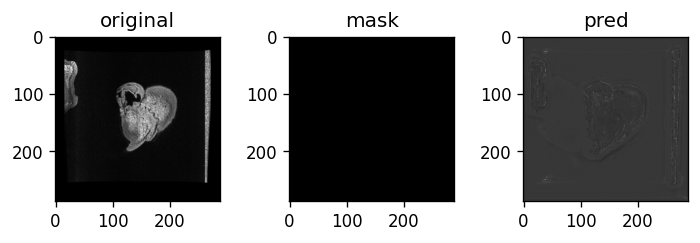

Train: Epoch 12 | Batch: 310 | Combined Loss: 0.03348568454384804 | BCE 0.00843176618218422 | dice_loss 0.02505391836166382
Train: Epoch 12 | Batch: 320 | Combined Loss: 0.0513543039560318 | BCE 0.008103086613118649 | dice_loss 0.043251216411590576
Train: Epoch 12 | Batch: 330 | Combined Loss: 0.050651684403419495 | BCE 0.010169820860028267 | dice_loss 0.04048186540603638
Train: Epoch 12 | Batch: 340 | Combined Loss: 0.03290128335356712 | BCE 0.009400720708072186 | dice_loss 0.023500561714172363
Train: Epoch 12 | Batch: 350 | Combined Loss: 0.03664770722389221 | BCE 0.00914749689400196 | dice_loss 0.0275002121925354
Train: Epoch 12 | Batch: 360 | Combined Loss: 0.03499767184257507 | BCE 0.00903293490409851 | dice_loss 0.025964736938476562
Train: Epoch 12 | Batch: 370 | Combined Loss: 0.03474632278084755 | BCE 0.009332749992609024 | dice_loss 0.025413572788238525
Train: Epoch 12 | Batch: 380 | Combined Loss: 0.03269888460636139 | BCE 0.010117127560079098 | dice_loss 0.022581756114959717

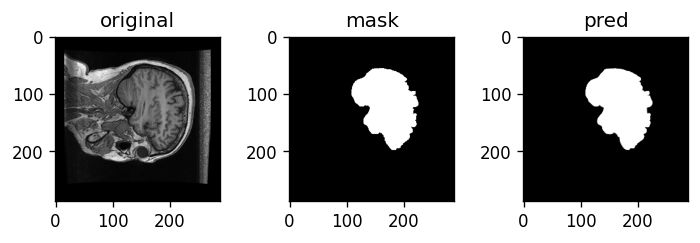

Train: Epoch 12 | Batch: 410 | Combined Loss: 0.037012990564107895 | BCE 0.010037536732852459 | dice_loss 0.02697545289993286
Train: Epoch 12 | Batch: 420 | Combined Loss: 0.047553882002830505 | BCE 0.009554012678563595 | dice_loss 0.037999868392944336
Train: Epoch 12 | Batch: 430 | Combined Loss: 0.035033442080020905 | BCE 0.008823849260807037 | dice_loss 0.026209592819213867
Train: Epoch 12 | Batch: 440 | Combined Loss: 0.028751883655786514 | BCE 0.008672152645885944 | dice_loss 0.020079731941223145
Train: Epoch 12 | Batch: 450 | Combined Loss: 0.0438445620238781 | BCE 0.009175878018140793 | dice_loss 0.034668684005737305
Train: Epoch 12 | Batch: 460 | Combined Loss: 0.04318666085600853 | BCE 0.009243544191122055 | dice_loss 0.033943116664886475
Train: Epoch 12 | Batch: 470 | Combined Loss: 0.05557242035865784 | BCE 0.00855591706931591 | dice_loss 0.04701650142669678
Train: Epoch 12 | Batch: 480 | Combined Loss: 0.04315886273980141 | BCE 0.0084211565554142 | dice_loss 0.0347377061843

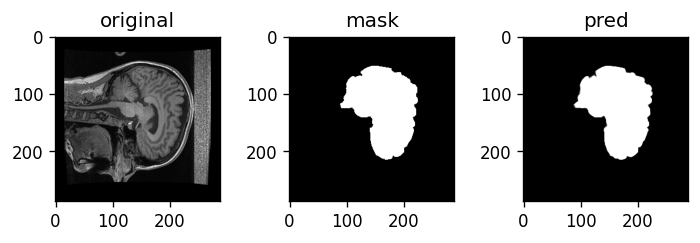

Train: Epoch 12 | Batch: 510 | Combined Loss: 0.048490334302186966 | BCE 0.009276856668293476 | dice_loss 0.039213478565216064
Avg train loss for epoch  --> 0.048581557567716795 | BCE: 0.00999368931450899 | dice_loss: 0.038587868098586685
Val: Epoch 12 | Batch: 0 | Combined Loss: 0.11265048384666443 | BCE 0.02853110432624817 | dice_loss 0.08411937952041626


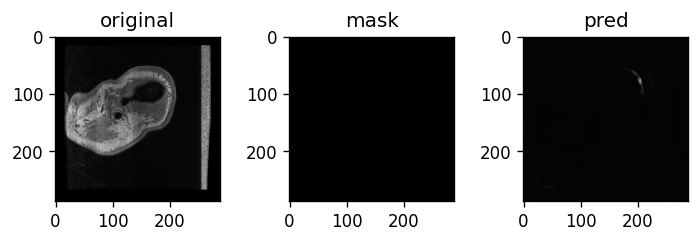

Val: Epoch 12 | Batch: 10 | Combined Loss: 0.08747673034667969 | BCE 0.03025495819747448 | dice_loss 0.05722177028656006
Val: Epoch 12 | Batch: 20 | Combined Loss: 0.13870351016521454 | BCE 0.044820237904787064 | dice_loss 0.09388327598571777
Val: Epoch 12 | Batch: 30 | Combined Loss: 0.09561940282583237 | BCE 0.03946831077337265 | dice_loss 0.05615109205245972


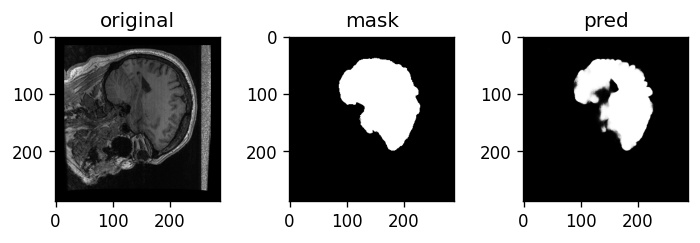

Val: Epoch 12 | Batch: 40 | Combined Loss: 0.08881956338882446 | BCE 0.02277207560837269 | dice_loss 0.06604748964309692
Val: Epoch 12 | Batch: 50 | Combined Loss: 0.07166504859924316 | BCE 0.017186526209115982 | dice_loss 0.05447852611541748
Val: Epoch 12 | Batch: 60 | Combined Loss: 0.10558942705392838 | BCE 0.03831896930932999 | dice_loss 0.06727045774459839


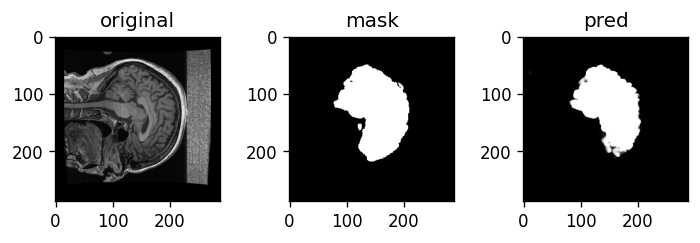

Val: Epoch 12 | Batch: 70 | Combined Loss: 0.10189778357744217 | BCE 0.023252615705132484 | dice_loss 0.07864516973495483
Val: Epoch 12 | Batch: 80 | Combined Loss: 0.07554596662521362 | BCE 0.011316657066345215 | dice_loss 0.06422930955886841
Val: Epoch 12 | Batch: 90 | Combined Loss: 0.0795973613858223 | BCE 0.01767987757921219 | dice_loss 0.06191748380661011


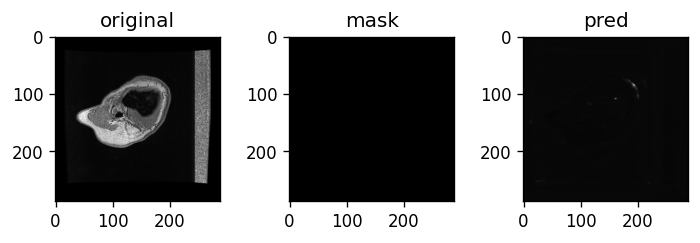

Val: Epoch 12 | Batch: 100 | Combined Loss: 0.14818836748600006 | BCE 0.052391428500413895 | dice_loss 0.09579694271087646
Val: Epoch 12 | Batch: 110 | Combined Loss: 0.11258307844400406 | BCE 0.03019336424767971 | dice_loss 0.0823897123336792
Val: Epoch 12 | Batch: 120 | Combined Loss: 0.07035500556230545 | BCE 0.026642510667443275 | dice_loss 0.043712496757507324


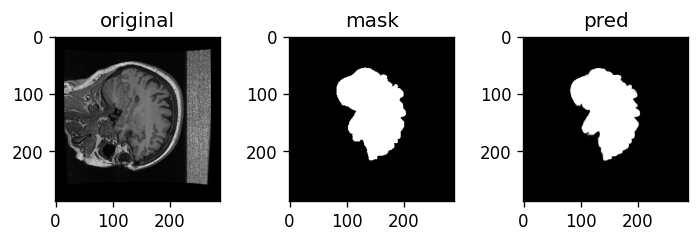

Val: Epoch 12 | Batch: 130 | Combined Loss: 0.14478112757205963 | BCE 0.0462428517639637 | dice_loss 0.09853827953338623
Average val loss for epoch  --> 0.09001186277579379 | BCE: 0.02595221868681687 | dice_loss: 0.06405964427524143
****************************************************************************************************
Train: Epoch 13 | Batch: 0 | Combined Loss: 0.05458967015147209 | BCE 0.009095651097595692 | dice_loss 0.045494019985198975


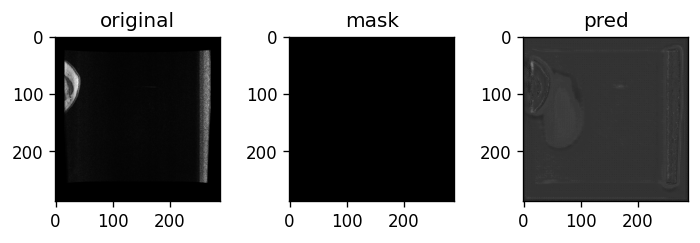

Train: Epoch 13 | Batch: 10 | Combined Loss: 0.11350300908088684 | BCE 0.04641374573111534 | dice_loss 0.0670892596244812
Train: Epoch 13 | Batch: 20 | Combined Loss: 0.07667140662670135 | BCE 0.014047964476048946 | dice_loss 0.06262344121932983
Train: Epoch 13 | Batch: 30 | Combined Loss: 0.06883952021598816 | BCE 0.019722845405340195 | dice_loss 0.049116671085357666
Train: Epoch 13 | Batch: 40 | Combined Loss: 0.06004854291677475 | BCE 0.011121234856545925 | dice_loss 0.04892730712890625
Train: Epoch 13 | Batch: 50 | Combined Loss: 0.0700368657708168 | BCE 0.020060459151864052 | dice_loss 0.0499764084815979
Train: Epoch 13 | Batch: 60 | Combined Loss: 0.042320944368839264 | BCE 0.009985961951315403 | dice_loss 0.032334983348846436
Train: Epoch 13 | Batch: 70 | Combined Loss: 0.054956257343292236 | BCE 0.009260953404009342 | dice_loss 0.04569530487060547
Train: Epoch 13 | Batch: 80 | Combined Loss: 0.04196176677942276 | BCE 0.010413506999611855 | dice_loss 0.031548261642456055
Train: 

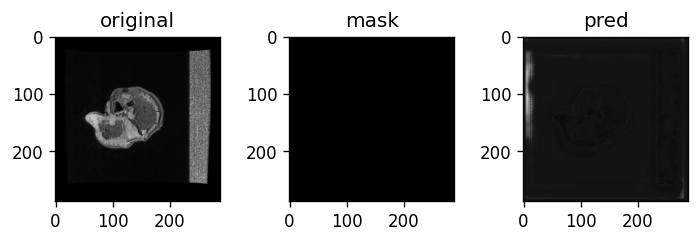

Train: Epoch 13 | Batch: 110 | Combined Loss: 0.036705195903778076 | BCE 0.009977934882044792 | dice_loss 0.026727259159088135
Train: Epoch 13 | Batch: 120 | Combined Loss: 0.035938017070293427 | BCE 0.010110309347510338 | dice_loss 0.02582770586013794
Train: Epoch 13 | Batch: 130 | Combined Loss: 0.04470233991742134 | BCE 0.014448451809585094 | dice_loss 0.030253887176513672
Train: Epoch 13 | Batch: 140 | Combined Loss: 0.0385102853178978 | BCE 0.008503099903464317 | dice_loss 0.03000718355178833
Train: Epoch 13 | Batch: 150 | Combined Loss: 0.04979543760418892 | BCE 0.012566257268190384 | dice_loss 0.037229180335998535
Train: Epoch 13 | Batch: 160 | Combined Loss: 0.03827505558729172 | BCE 0.009199609979987144 | dice_loss 0.029075443744659424
Train: Epoch 13 | Batch: 170 | Combined Loss: 0.03613521531224251 | BCE 0.008187550120055676 | dice_loss 0.027947664260864258
Train: Epoch 13 | Batch: 180 | Combined Loss: 0.04277168959379196 | BCE 0.012376240454614162 | dice_loss 0.030395448207

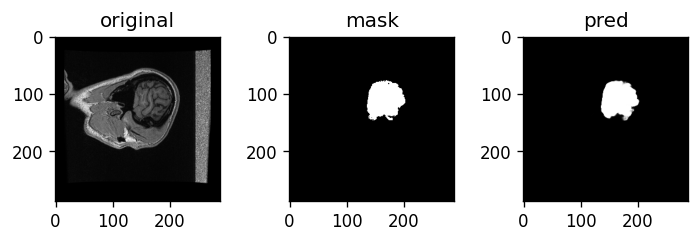

Train: Epoch 13 | Batch: 210 | Combined Loss: 0.04385032504796982 | BCE 0.010408901609480381 | dice_loss 0.03344142436981201
Train: Epoch 13 | Batch: 220 | Combined Loss: 0.04934227466583252 | BCE 0.009646473452448845 | dice_loss 0.039695799350738525
Train: Epoch 13 | Batch: 230 | Combined Loss: 0.03452732786536217 | BCE 0.008976902812719345 | dice_loss 0.025550425052642822
Train: Epoch 13 | Batch: 240 | Combined Loss: 0.035176899284124374 | BCE 0.009293105453252792 | dice_loss 0.025883793830871582
Train: Epoch 13 | Batch: 250 | Combined Loss: 0.04460261017084122 | BCE 0.008511818945407867 | dice_loss 0.03609079122543335
Train: Epoch 13 | Batch: 260 | Combined Loss: 0.037698596715927124 | BCE 0.008557231165468693 | dice_loss 0.029141366481781006
Train: Epoch 13 | Batch: 270 | Combined Loss: 0.037486396729946136 | BCE 0.009618783369660378 | dice_loss 0.027867615222930908
Train: Epoch 13 | Batch: 280 | Combined Loss: 0.03751172125339508 | BCE 0.012489987537264824 | dice_loss 0.0250217318

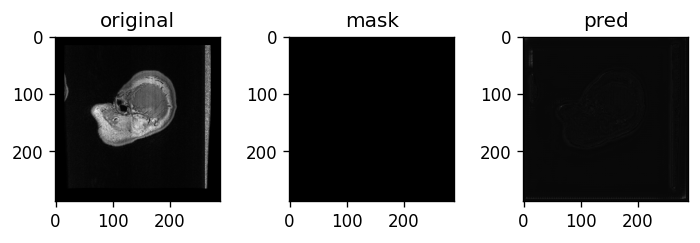

Train: Epoch 13 | Batch: 310 | Combined Loss: 0.04489824175834656 | BCE 0.010916324332356453 | dice_loss 0.033981919288635254
Train: Epoch 13 | Batch: 320 | Combined Loss: 0.07692661136388779 | BCE 0.011812649667263031 | dice_loss 0.06511396169662476
Train: Epoch 13 | Batch: 330 | Combined Loss: 0.04461266100406647 | BCE 0.010065451264381409 | dice_loss 0.03454720973968506
Train: Epoch 13 | Batch: 340 | Combined Loss: 0.04230482503771782 | BCE 0.010396551340818405 | dice_loss 0.031908273696899414
Train: Epoch 13 | Batch: 350 | Combined Loss: 0.051725342869758606 | BCE 0.008212343789637089 | dice_loss 0.04351300001144409
Train: Epoch 13 | Batch: 360 | Combined Loss: 0.03464961051940918 | BCE 0.00979918148368597 | dice_loss 0.024850428104400635
Train: Epoch 13 | Batch: 370 | Combined Loss: 0.03408065065741539 | BCE 0.007817056961357594 | dice_loss 0.02626359462738037
Train: Epoch 13 | Batch: 380 | Combined Loss: 0.03013722598552704 | BCE 0.009443924762308598 | dice_loss 0.020693302154541

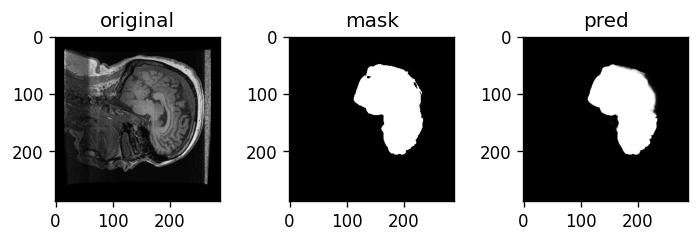

Train: Epoch 13 | Batch: 410 | Combined Loss: 0.031153731048107147 | BCE 0.009465268813073635 | dice_loss 0.021688461303710938
Train: Epoch 13 | Batch: 420 | Combined Loss: 0.034175485372543335 | BCE 0.0100193927064538 | dice_loss 0.02415609359741211
Train: Epoch 13 | Batch: 430 | Combined Loss: 0.031538426876068115 | BCE 0.008560659363865852 | dice_loss 0.022977769374847412
Train: Epoch 13 | Batch: 440 | Combined Loss: 0.05867697298526764 | BCE 0.008230401203036308 | dice_loss 0.05044656991958618
Train: Epoch 13 | Batch: 450 | Combined Loss: 0.03606267273426056 | BCE 0.009529488161206245 | dice_loss 0.026533186435699463
Train: Epoch 13 | Batch: 460 | Combined Loss: 0.03593088313937187 | BCE 0.006498467642813921 | dice_loss 0.02943241596221924
Train: Epoch 13 | Batch: 470 | Combined Loss: 0.0385875441133976 | BCE 0.00824866071343422 | dice_loss 0.03033888339996338
Train: Epoch 13 | Batch: 480 | Combined Loss: 0.047790203243494034 | BCE 0.010068687610328197 | dice_loss 0.037721514701843

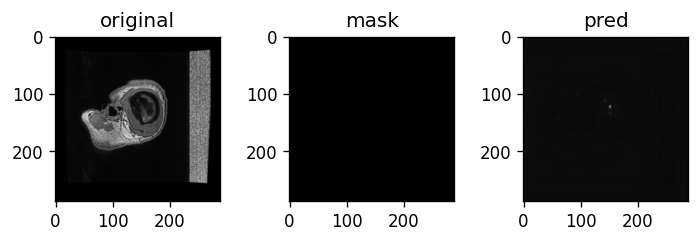

Train: Epoch 13 | Batch: 510 | Combined Loss: 0.03099190816283226 | BCE 0.008009548299014568 | dice_loss 0.022982358932495117
Avg train loss for epoch  --> 0.04665519593420176 | BCE: 0.010863941465774156 | dice_loss: 0.03579125441179312
Val: Epoch 13 | Batch: 0 | Combined Loss: 0.0404508039355278 | BCE 0.010224154219031334 | dice_loss 0.03022664785385132


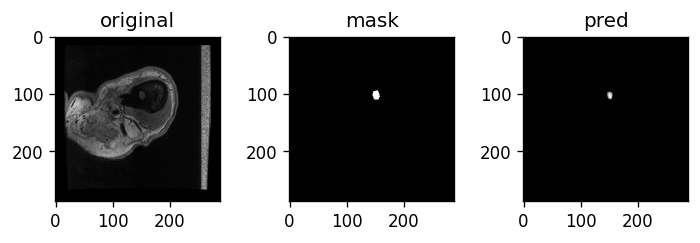

Val: Epoch 13 | Batch: 10 | Combined Loss: 0.04074392095208168 | BCE 0.007928941398859024 | dice_loss 0.032814979553222656
Val: Epoch 13 | Batch: 20 | Combined Loss: 0.035177335143089294 | BCE 0.008626864291727543 | dice_loss 0.026550471782684326
Val: Epoch 13 | Batch: 30 | Combined Loss: 0.044470738619565964 | BCE 0.006888402160257101 | dice_loss 0.037582337856292725


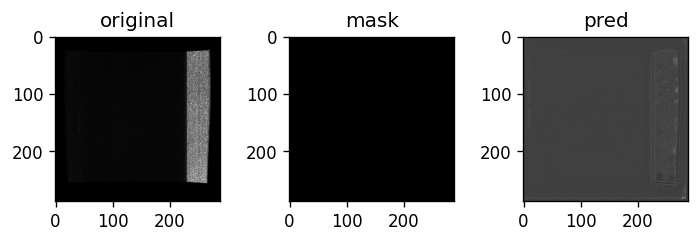

Val: Epoch 13 | Batch: 40 | Combined Loss: 0.031495317816734314 | BCE 0.007563339546322823 | dice_loss 0.02393198013305664
Val: Epoch 13 | Batch: 50 | Combined Loss: 0.04491149261593819 | BCE 0.007898080162703991 | dice_loss 0.03701341152191162
Val: Epoch 13 | Batch: 60 | Combined Loss: 0.04079665243625641 | BCE 0.007212297525256872 | dice_loss 0.0335843563079834


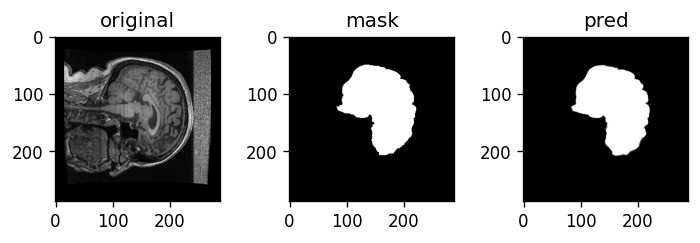

Val: Epoch 13 | Batch: 70 | Combined Loss: 0.038420677185058594 | BCE 0.007988394238054752 | dice_loss 0.030432283878326416
Val: Epoch 13 | Batch: 80 | Combined Loss: 0.033089227974414825 | BCE 0.009225020185112953 | dice_loss 0.02386420965194702
Val: Epoch 13 | Batch: 90 | Combined Loss: 0.03556044399738312 | BCE 0.007391585968434811 | dice_loss 0.028168857097625732


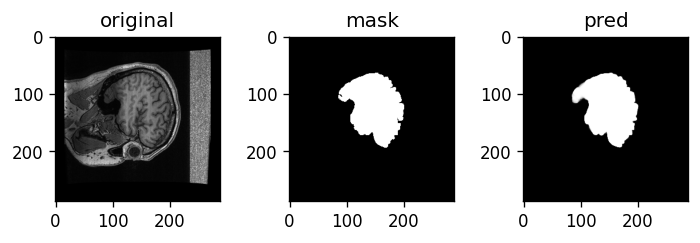

Val: Epoch 13 | Batch: 100 | Combined Loss: 0.03075632080435753 | BCE 0.008695689029991627 | dice_loss 0.022060632705688477
Val: Epoch 13 | Batch: 110 | Combined Loss: 0.032756507396698 | BCE 0.007544280495494604 | dice_loss 0.025212228298187256
Val: Epoch 13 | Batch: 120 | Combined Loss: 0.05004269629716873 | BCE 0.007878012023866177 | dice_loss 0.04216468334197998


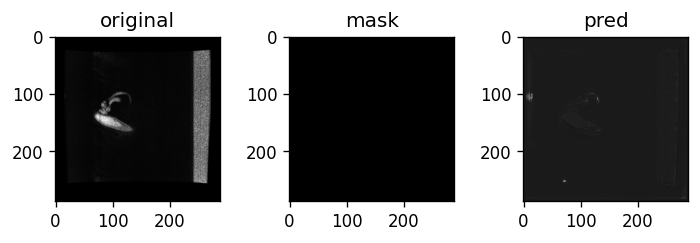

Val: Epoch 13 | Batch: 130 | Combined Loss: 0.03498905152082443 | BCE 0.008691958151757717 | dice_loss 0.02629709243774414
Average val loss for epoch  --> 0.03826696267006574 | BCE: 0.008473153174337413 | dice_loss: 0.029793809519873725
****************************************************************************************************
Train: Epoch 14 | Batch: 0 | Combined Loss: 0.0412384569644928 | BCE 0.009096772409975529 | dice_loss 0.032141685485839844


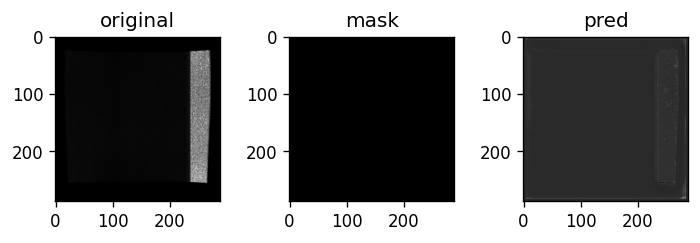

Train: Epoch 14 | Batch: 10 | Combined Loss: 0.03557366877794266 | BCE 0.010053999722003937 | dice_loss 0.02551966905593872
Train: Epoch 14 | Batch: 20 | Combined Loss: 0.0539017990231514 | BCE 0.007702240254729986 | dice_loss 0.04619956016540527
Train: Epoch 14 | Batch: 30 | Combined Loss: 0.04731239378452301 | BCE 0.008784430101513863 | dice_loss 0.0385279655456543
Train: Epoch 14 | Batch: 40 | Combined Loss: 0.052141301333904266 | BCE 0.00782030075788498 | dice_loss 0.04432100057601929
Train: Epoch 14 | Batch: 50 | Combined Loss: 0.046470336616039276 | BCE 0.009904972277581692 | dice_loss 0.03656536340713501
Train: Epoch 14 | Batch: 60 | Combined Loss: 0.0287847351282835 | BCE 0.00758753577247262 | dice_loss 0.021197199821472168
Train: Epoch 14 | Batch: 70 | Combined Loss: 0.036152251064777374 | BCE 0.009019201621413231 | dice_loss 0.027133047580718994
Train: Epoch 14 | Batch: 80 | Combined Loss: 0.04364411532878876 | BCE 0.009926007129251957 | dice_loss 0.033718109130859375
Train: 

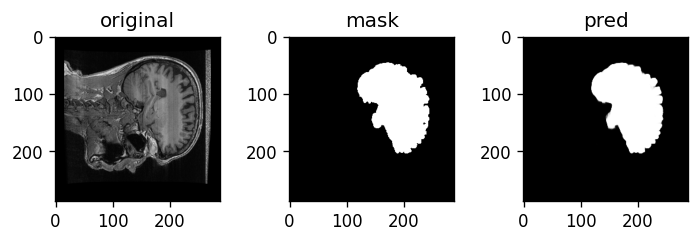

Train: Epoch 14 | Batch: 110 | Combined Loss: 0.02957785688340664 | BCE 0.007695680949836969 | dice_loss 0.021882176399230957
Train: Epoch 14 | Batch: 120 | Combined Loss: 0.04280506446957588 | BCE 0.008079218678176403 | dice_loss 0.034725844860076904
Train: Epoch 14 | Batch: 130 | Combined Loss: 0.04136112704873085 | BCE 0.010409567505121231 | dice_loss 0.03095155954360962
Train: Epoch 14 | Batch: 140 | Combined Loss: 0.03722142428159714 | BCE 0.006717495620250702 | dice_loss 0.030503928661346436
Train: Epoch 14 | Batch: 150 | Combined Loss: 0.0517897754907608 | BCE 0.010365084744989872 | dice_loss 0.041424691677093506
Train: Epoch 14 | Batch: 160 | Combined Loss: 0.030224081128835678 | BCE 0.007554051466286182 | dice_loss 0.02267003059387207
Train: Epoch 14 | Batch: 170 | Combined Loss: 0.045442014932632446 | BCE 0.007888706400990486 | dice_loss 0.03755331039428711
Train: Epoch 14 | Batch: 180 | Combined Loss: 0.034860897809267044 | BCE 0.008461703546345234 | dice_loss 0.026399195194

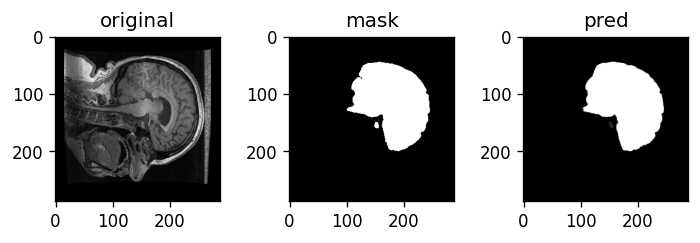

Train: Epoch 14 | Batch: 210 | Combined Loss: 0.0405697301030159 | BCE 0.0073323929682374 | dice_loss 0.033237338066101074
Train: Epoch 14 | Batch: 220 | Combined Loss: 0.0376797616481781 | BCE 0.008252888917922974 | dice_loss 0.029426872730255127
Train: Epoch 14 | Batch: 230 | Combined Loss: 0.02569878101348877 | BCE 0.0065319533459842205 | dice_loss 0.01916682720184326
Train: Epoch 14 | Batch: 240 | Combined Loss: 0.029143335297703743 | BCE 0.0073539637960493565 | dice_loss 0.021789371967315674
Train: Epoch 14 | Batch: 250 | Combined Loss: 0.043794602155685425 | BCE 0.009216157719492912 | dice_loss 0.03457844257354736
Train: Epoch 14 | Batch: 260 | Combined Loss: 0.04432275518774986 | BCE 0.009324694983661175 | dice_loss 0.03499805927276611
Train: Epoch 14 | Batch: 270 | Combined Loss: 0.0385383702814579 | BCE 0.010016773827373981 | dice_loss 0.028521597385406494
Train: Epoch 14 | Batch: 280 | Combined Loss: 0.04333269223570824 | BCE 0.010222013108432293 | dice_loss 0.033110678195953

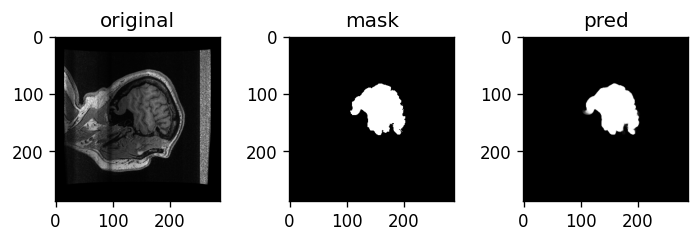

Train: Epoch 14 | Batch: 310 | Combined Loss: 0.027607139199972153 | BCE 0.008359665982425213 | dice_loss 0.019247472286224365
Train: Epoch 14 | Batch: 320 | Combined Loss: 0.040156230330467224 | BCE 0.006814465392380953 | dice_loss 0.03334176540374756
Train: Epoch 14 | Batch: 330 | Combined Loss: 0.03294559568166733 | BCE 0.008337936364114285 | dice_loss 0.02460765838623047
Train: Epoch 14 | Batch: 340 | Combined Loss: 0.041509535163640976 | BCE 0.007322396617382765 | dice_loss 0.034187138080596924
Train: Epoch 14 | Batch: 350 | Combined Loss: 0.025699209421873093 | BCE 0.006591390818357468 | dice_loss 0.019107818603515625
Train: Epoch 14 | Batch: 360 | Combined Loss: 0.02878798171877861 | BCE 0.008013973943889141 | dice_loss 0.020774006843566895
Train: Epoch 14 | Batch: 370 | Combined Loss: 0.028872288763523102 | BCE 0.007281460799276829 | dice_loss 0.021590828895568848
Train: Epoch 14 | Batch: 380 | Combined Loss: 0.038610365241765976 | BCE 0.006616797763854265 | dice_loss 0.0319935

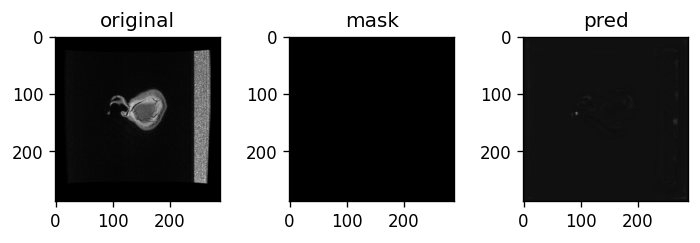

Train: Epoch 14 | Batch: 410 | Combined Loss: 0.030156873166561127 | BCE 0.007370077073574066 | dice_loss 0.02278679609298706
Train: Epoch 14 | Batch: 420 | Combined Loss: 0.03235528990626335 | BCE 0.00959340762346983 | dice_loss 0.022761881351470947
Train: Epoch 14 | Batch: 430 | Combined Loss: 0.03980712965130806 | BCE 0.007185507565736771 | dice_loss 0.03262162208557129
Train: Epoch 14 | Batch: 440 | Combined Loss: 0.0269906148314476 | BCE 0.00721123069524765 | dice_loss 0.01977938413619995
Train: Epoch 14 | Batch: 450 | Combined Loss: 0.043549440801143646 | BCE 0.00944819487631321 | dice_loss 0.034101247787475586
Train: Epoch 14 | Batch: 460 | Combined Loss: 0.028602752834558487 | BCE 0.00828996580094099 | dice_loss 0.020312786102294922
Train: Epoch 14 | Batch: 470 | Combined Loss: 0.03631100058555603 | BCE 0.011907844804227352 | dice_loss 0.024403154850006104
Train: Epoch 14 | Batch: 480 | Combined Loss: 0.03529967740178108 | BCE 0.00830491166561842 | dice_loss 0.02699476480484008

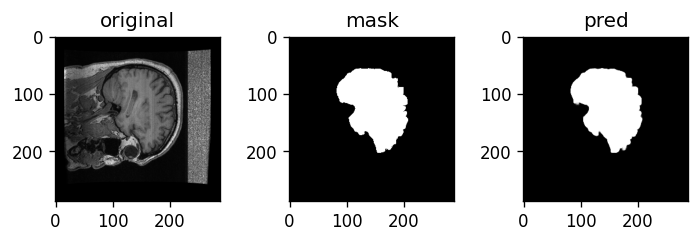

Train: Epoch 14 | Batch: 510 | Combined Loss: 0.03827042505145073 | BCE 0.009180794470012188 | dice_loss 0.029089629650115967
Avg train loss for epoch  --> 0.03652665553017588 | BCE: 0.008227952047607153 | dice_loss: 0.028298703514931283
Val: Epoch 14 | Batch: 0 | Combined Loss: 0.03834109008312225 | BCE 0.008878096006810665 | dice_loss 0.029462993144989014


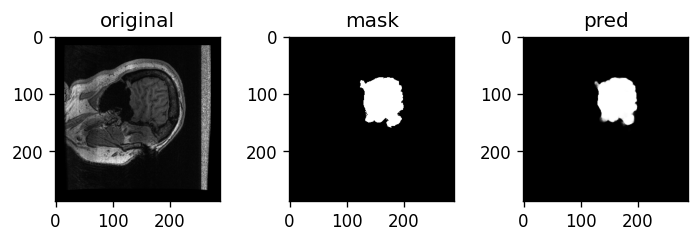

Val: Epoch 14 | Batch: 10 | Combined Loss: 0.03301495686173439 | BCE 0.007111614104360342 | dice_loss 0.02590334415435791
Val: Epoch 14 | Batch: 20 | Combined Loss: 0.03118876740336418 | BCE 0.007206242997199297 | dice_loss 0.023982524871826172
Val: Epoch 14 | Batch: 30 | Combined Loss: 0.028798473998904228 | BCE 0.00914771668612957 | dice_loss 0.019650757312774658


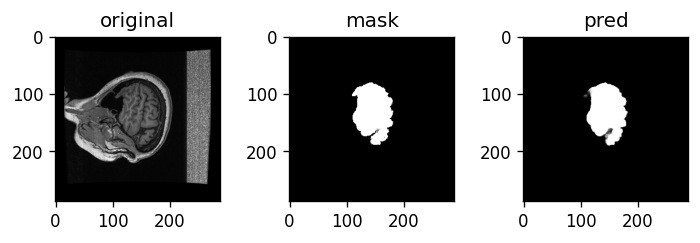

Val: Epoch 14 | Batch: 40 | Combined Loss: 0.036466117948293686 | BCE 0.0071209631860256195 | dice_loss 0.029345154762268066
Val: Epoch 14 | Batch: 50 | Combined Loss: 0.03439968079328537 | BCE 0.00809579435735941 | dice_loss 0.026303887367248535
Val: Epoch 14 | Batch: 60 | Combined Loss: 0.028710316866636276 | BCE 0.007890713401138783 | dice_loss 0.02081960439682007


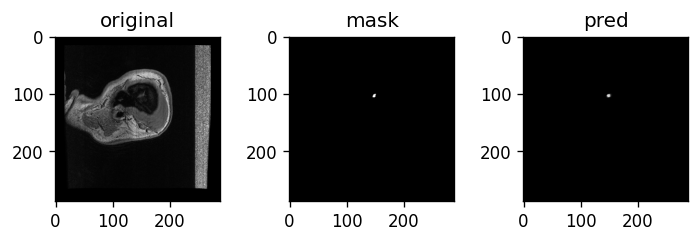

Val: Epoch 14 | Batch: 70 | Combined Loss: 0.030803881585597992 | BCE 0.007752201519906521 | dice_loss 0.023051679134368896
Val: Epoch 14 | Batch: 80 | Combined Loss: 0.0339047908782959 | BCE 0.009432612918317318 | dice_loss 0.024472177028656006
Val: Epoch 14 | Batch: 90 | Combined Loss: 0.02857234887778759 | BCE 0.006630805786699057 | dice_loss 0.021941542625427246


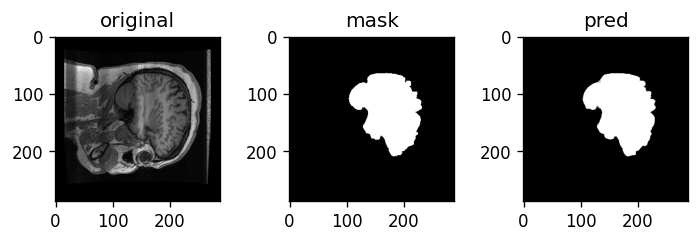

Val: Epoch 14 | Batch: 100 | Combined Loss: 0.041788727045059204 | BCE 0.0075137922540307045 | dice_loss 0.034274935722351074
Val: Epoch 14 | Batch: 110 | Combined Loss: 0.02849702164530754 | BCE 0.0074232639744877815 | dice_loss 0.021073758602142334
Val: Epoch 14 | Batch: 120 | Combined Loss: 0.029120195657014847 | BCE 0.006412019021809101 | dice_loss 0.02270817756652832


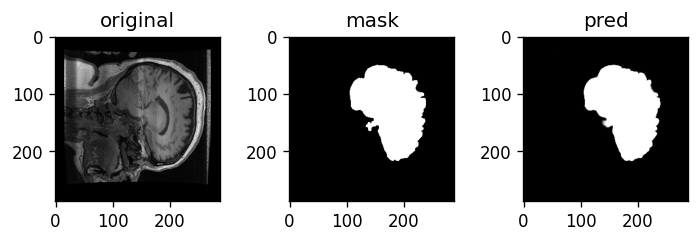

Val: Epoch 14 | Batch: 130 | Combined Loss: 0.03257429227232933 | BCE 0.00857448298484087 | dice_loss 0.023999810218811035
Average val loss for epoch  --> 0.03339892100128863 | BCE: 0.007786657266249811 | dice_loss: 0.02561226376780757
****************************************************************************************************
Train: Epoch 15 | Batch: 0 | Combined Loss: 0.03488895297050476 | BCE 0.010019928216934204 | dice_loss 0.024869024753570557


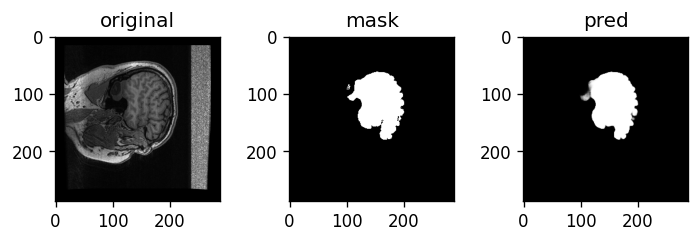

Train: Epoch 15 | Batch: 10 | Combined Loss: 0.025925613939762115 | BCE 0.007317997980862856 | dice_loss 0.018607616424560547
Train: Epoch 15 | Batch: 20 | Combined Loss: 0.03666041046380997 | BCE 0.007589378394186497 | dice_loss 0.029071033000946045
Train: Epoch 15 | Batch: 30 | Combined Loss: 0.04603483900427818 | BCE 0.0070200818590819836 | dice_loss 0.03901475667953491
Train: Epoch 15 | Batch: 40 | Combined Loss: 0.0314127542078495 | BCE 0.007736001629382372 | dice_loss 0.023676753044128418
Train: Epoch 15 | Batch: 50 | Combined Loss: 0.03418530523777008 | BCE 0.007511811330914497 | dice_loss 0.026673495769500732
Train: Epoch 15 | Batch: 60 | Combined Loss: 0.03790472447872162 | BCE 0.007687435019761324 | dice_loss 0.030217289924621582
Train: Epoch 15 | Batch: 70 | Combined Loss: 0.03256969898939133 | BCE 0.006075732409954071 | dice_loss 0.026493966579437256
Train: Epoch 15 | Batch: 80 | Combined Loss: 0.03347701579332352 | BCE 0.007815786637365818 | dice_loss 0.025661230087280273


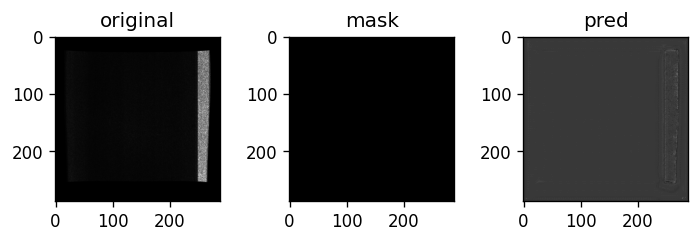

Train: Epoch 15 | Batch: 110 | Combined Loss: 0.04453807324171066 | BCE 0.0067159440368413925 | dice_loss 0.03782212734222412
Train: Epoch 15 | Batch: 120 | Combined Loss: 0.025116972625255585 | BCE 0.006729893386363983 | dice_loss 0.0183870792388916
Train: Epoch 15 | Batch: 130 | Combined Loss: 0.0323815792798996 | BCE 0.007008417043834925 | dice_loss 0.02537316083908081
Train: Epoch 15 | Batch: 140 | Combined Loss: 0.041257910430431366 | BCE 0.007677548564970493 | dice_loss 0.03358036279678345
Train: Epoch 15 | Batch: 150 | Combined Loss: 0.0459643229842186 | BCE 0.006290340330451727 | dice_loss 0.03967398405075073
Train: Epoch 15 | Batch: 160 | Combined Loss: 0.03304136171936989 | BCE 0.0062869214452803135 | dice_loss 0.026754438877105713
Train: Epoch 15 | Batch: 170 | Combined Loss: 0.04044409096240997 | BCE 0.007160380948334932 | dice_loss 0.03328371047973633
Train: Epoch 15 | Batch: 180 | Combined Loss: 0.023717092350125313 | BCE 0.006347106769680977 | dice_loss 0.017369985580444

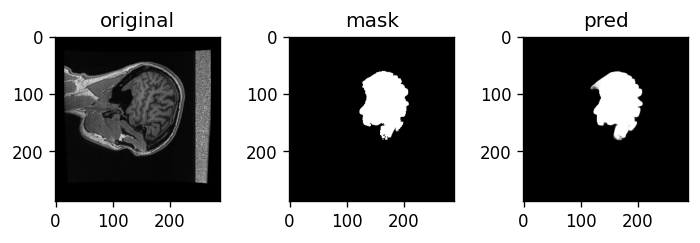

Train: Epoch 15 | Batch: 210 | Combined Loss: 0.030895918607711792 | BCE 0.006258755456656218 | dice_loss 0.024637162685394287
Train: Epoch 15 | Batch: 220 | Combined Loss: 0.03046942874789238 | BCE 0.007451903540641069 | dice_loss 0.023017525672912598
Train: Epoch 15 | Batch: 230 | Combined Loss: 0.02555980533361435 | BCE 0.007357499562203884 | dice_loss 0.01820230484008789
Train: Epoch 15 | Batch: 240 | Combined Loss: 0.02616923116147518 | BCE 0.007390430197119713 | dice_loss 0.01877880096435547
Train: Epoch 15 | Batch: 250 | Combined Loss: 0.03671715781092644 | BCE 0.00676570413634181 | dice_loss 0.02995145320892334
Train: Epoch 15 | Batch: 260 | Combined Loss: 0.041029173880815506 | BCE 0.00910087302327156 | dice_loss 0.031928300857543945
Train: Epoch 15 | Batch: 270 | Combined Loss: 0.029590783640742302 | BCE 0.008621511980891228 | dice_loss 0.020969271659851074
Train: Epoch 15 | Batch: 280 | Combined Loss: 0.027569279074668884 | BCE 0.007924720644950867 | dice_loss 0.019644558429

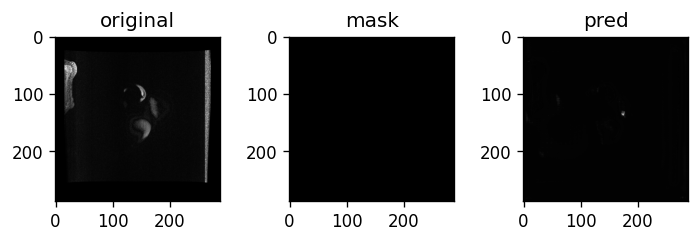

Train: Epoch 15 | Batch: 310 | Combined Loss: 0.03194798529148102 | BCE 0.008904768154025078 | dice_loss 0.02304321527481079
Train: Epoch 15 | Batch: 320 | Combined Loss: 0.04155757650732994 | BCE 0.007317747455090284 | dice_loss 0.03423982858657837
Train: Epoch 15 | Batch: 330 | Combined Loss: 0.03623061627149582 | BCE 0.007284095510840416 | dice_loss 0.028946518898010254
Train: Epoch 15 | Batch: 340 | Combined Loss: 0.03415578603744507 | BCE 0.007253110408782959 | dice_loss 0.02690267562866211
Train: Epoch 15 | Batch: 350 | Combined Loss: 0.02777407318353653 | BCE 0.008451438508927822 | dice_loss 0.019322633743286133
Train: Epoch 15 | Batch: 360 | Combined Loss: 0.035339802503585815 | BCE 0.006018190179020166 | dice_loss 0.029321610927581787
Train: Epoch 15 | Batch: 370 | Combined Loss: 0.03507456183433533 | BCE 0.007143289782106876 | dice_loss 0.027931272983551025
Train: Epoch 15 | Batch: 380 | Combined Loss: 0.026901494711637497 | BCE 0.007898581214249134 | dice_loss 0.019002914428

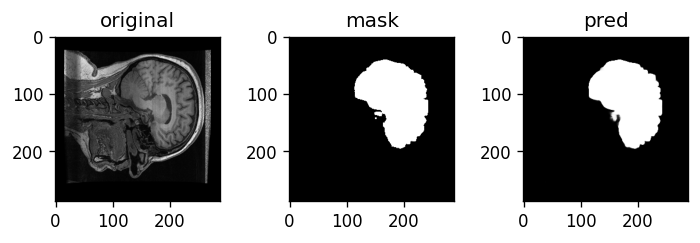

Train: Epoch 15 | Batch: 410 | Combined Loss: 0.03608404099941254 | BCE 0.0064715007320046425 | dice_loss 0.02961254119873047
Train: Epoch 15 | Batch: 420 | Combined Loss: 0.02510007657110691 | BCE 0.006171965505927801 | dice_loss 0.018928110599517822
Train: Epoch 15 | Batch: 430 | Combined Loss: 0.028453703969717026 | BCE 0.008870956487953663 | dice_loss 0.019582748413085938
Train: Epoch 15 | Batch: 440 | Combined Loss: 0.025645853951573372 | BCE 0.007873954251408577 | dice_loss 0.017771899700164795
Train: Epoch 15 | Batch: 450 | Combined Loss: 0.05199769139289856 | BCE 0.009596317075192928 | dice_loss 0.04240137338638306
Train: Epoch 15 | Batch: 460 | Combined Loss: 0.03646264597773552 | BCE 0.009260636754333973 | dice_loss 0.02720201015472412
Train: Epoch 15 | Batch: 470 | Combined Loss: 0.026099294424057007 | BCE 0.006969601847231388 | dice_loss 0.019129693508148193
Train: Epoch 15 | Batch: 480 | Combined Loss: 0.026515714824199677 | BCE 0.006904296576976776 | dice_loss 0.019611418

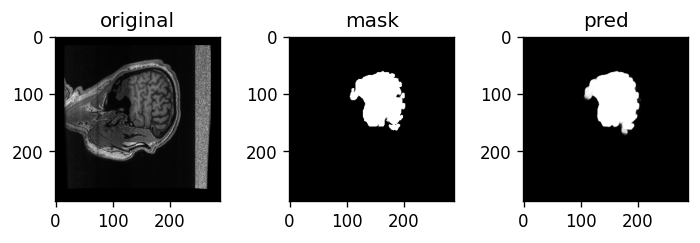

Train: Epoch 15 | Batch: 510 | Combined Loss: 0.02517402358353138 | BCE 0.0074340119026601315 | dice_loss 0.01774001121520996
Avg train loss for epoch  --> 0.03289893756056039 | BCE: 0.007593704468451987 | dice_loss: 0.025305233176610646
Val: Epoch 15 | Batch: 0 | Combined Loss: 0.02644416317343712 | BCE 0.006477381102740765 | dice_loss 0.01996678113937378


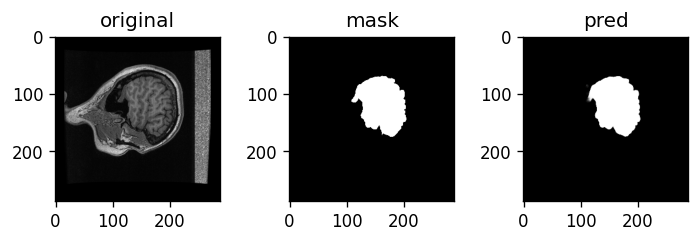

Val: Epoch 15 | Batch: 10 | Combined Loss: 0.03327867016196251 | BCE 0.010372127406299114 | dice_loss 0.02290654182434082
Val: Epoch 15 | Batch: 20 | Combined Loss: 0.03248254582285881 | BCE 0.007652918342500925 | dice_loss 0.024829626083374023
Val: Epoch 15 | Batch: 30 | Combined Loss: 0.02892240881919861 | BCE 0.008229106664657593 | dice_loss 0.020693302154541016


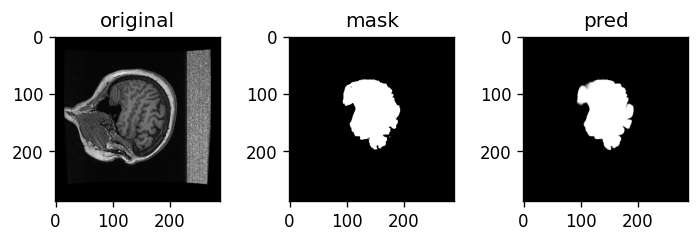

Val: Epoch 15 | Batch: 40 | Combined Loss: 0.026574632152915 | BCE 0.008328339084982872 | dice_loss 0.01824629306793213
Val: Epoch 15 | Batch: 50 | Combined Loss: 0.03390057757496834 | BCE 0.006757099647074938 | dice_loss 0.027143478393554688
Val: Epoch 15 | Batch: 60 | Combined Loss: 0.03216380998492241 | BCE 0.006887806113809347 | dice_loss 0.025276005268096924


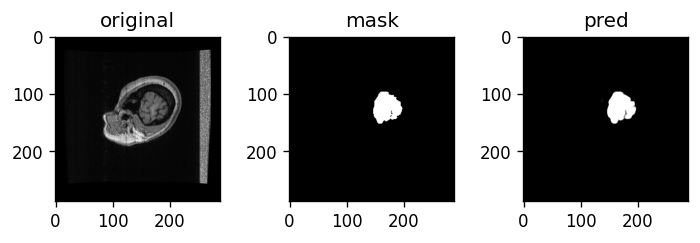

Val: Epoch 15 | Batch: 70 | Combined Loss: 0.028369253501296043 | BCE 0.008037453517317772 | dice_loss 0.02033179998397827
Val: Epoch 15 | Batch: 80 | Combined Loss: 0.028867654502391815 | BCE 0.0075119659304618835 | dice_loss 0.02135568857192993
Val: Epoch 15 | Batch: 90 | Combined Loss: 0.03293543681502342 | BCE 0.008970077149569988 | dice_loss 0.02396535873413086


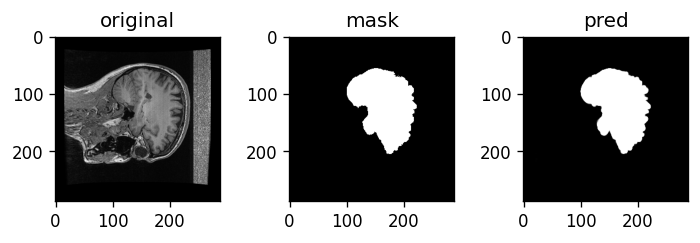

Val: Epoch 15 | Batch: 100 | Combined Loss: 0.029382742941379547 | BCE 0.007936753332614899 | dice_loss 0.02144598960876465
Val: Epoch 15 | Batch: 110 | Combined Loss: 0.0309344120323658 | BCE 0.009303648956120014 | dice_loss 0.02163076400756836
Val: Epoch 15 | Batch: 120 | Combined Loss: 0.030309325084090233 | BCE 0.009129589423537254 | dice_loss 0.02117973566055298


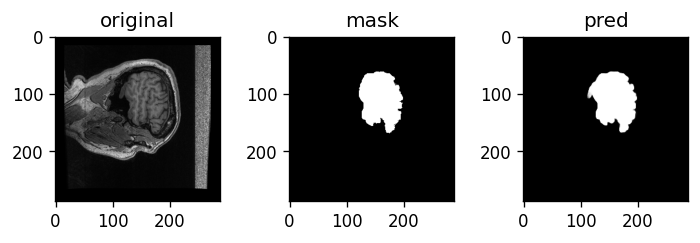

Val: Epoch 15 | Batch: 130 | Combined Loss: 0.02922501228749752 | BCE 0.006046554073691368 | dice_loss 0.023178458213806152
Average val loss for epoch  --> 0.031235337381561597 | BCE: 0.0075959992629510385 | dice_loss: 0.02363933810481319
****************************************************************************************************
Train: Epoch 16 | Batch: 0 | Combined Loss: 0.025684254243969917 | BCE 0.0058275628834962845 | dice_loss 0.019856691360473633


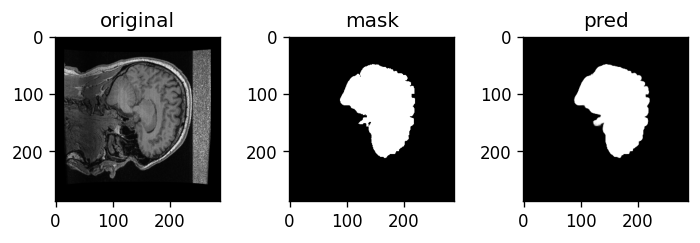

Train: Epoch 16 | Batch: 10 | Combined Loss: 0.03397086262702942 | BCE 0.007730214856564999 | dice_loss 0.026240646839141846
Train: Epoch 16 | Batch: 20 | Combined Loss: 0.026926737278699875 | BCE 0.0074304151348769665 | dice_loss 0.01949632167816162
Train: Epoch 16 | Batch: 30 | Combined Loss: 0.030587827786803246 | BCE 0.006878888234496117 | dice_loss 0.02370893955230713
Train: Epoch 16 | Batch: 40 | Combined Loss: 0.03484160825610161 | BCE 0.00806517619639635 | dice_loss 0.026776432991027832
Train: Epoch 16 | Batch: 50 | Combined Loss: 0.028646953403949738 | BCE 0.009682008065283298 | dice_loss 0.018964946269989014
Train: Epoch 16 | Batch: 60 | Combined Loss: 0.039512015879154205 | BCE 0.008854424580931664 | dice_loss 0.030657589435577393
Train: Epoch 16 | Batch: 70 | Combined Loss: 0.024357477203011513 | BCE 0.006484845653176308 | dice_loss 0.017872631549835205
Train: Epoch 16 | Batch: 80 | Combined Loss: 0.02802502177655697 | BCE 0.006790390238165855 | dice_loss 0.0212346315383911

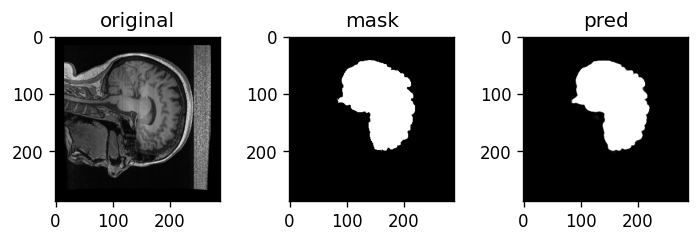

Train: Epoch 16 | Batch: 110 | Combined Loss: 0.03165034204721451 | BCE 0.007800614461302757 | dice_loss 0.0238497257232666
Train: Epoch 16 | Batch: 120 | Combined Loss: 0.02612408623099327 | BCE 0.006984974257647991 | dice_loss 0.019139111042022705
Train: Epoch 16 | Batch: 130 | Combined Loss: 0.03004140593111515 | BCE 0.008357057347893715 | dice_loss 0.021684348583221436
Train: Epoch 16 | Batch: 140 | Combined Loss: 0.038423676043748856 | BCE 0.007050713058561087 | dice_loss 0.03137296438217163
Train: Epoch 16 | Batch: 150 | Combined Loss: 0.03295692801475525 | BCE 0.008860081434249878 | dice_loss 0.02409684658050537
Train: Epoch 16 | Batch: 160 | Combined Loss: 0.030718117952346802 | BCE 0.0055415937677025795 | dice_loss 0.025176525115966797
Train: Epoch 16 | Batch: 170 | Combined Loss: 0.02805071696639061 | BCE 0.008462603203952312 | dice_loss 0.019588112831115723
Train: Epoch 16 | Batch: 180 | Combined Loss: 0.02699621021747589 | BCE 0.006865516770631075 | dice_loss 0.020130693912

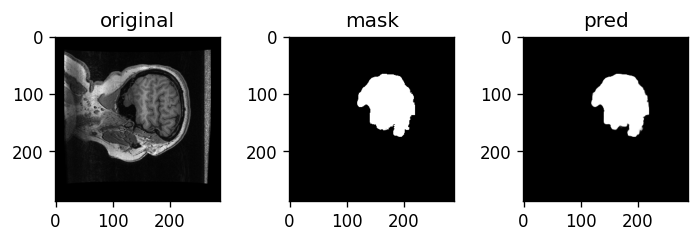

Train: Epoch 16 | Batch: 210 | Combined Loss: 0.028380148112773895 | BCE 0.006907992996275425 | dice_loss 0.021472156047821045
Train: Epoch 16 | Batch: 220 | Combined Loss: 0.03436216339468956 | BCE 0.008197571150958538 | dice_loss 0.026164591312408447
Train: Epoch 16 | Batch: 230 | Combined Loss: 0.02814606763422489 | BCE 0.005984465125948191 | dice_loss 0.02216160297393799
Train: Epoch 16 | Batch: 240 | Combined Loss: 0.026993967592716217 | BCE 0.006910480093210936 | dice_loss 0.020083487033843994
Train: Epoch 16 | Batch: 250 | Combined Loss: 0.026139384135603905 | BCE 0.008214717730879784 | dice_loss 0.01792466640472412
Train: Epoch 16 | Batch: 260 | Combined Loss: 0.02437531016767025 | BCE 0.00545828603208065 | dice_loss 0.0189170241355896
Train: Epoch 16 | Batch: 270 | Combined Loss: 0.034209925681352615 | BCE 0.005650360602885485 | dice_loss 0.028559565544128418
Train: Epoch 16 | Batch: 280 | Combined Loss: 0.028061596676707268 | BCE 0.007803408429026604 | dice_loss 0.02025818824

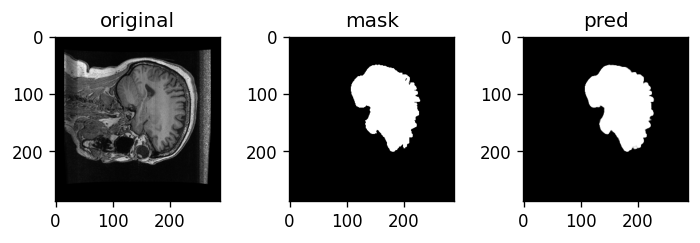

Train: Epoch 16 | Batch: 310 | Combined Loss: 0.02441190555691719 | BCE 0.006740320008248091 | dice_loss 0.017671585083007812
Train: Epoch 16 | Batch: 320 | Combined Loss: 0.021608499810099602 | BCE 0.006133882328867912 | dice_loss 0.01547461748123169
Train: Epoch 16 | Batch: 330 | Combined Loss: 0.02758084610104561 | BCE 0.00891201477497816 | dice_loss 0.018668830394744873
Train: Epoch 16 | Batch: 340 | Combined Loss: 0.028624968603253365 | BCE 0.007200436666607857 | dice_loss 0.021424531936645508
Train: Epoch 16 | Batch: 350 | Combined Loss: 0.04097232595086098 | BCE 0.007127794437110424 | dice_loss 0.03384453058242798
Train: Epoch 16 | Batch: 360 | Combined Loss: 0.029083654284477234 | BCE 0.005782886873930693 | dice_loss 0.023300766944885254
Train: Epoch 16 | Batch: 370 | Combined Loss: 0.025040600448846817 | BCE 0.00622353283688426 | dice_loss 0.01881706714630127
Train: Epoch 16 | Batch: 380 | Combined Loss: 0.04876294732093811 | BCE 0.010028691962361336 | dice_loss 0.038734257221

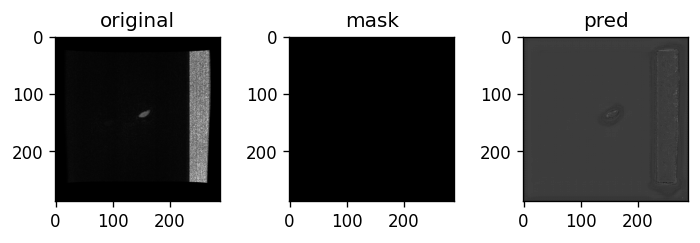

Train: Epoch 16 | Batch: 410 | Combined Loss: 0.02676079422235489 | BCE 0.006682314909994602 | dice_loss 0.02007848024368286
Train: Epoch 16 | Batch: 420 | Combined Loss: 0.026586273685097694 | BCE 0.007997671142220497 | dice_loss 0.018588602542877197
Train: Epoch 16 | Batch: 430 | Combined Loss: 0.038177501410245895 | BCE 0.007464120630174875 | dice_loss 0.030713379383087158
Train: Epoch 16 | Batch: 440 | Combined Loss: 0.03011423721909523 | BCE 0.007175389677286148 | dice_loss 0.022938847541809082
Train: Epoch 16 | Batch: 450 | Combined Loss: 0.02549833245575428 | BCE 0.0067334785126149654 | dice_loss 0.018764853477478027
Train: Epoch 16 | Batch: 460 | Combined Loss: 0.022850623354315758 | BCE 0.006584456190466881 | dice_loss 0.016266167163848877
Train: Epoch 16 | Batch: 470 | Combined Loss: 0.032633572816848755 | BCE 0.007327050436288118 | dice_loss 0.025306522846221924
Train: Epoch 16 | Batch: 480 | Combined Loss: 0.02491830661892891 | BCE 0.006532897241413593 | dice_loss 0.0183854

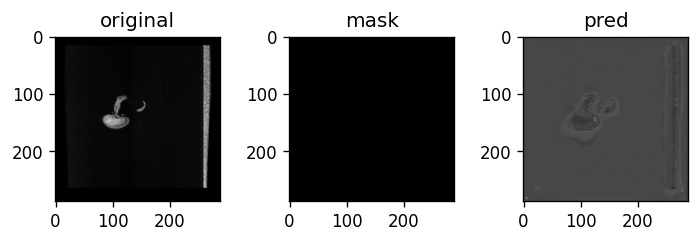

Train: Epoch 16 | Batch: 510 | Combined Loss: 0.02452160231769085 | BCE 0.006805493030697107 | dice_loss 0.01771610975265503
Avg train loss for epoch  --> 0.029569318672663686 | BCE: 0.007115709593584293 | dice_loss: 0.022453609120431553
Val: Epoch 16 | Batch: 0 | Combined Loss: 0.0253109410405159 | BCE 0.0068265278823673725 | dice_loss 0.018484413623809814


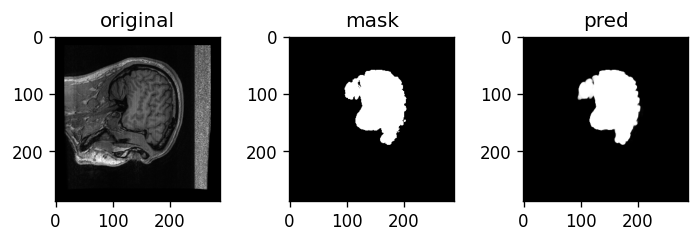

Val: Epoch 16 | Batch: 10 | Combined Loss: 0.028376756235957146 | BCE 0.007257102522999048 | dice_loss 0.021119654178619385
Val: Epoch 16 | Batch: 20 | Combined Loss: 0.02510814554989338 | BCE 0.00758807547390461 | dice_loss 0.01752007007598877
Val: Epoch 16 | Batch: 30 | Combined Loss: 0.028160318732261658 | BCE 0.005986139178276062 | dice_loss 0.022174179553985596


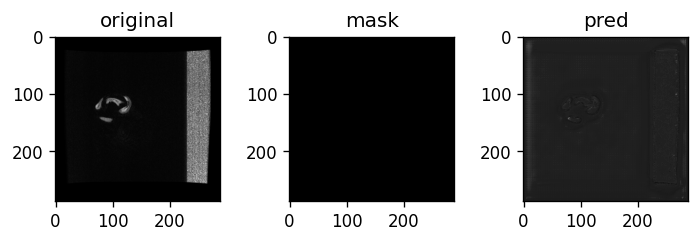

Val: Epoch 16 | Batch: 40 | Combined Loss: 0.02918204665184021 | BCE 0.005230277311056852 | dice_loss 0.02395176887512207
Val: Epoch 16 | Batch: 50 | Combined Loss: 0.022754337638616562 | BCE 0.0060805934481322765 | dice_loss 0.016673743724822998
Val: Epoch 16 | Batch: 60 | Combined Loss: 0.021281950175762177 | BCE 0.0048200408928096294 | dice_loss 0.01646190881729126


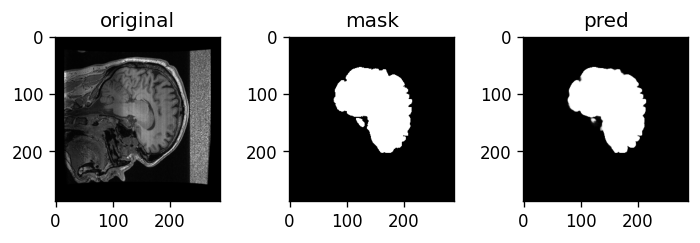

Val: Epoch 16 | Batch: 70 | Combined Loss: 0.029342148452997208 | BCE 0.01064274087548256 | dice_loss 0.01869940757751465
Val: Epoch 16 | Batch: 80 | Combined Loss: 0.028089754283428192 | BCE 0.007446758449077606 | dice_loss 0.020642995834350586
Val: Epoch 16 | Batch: 90 | Combined Loss: 0.026216432452201843 | BCE 0.0073110912926495075 | dice_loss 0.018905341625213623


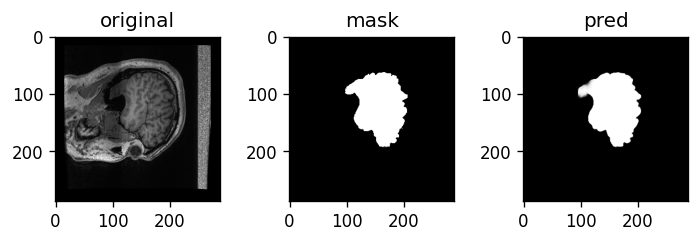

Val: Epoch 16 | Batch: 100 | Combined Loss: 0.026616444811224937 | BCE 0.008760979399085045 | dice_loss 0.017855465412139893
Val: Epoch 16 | Batch: 110 | Combined Loss: 0.02345416694879532 | BCE 0.0061669726856052876 | dice_loss 0.01728719472885132
Val: Epoch 16 | Batch: 120 | Combined Loss: 0.024853434413671494 | BCE 0.005021003074944019 | dice_loss 0.01983243227005005


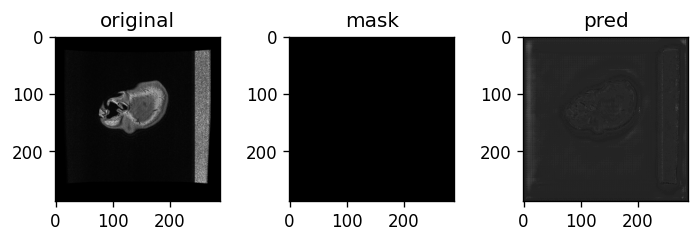

Val: Epoch 16 | Batch: 130 | Combined Loss: 0.026649711653590202 | BCE 0.008173523470759392 | dice_loss 0.01847618818283081
Average val loss for epoch  --> 0.027486388247322153 | BCE: 0.0070252294893617985 | dice_loss: 0.020461158840744585
****************************************************************************************************
Train: Epoch 17 | Batch: 0 | Combined Loss: 0.022843414917588234 | BCE 0.006187135819345713 | dice_loss 0.01665627956390381


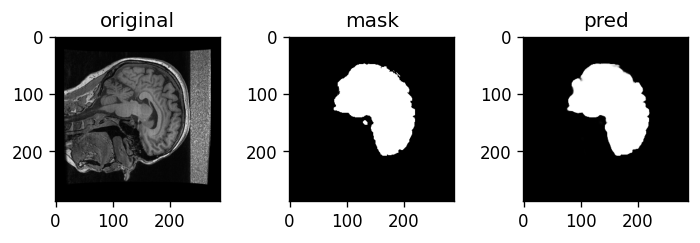

Train: Epoch 17 | Batch: 10 | Combined Loss: 0.04017150029540062 | BCE 0.007631000131368637 | dice_loss 0.03254050016403198
Train: Epoch 17 | Batch: 20 | Combined Loss: 0.029628509655594826 | BCE 0.0057887970469892025 | dice_loss 0.023839712142944336
Train: Epoch 17 | Batch: 30 | Combined Loss: 0.02397800050675869 | BCE 0.007163708563894033 | dice_loss 0.01681429147720337
Train: Epoch 17 | Batch: 40 | Combined Loss: 0.02384468913078308 | BCE 0.0071503217332065105 | dice_loss 0.016694366931915283
Train: Epoch 17 | Batch: 50 | Combined Loss: 0.021505087614059448 | BCE 0.0056199124082922935 | dice_loss 0.01588517427444458
Train: Epoch 17 | Batch: 60 | Combined Loss: 0.03207991272211075 | BCE 0.007436851039528847 | dice_loss 0.02464306354522705
Train: Epoch 17 | Batch: 70 | Combined Loss: 0.03178117424249649 | BCE 0.006091156974434853 | dice_loss 0.025690019130706787
Train: Epoch 17 | Batch: 80 | Combined Loss: 0.02674119547009468 | BCE 0.005489337258040905 | dice_loss 0.0212518572807312
T

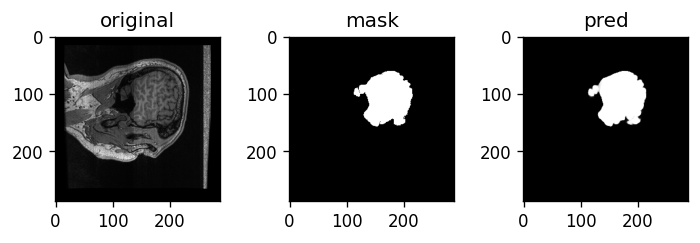

Train: Epoch 17 | Batch: 110 | Combined Loss: 0.026231780648231506 | BCE 0.004796817898750305 | dice_loss 0.0214349627494812
Train: Epoch 17 | Batch: 120 | Combined Loss: 0.024711700156331062 | BCE 0.006058366969227791 | dice_loss 0.01865333318710327
Train: Epoch 17 | Batch: 130 | Combined Loss: 0.027220305055379868 | BCE 0.008657153695821762 | dice_loss 0.018563151359558105
Train: Epoch 17 | Batch: 140 | Combined Loss: 0.03209971636533737 | BCE 0.008146755397319794 | dice_loss 0.023952960968017578
Train: Epoch 17 | Batch: 150 | Combined Loss: 0.0266408734023571 | BCE 0.0056674303486943245 | dice_loss 0.02097344398498535
Train: Epoch 17 | Batch: 160 | Combined Loss: 0.04777754843235016 | BCE 0.007273867726325989 | dice_loss 0.04050368070602417
Train: Epoch 17 | Batch: 170 | Combined Loss: 0.03184584528207779 | BCE 0.005523362196981907 | dice_loss 0.026322484016418457
Train: Epoch 17 | Batch: 180 | Combined Loss: 0.028181154280900955 | BCE 0.007053751964122057 | dice_loss 0.021127402782

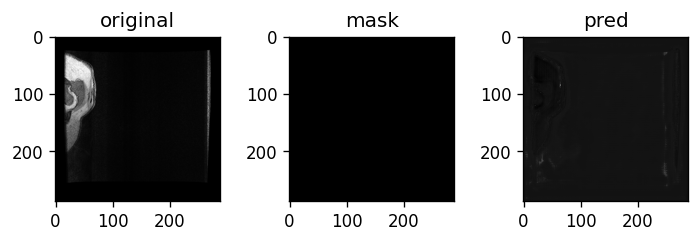

Train: Epoch 17 | Batch: 210 | Combined Loss: 0.026272734627127647 | BCE 0.007279416546225548 | dice_loss 0.0189933180809021
Train: Epoch 17 | Batch: 220 | Combined Loss: 0.02234749123454094 | BCE 0.006062191445380449 | dice_loss 0.016285300254821777
Train: Epoch 17 | Batch: 230 | Combined Loss: 0.027179643511772156 | BCE 0.005602166056632996 | dice_loss 0.02157747745513916
Train: Epoch 17 | Batch: 240 | Combined Loss: 0.028933119028806686 | BCE 0.007066619116812944 | dice_loss 0.02186650037765503
Train: Epoch 17 | Batch: 250 | Combined Loss: 0.03636288270354271 | BCE 0.006096120458096266 | dice_loss 0.030266761779785156
Train: Epoch 17 | Batch: 260 | Combined Loss: 0.03393586724996567 | BCE 0.006937110796570778 | dice_loss 0.02699875831604004
Train: Epoch 17 | Batch: 270 | Combined Loss: 0.02498631924390793 | BCE 0.006976775359362364 | dice_loss 0.018009543418884277
Train: Epoch 17 | Batch: 280 | Combined Loss: 0.033279404044151306 | BCE 0.007105992175638676 | dice_loss 0.026173412799

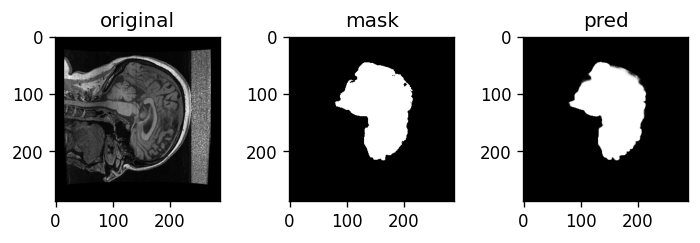

Train: Epoch 17 | Batch: 310 | Combined Loss: 0.02577580139040947 | BCE 0.00660700723528862 | dice_loss 0.01916879415512085
Train: Epoch 17 | Batch: 320 | Combined Loss: 0.031229417771100998 | BCE 0.007314127404242754 | dice_loss 0.02391529083251953
Train: Epoch 17 | Batch: 330 | Combined Loss: 0.019791947677731514 | BCE 0.0058753956109285355 | dice_loss 0.013916552066802979
Train: Epoch 17 | Batch: 340 | Combined Loss: 0.020698998123407364 | BCE 0.006243142299354076 | dice_loss 0.014455854892730713
Train: Epoch 17 | Batch: 350 | Combined Loss: 0.024489637464284897 | BCE 0.00567340524867177 | dice_loss 0.018816232681274414
Train: Epoch 17 | Batch: 360 | Combined Loss: 0.023069290444254875 | BCE 0.006598560139536858 | dice_loss 0.016470730304718018
Train: Epoch 17 | Batch: 370 | Combined Loss: 0.021479513496160507 | BCE 0.00620278250426054 | dice_loss 0.015276730060577393
Train: Epoch 17 | Batch: 380 | Combined Loss: 0.02290325053036213 | BCE 0.006126927677541971 | dice_loss 0.016776323

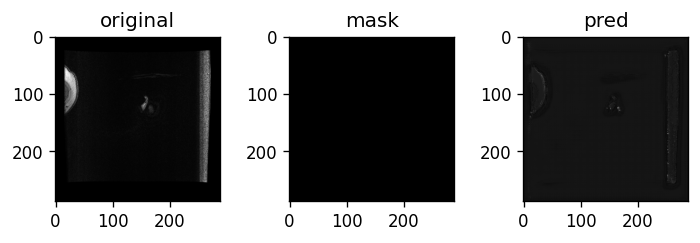

Train: Epoch 17 | Batch: 410 | Combined Loss: 0.030251212418079376 | BCE 0.005681641399860382 | dice_loss 0.024569571018218994
Train: Epoch 17 | Batch: 420 | Combined Loss: 0.026479661464691162 | BCE 0.007701396942138672 | dice_loss 0.01877826452255249
Train: Epoch 17 | Batch: 430 | Combined Loss: 0.03920590132474899 | BCE 0.005166820716112852 | dice_loss 0.034039080142974854
Train: Epoch 17 | Batch: 440 | Combined Loss: 0.03289821371436119 | BCE 0.0070130485109984875 | dice_loss 0.025885164737701416
Train: Epoch 17 | Batch: 450 | Combined Loss: 0.023767538368701935 | BCE 0.006349392235279083 | dice_loss 0.01741814613342285
Train: Epoch 17 | Batch: 460 | Combined Loss: 0.019887741655111313 | BCE 0.006709809880703688 | dice_loss 0.013177931308746338
Train: Epoch 17 | Batch: 470 | Combined Loss: 0.02374228462576866 | BCE 0.005496110301464796 | dice_loss 0.018246173858642578
Train: Epoch 17 | Batch: 480 | Combined Loss: 0.02574913203716278 | BCE 0.005310997366905212 | dice_loss 0.02043813

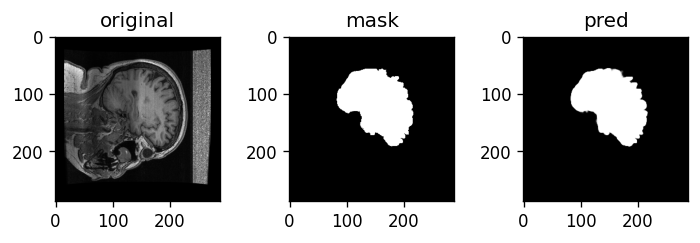

Train: Epoch 17 | Batch: 510 | Combined Loss: 0.029692748561501503 | BCE 0.00680069113150239 | dice_loss 0.0228920578956604
Avg train loss for epoch  --> 0.026892959934921797 | BCE: 0.006634687594026615 | dice_loss: 0.020258272361571263
Val: Epoch 17 | Batch: 0 | Combined Loss: 0.024137292057275772 | BCE 0.006594393867999315 | dice_loss 0.017542898654937744


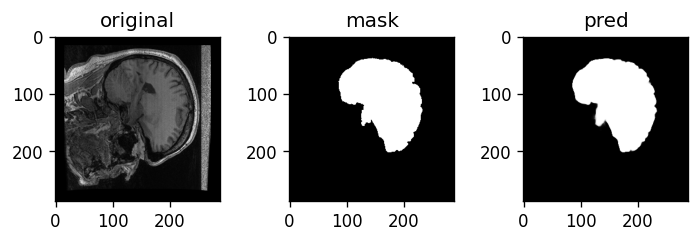

Val: Epoch 17 | Batch: 10 | Combined Loss: 0.02892215922474861 | BCE 0.009794373996555805 | dice_loss 0.01912778615951538
Val: Epoch 17 | Batch: 20 | Combined Loss: 0.024642424657940865 | BCE 0.00705142505466938 | dice_loss 0.017590999603271484
Val: Epoch 17 | Batch: 30 | Combined Loss: 0.02513507753610611 | BCE 0.007454731035977602 | dice_loss 0.017680346965789795


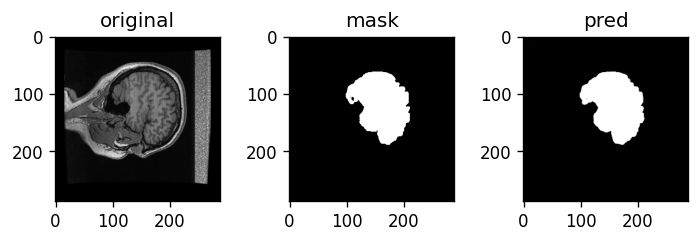

Val: Epoch 17 | Batch: 40 | Combined Loss: 0.02359692007303238 | BCE 0.006272829137742519 | dice_loss 0.017324090003967285
Val: Epoch 17 | Batch: 50 | Combined Loss: 0.025760214775800705 | BCE 0.005586723797023296 | dice_loss 0.020173490047454834
Val: Epoch 17 | Batch: 60 | Combined Loss: 0.026578469201922417 | BCE 0.008118076249957085 | dice_loss 0.018460392951965332


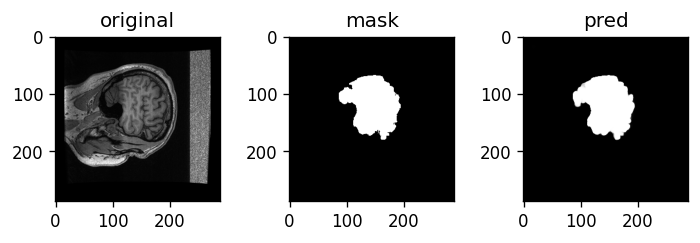

Val: Epoch 17 | Batch: 70 | Combined Loss: 0.02239738404750824 | BCE 0.00606487737968564 | dice_loss 0.016332507133483887
Val: Epoch 17 | Batch: 80 | Combined Loss: 0.024255938827991486 | BCE 0.005682595074176788 | dice_loss 0.018573343753814697
Val: Epoch 17 | Batch: 90 | Combined Loss: 0.022774579003453255 | BCE 0.006994666997343302 | dice_loss 0.01577991247177124


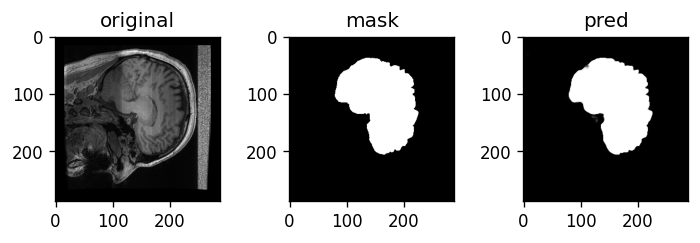

Val: Epoch 17 | Batch: 100 | Combined Loss: 0.02655951678752899 | BCE 0.006983086001127958 | dice_loss 0.019576430320739746
Val: Epoch 17 | Batch: 110 | Combined Loss: 0.0257907472550869 | BCE 0.007515367120504379 | dice_loss 0.01827538013458252
Val: Epoch 17 | Batch: 120 | Combined Loss: 0.026829462498426437 | BCE 0.00729785580188036 | dice_loss 0.019531607627868652


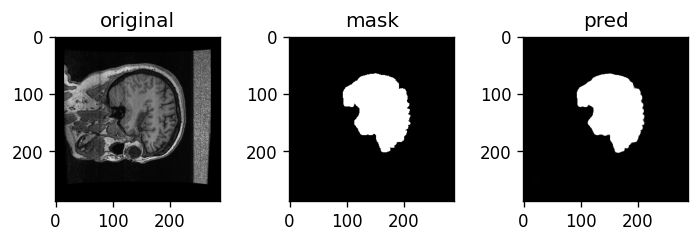

Val: Epoch 17 | Batch: 130 | Combined Loss: 0.02446017786860466 | BCE 0.006257337052375078 | dice_loss 0.01820284128189087
Average val loss for epoch  --> 0.026009103752396723 | BCE: 0.006751950405952003 | dice_loss: 0.01925715340508355
****************************************************************************************************
Train: Epoch 18 | Batch: 0 | Combined Loss: 0.026095308363437653 | BCE 0.0072853947058320045 | dice_loss 0.018809914588928223


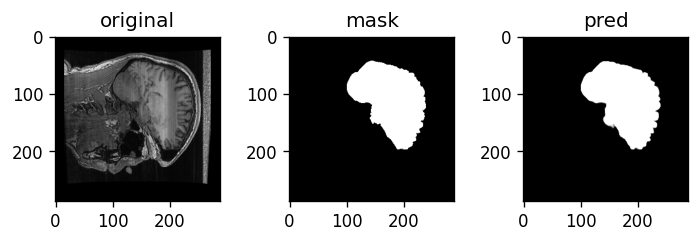

Train: Epoch 18 | Batch: 10 | Combined Loss: 0.022078607231378555 | BCE 0.005711291451007128 | dice_loss 0.016367316246032715
Train: Epoch 18 | Batch: 20 | Combined Loss: 0.023883089423179626 | BCE 0.00601409375667572 | dice_loss 0.017868995666503906
Train: Epoch 18 | Batch: 30 | Combined Loss: 0.024148333817720413 | BCE 0.007659542839974165 | dice_loss 0.01648879051208496
Train: Epoch 18 | Batch: 40 | Combined Loss: 0.025957608595490456 | BCE 0.004769647493958473 | dice_loss 0.021187961101531982
Train: Epoch 18 | Batch: 50 | Combined Loss: 0.024309827014803886 | BCE 0.0074475533328950405 | dice_loss 0.01686227321624756
Train: Epoch 18 | Batch: 60 | Combined Loss: 0.028867797926068306 | BCE 0.0058695245534181595 | dice_loss 0.022998273372650146
Train: Epoch 18 | Batch: 70 | Combined Loss: 0.020578328520059586 | BCE 0.006108825094997883 | dice_loss 0.014469504356384277
Train: Epoch 18 | Batch: 80 | Combined Loss: 0.029202960431575775 | BCE 0.007082723081111908 | dice_loss 0.022120237350

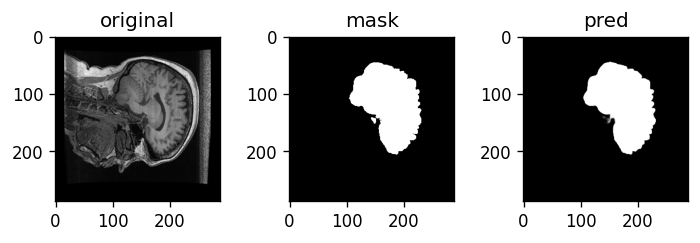

Train: Epoch 18 | Batch: 110 | Combined Loss: 0.01962781511247158 | BCE 0.005099779460579157 | dice_loss 0.014528036117553711
Train: Epoch 18 | Batch: 120 | Combined Loss: 0.019300244748592377 | BCE 0.005027972161769867 | dice_loss 0.01427227258682251
Train: Epoch 18 | Batch: 130 | Combined Loss: 0.02681194245815277 | BCE 0.006812915671616793 | dice_loss 0.019999027252197266
Train: Epoch 18 | Batch: 140 | Combined Loss: 0.031678106635808945 | BCE 0.009941724129021168 | dice_loss 0.02173638343811035
Train: Epoch 18 | Batch: 150 | Combined Loss: 0.03011462837457657 | BCE 0.006304540671408176 | dice_loss 0.023810088634490967
Train: Epoch 18 | Batch: 160 | Combined Loss: 0.023109089583158493 | BCE 0.00599296111613512 | dice_loss 0.017116129398345947
Train: Epoch 18 | Batch: 170 | Combined Loss: 0.02206066995859146 | BCE 0.006127393804490566 | dice_loss 0.01593327522277832
Train: Epoch 18 | Batch: 180 | Combined Loss: 0.02081761509180069 | BCE 0.005369937978684902 | dice_loss 0.015447676181

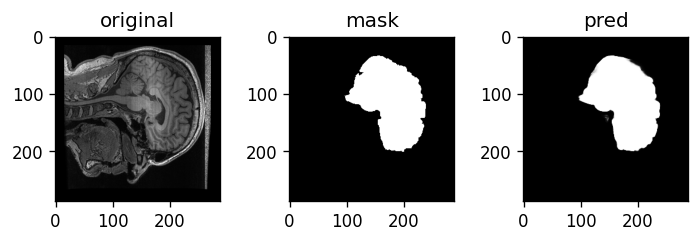

Train: Epoch 18 | Batch: 210 | Combined Loss: 0.037368785589933395 | BCE 0.007802019827067852 | dice_loss 0.02956676483154297
Train: Epoch 18 | Batch: 220 | Combined Loss: 0.021733170375227928 | BCE 0.005929356906563044 | dice_loss 0.015803813934326172
Train: Epoch 18 | Batch: 230 | Combined Loss: 0.019103437662124634 | BCE 0.00509300921112299 | dice_loss 0.014010429382324219
Train: Epoch 18 | Batch: 240 | Combined Loss: 0.026793012395501137 | BCE 0.005823085550218821 | dice_loss 0.020969927310943604
Train: Epoch 18 | Batch: 250 | Combined Loss: 0.021716643124818802 | BCE 0.006861438043415546 | dice_loss 0.01485520601272583
Train: Epoch 18 | Batch: 260 | Combined Loss: 0.027729850262403488 | BCE 0.0066855368204414845 | dice_loss 0.02104431390762329
Train: Epoch 18 | Batch: 270 | Combined Loss: 0.026505302637815475 | BCE 0.005864989478141069 | dice_loss 0.020640313625335693
Train: Epoch 18 | Batch: 280 | Combined Loss: 0.028260648250579834 | BCE 0.005618334747850895 | dice_loss 0.022642

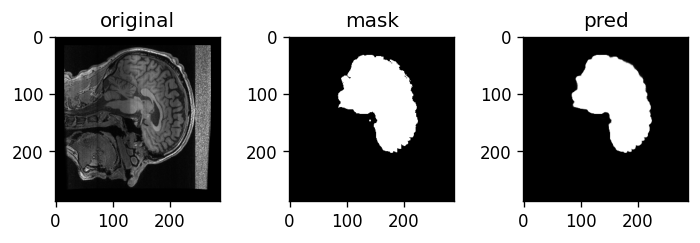

Train: Epoch 18 | Batch: 310 | Combined Loss: 0.025902481749653816 | BCE 0.006728621199727058 | dice_loss 0.019173860549926758
Train: Epoch 18 | Batch: 320 | Combined Loss: 0.021424967795610428 | BCE 0.006927209906280041 | dice_loss 0.014497756958007812
Train: Epoch 18 | Batch: 330 | Combined Loss: 0.03553514927625656 | BCE 0.0066193281672894955 | dice_loss 0.028915822505950928
Train: Epoch 18 | Batch: 340 | Combined Loss: 0.026890868321061134 | BCE 0.005769008304923773 | dice_loss 0.021121859550476074
Train: Epoch 18 | Batch: 350 | Combined Loss: 0.02801443263888359 | BCE 0.009470473974943161 | dice_loss 0.01854395866394043
Train: Epoch 18 | Batch: 360 | Combined Loss: 0.01992982253432274 | BCE 0.0057907672598958015 | dice_loss 0.014139056205749512
Train: Epoch 18 | Batch: 370 | Combined Loss: 0.026126334443688393 | BCE 0.007416675332933664 | dice_loss 0.018709659576416016
Train: Epoch 18 | Batch: 380 | Combined Loss: 0.027787256985902786 | BCE 0.005514014512300491 | dice_loss 0.02227

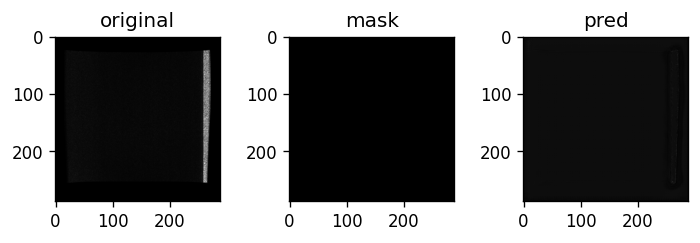

Train: Epoch 18 | Batch: 410 | Combined Loss: 0.026924481615424156 | BCE 0.00663357088342309 | dice_loss 0.020290911197662354
Train: Epoch 18 | Batch: 420 | Combined Loss: 0.020380541682243347 | BCE 0.006003008224070072 | dice_loss 0.01437753438949585
Train: Epoch 18 | Batch: 430 | Combined Loss: 0.019134636968374252 | BCE 0.005742844194173813 | dice_loss 0.01339179277420044
Train: Epoch 18 | Batch: 440 | Combined Loss: 0.026450298726558685 | BCE 0.0071724881418049335 | dice_loss 0.01927781105041504
Train: Epoch 18 | Batch: 450 | Combined Loss: 0.023687541484832764 | BCE 0.00691682193428278 | dice_loss 0.01677072048187256
Train: Epoch 18 | Batch: 460 | Combined Loss: 0.023506062105298042 | BCE 0.0062166620045900345 | dice_loss 0.017289400100708008
Train: Epoch 18 | Batch: 470 | Combined Loss: 0.03010113164782524 | BCE 0.005406866781413555 | dice_loss 0.02469426393508911
Train: Epoch 18 | Batch: 480 | Combined Loss: 0.023346973583102226 | BCE 0.006134701427072287 | dice_loss 0.017212271

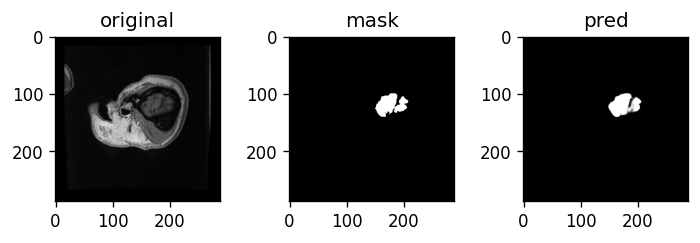

Train: Epoch 18 | Batch: 510 | Combined Loss: 0.025581462308764458 | BCE 0.005755347665399313 | dice_loss 0.019826114177703857
Avg train loss for epoch  --> 0.024866770827085584 | BCE: 0.006337137998470094 | dice_loss: 0.01852963283715561
Val: Epoch 18 | Batch: 0 | Combined Loss: 0.02211364358663559 | BCE 0.006097517907619476 | dice_loss 0.016016125679016113


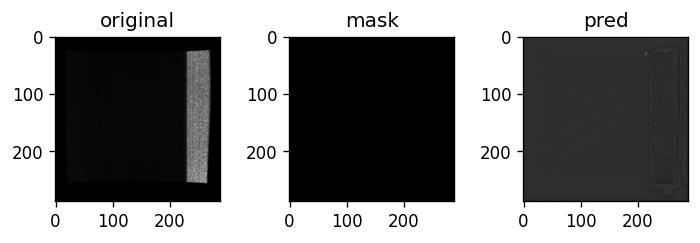

Val: Epoch 18 | Batch: 10 | Combined Loss: 0.02613176219165325 | BCE 0.007958782836794853 | dice_loss 0.0181729793548584
Val: Epoch 18 | Batch: 20 | Combined Loss: 0.022387003526091576 | BCE 0.006987607106566429 | dice_loss 0.015399396419525146
Val: Epoch 18 | Batch: 30 | Combined Loss: 0.02610665000975132 | BCE 0.007159107830375433 | dice_loss 0.0189475417137146


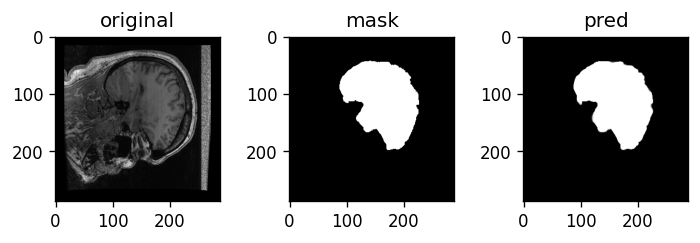

Val: Epoch 18 | Batch: 40 | Combined Loss: 0.03526735678315163 | BCE 0.0048592123202979565 | dice_loss 0.030408143997192383
Val: Epoch 18 | Batch: 50 | Combined Loss: 0.02377479150891304 | BCE 0.006099749356508255 | dice_loss 0.017675042152404785
Val: Epoch 18 | Batch: 60 | Combined Loss: 0.01960333064198494 | BCE 0.004960436373949051 | dice_loss 0.014642894268035889


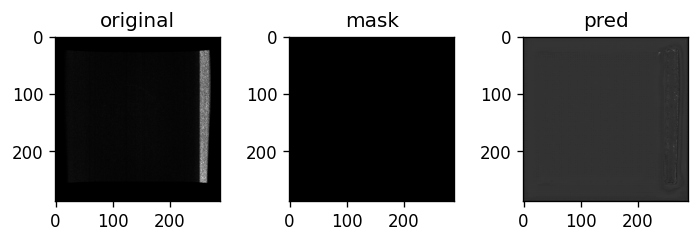

Val: Epoch 18 | Batch: 70 | Combined Loss: 0.02200051210820675 | BCE 0.006429096683859825 | dice_loss 0.015571415424346924
Val: Epoch 18 | Batch: 80 | Combined Loss: 0.02332170680165291 | BCE 0.005978841800242662 | dice_loss 0.017342865467071533
Val: Epoch 18 | Batch: 90 | Combined Loss: 0.02347668632864952 | BCE 0.007088747341185808 | dice_loss 0.016387939453125


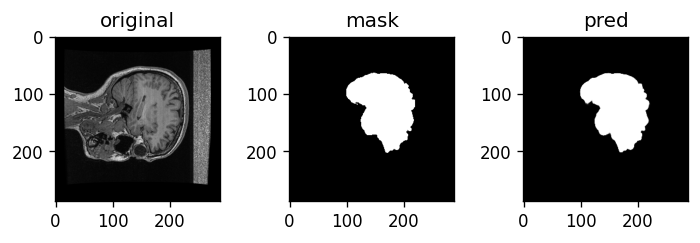

Val: Epoch 18 | Batch: 100 | Combined Loss: 0.026195526123046875 | BCE 0.007063090335577726 | dice_loss 0.01913243532180786
Val: Epoch 18 | Batch: 110 | Combined Loss: 0.029319535940885544 | BCE 0.009201478213071823 | dice_loss 0.02011805772781372
Val: Epoch 18 | Batch: 120 | Combined Loss: 0.031921274960041046 | BCE 0.006624349858611822 | dice_loss 0.025296926498413086


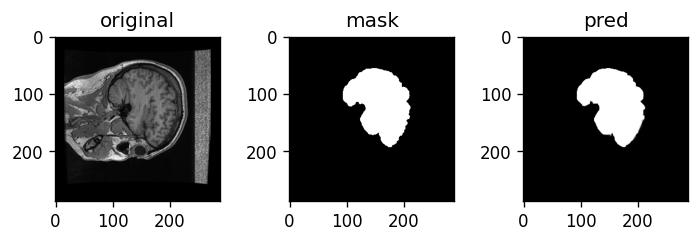

Val: Epoch 18 | Batch: 130 | Combined Loss: 0.022619549185037613 | BCE 0.006004157476127148 | dice_loss 0.01661539077758789
Average val loss for epoch  --> 0.025161558555232152 | BCE: 0.006524766271037084 | dice_loss: 0.01863679223590427
****************************************************************************************************
Train: Epoch 19 | Batch: 0 | Combined Loss: 0.020671682432293892 | BCE 0.005615847185254097 | dice_loss 0.015055835247039795


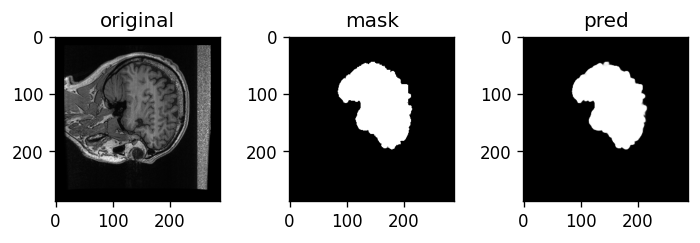

Train: Epoch 19 | Batch: 10 | Combined Loss: 0.022264733910560608 | BCE 0.004592970013618469 | dice_loss 0.01767176389694214
Train: Epoch 19 | Batch: 20 | Combined Loss: 0.02581815980374813 | BCE 0.007041027769446373 | dice_loss 0.018777132034301758
Train: Epoch 19 | Batch: 30 | Combined Loss: 0.021536797285079956 | BCE 0.007623523939400911 | dice_loss 0.013913273811340332
Train: Epoch 19 | Batch: 40 | Combined Loss: 0.02405906282365322 | BCE 0.00732350954785943 | dice_loss 0.016735553741455078
Train: Epoch 19 | Batch: 50 | Combined Loss: 0.022499285638332367 | BCE 0.007289134431630373 | dice_loss 0.015210151672363281
Train: Epoch 19 | Batch: 60 | Combined Loss: 0.04351373389363289 | BCE 0.012003143317997456 | dice_loss 0.03151059150695801
Train: Epoch 19 | Batch: 70 | Combined Loss: 0.05232468247413635 | BCE 0.017736585810780525 | dice_loss 0.03458809852600098
Train: Epoch 19 | Batch: 80 | Combined Loss: 0.028930339962244034 | BCE 0.007967445999383926 | dice_loss 0.020962893962860107


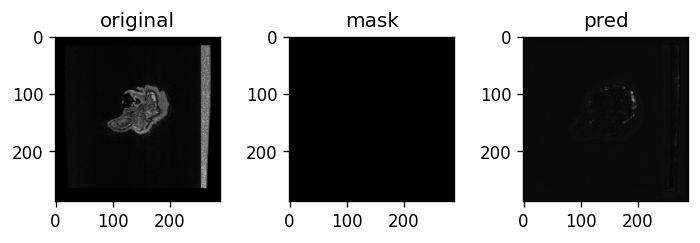

Train: Epoch 19 | Batch: 110 | Combined Loss: 0.03627355024218559 | BCE 0.010584961622953415 | dice_loss 0.025688588619232178
Train: Epoch 19 | Batch: 120 | Combined Loss: 0.02986990660429001 | BCE 0.008160999976098537 | dice_loss 0.021708905696868896
Train: Epoch 19 | Batch: 130 | Combined Loss: 0.026881132274866104 | BCE 0.0068429443053901196 | dice_loss 0.020038187503814697
Train: Epoch 19 | Batch: 140 | Combined Loss: 0.01971583254635334 | BCE 0.005334602668881416 | dice_loss 0.014381229877471924
Train: Epoch 19 | Batch: 150 | Combined Loss: 0.02790936455130577 | BCE 0.008092667907476425 | dice_loss 0.019816696643829346
Train: Epoch 19 | Batch: 160 | Combined Loss: 0.02777511440217495 | BCE 0.007041459437459707 | dice_loss 0.020733654499053955
Train: Epoch 19 | Batch: 170 | Combined Loss: 0.023028548806905746 | BCE 0.006563660688698292 | dice_loss 0.01646488904953003
Train: Epoch 19 | Batch: 180 | Combined Loss: 0.022666938602924347 | BCE 0.00698859291151166 | dice_loss 0.015678346

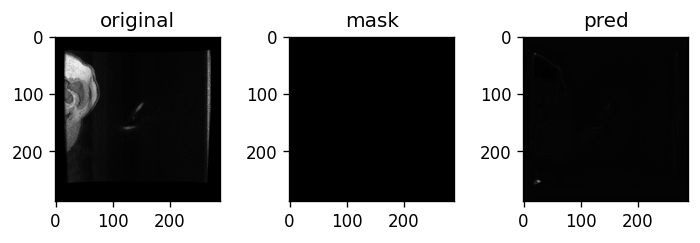

Train: Epoch 19 | Batch: 210 | Combined Loss: 0.019533725455403328 | BCE 0.005387754645198584 | dice_loss 0.014145970344543457
Train: Epoch 19 | Batch: 220 | Combined Loss: 0.019243525341153145 | BCE 0.005137848202139139 | dice_loss 0.014105677604675293
Train: Epoch 19 | Batch: 230 | Combined Loss: 0.025948433205485344 | BCE 0.00791880302131176 | dice_loss 0.018029630184173584
Train: Epoch 19 | Batch: 240 | Combined Loss: 0.021052895113825798 | BCE 0.005571303889155388 | dice_loss 0.01548159122467041
Train: Epoch 19 | Batch: 250 | Combined Loss: 0.024305570870637894 | BCE 0.008348333649337292 | dice_loss 0.015957236289978027
Train: Epoch 19 | Batch: 260 | Combined Loss: 0.021632695570588112 | BCE 0.006250346079468727 | dice_loss 0.015382349491119385
Train: Epoch 19 | Batch: 270 | Combined Loss: 0.03238344192504883 | BCE 0.007562874350696802 | dice_loss 0.024820566177368164
Train: Epoch 19 | Batch: 280 | Combined Loss: 0.024925945326685905 | BCE 0.005829868372529745 | dice_loss 0.019096

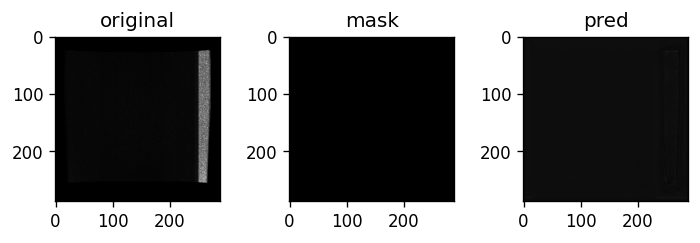

Train: Epoch 19 | Batch: 310 | Combined Loss: 0.021505605429410934 | BCE 0.005951654631644487 | dice_loss 0.015553951263427734
Train: Epoch 19 | Batch: 320 | Combined Loss: 0.023686204105615616 | BCE 0.0050514088943600655 | dice_loss 0.018634796142578125
Train: Epoch 19 | Batch: 330 | Combined Loss: 0.027471069246530533 | BCE 0.008176091127097607 | dice_loss 0.01929497718811035
Train: Epoch 19 | Batch: 340 | Combined Loss: 0.028463365510106087 | BCE 0.0070137991569936275 | dice_loss 0.021449565887451172
Train: Epoch 19 | Batch: 350 | Combined Loss: 0.022374356165528297 | BCE 0.0043548583053052425 | dice_loss 0.018019497394561768
Train: Epoch 19 | Batch: 360 | Combined Loss: 0.023522697389125824 | BCE 0.0071172937750816345 | dice_loss 0.01640540361404419
Train: Epoch 19 | Batch: 370 | Combined Loss: 0.023530980572104454 | BCE 0.006332477554678917 | dice_loss 0.017198503017425537
Train: Epoch 19 | Batch: 380 | Combined Loss: 0.02727343700826168 | BCE 0.005393167957663536 | dice_loss 0.02

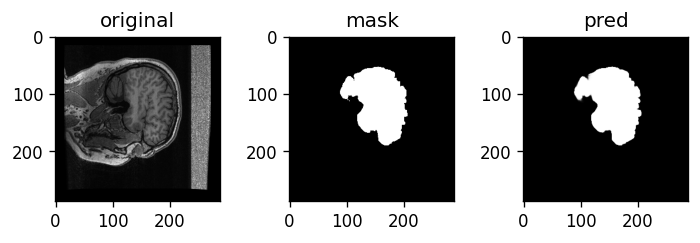

Train: Epoch 19 | Batch: 410 | Combined Loss: 0.0206853486597538 | BCE 0.006339881103485823 | dice_loss 0.01434546709060669
Train: Epoch 19 | Batch: 420 | Combined Loss: 0.019428767263889313 | BCE 0.005732574034482241 | dice_loss 0.01369619369506836
Train: Epoch 19 | Batch: 430 | Combined Loss: 0.019031865522265434 | BCE 0.004568738862872124 | dice_loss 0.01446312665939331
Train: Epoch 19 | Batch: 440 | Combined Loss: 0.023329727351665497 | BCE 0.006345741450786591 | dice_loss 0.016983985900878906
Train: Epoch 19 | Batch: 450 | Combined Loss: 0.0274103581905365 | BCE 0.00799664855003357 | dice_loss 0.01941370964050293
Train: Epoch 19 | Batch: 460 | Combined Loss: 0.02423126995563507 | BCE 0.008901731111109257 | dice_loss 0.015329539775848389
Train: Epoch 19 | Batch: 470 | Combined Loss: 0.025597698986530304 | BCE 0.006150371395051479 | dice_loss 0.01944732666015625
Train: Epoch 19 | Batch: 480 | Combined Loss: 0.017230242490768433 | BCE 0.005342036951333284 | dice_loss 0.01188820600509

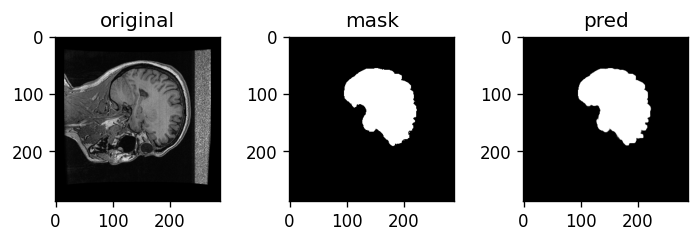

Train: Epoch 19 | Batch: 510 | Combined Loss: 0.029058557003736496 | BCE 0.0065634059719741344 | dice_loss 0.022495150566101074
Avg train loss for epoch  --> 0.025484603743381712 | BCE: 0.006865037431667153 | dice_loss: 0.01861956635036984
Val: Epoch 19 | Batch: 0 | Combined Loss: 0.02192162722349167 | BCE 0.007770530879497528 | dice_loss 0.01415109634399414


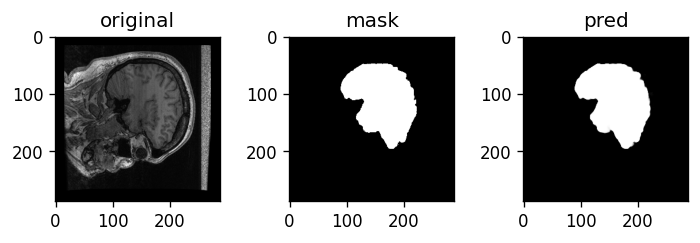

Val: Epoch 19 | Batch: 10 | Combined Loss: 0.02320455200970173 | BCE 0.007319437339901924 | dice_loss 0.015885114669799805
Val: Epoch 19 | Batch: 20 | Combined Loss: 0.018616152927279472 | BCE 0.005748941097408533 | dice_loss 0.012867212295532227
Val: Epoch 19 | Batch: 30 | Combined Loss: 0.02308669127523899 | BCE 0.0070486306212842464 | dice_loss 0.016038060188293457


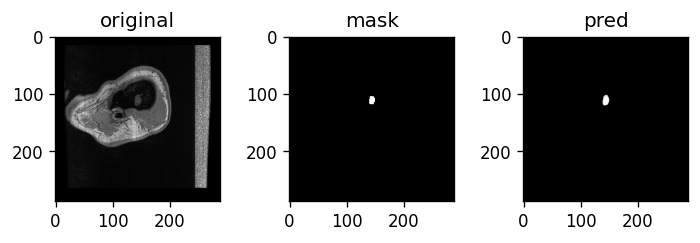

Val: Epoch 19 | Batch: 40 | Combined Loss: 0.0217678714543581 | BCE 0.0033160015009343624 | dice_loss 0.01845186948776245
Val: Epoch 19 | Batch: 50 | Combined Loss: 0.020518869161605835 | BCE 0.005839139688760042 | dice_loss 0.01467972993850708
Val: Epoch 19 | Batch: 60 | Combined Loss: 0.0220513753592968 | BCE 0.007706505246460438 | dice_loss 0.014344871044158936


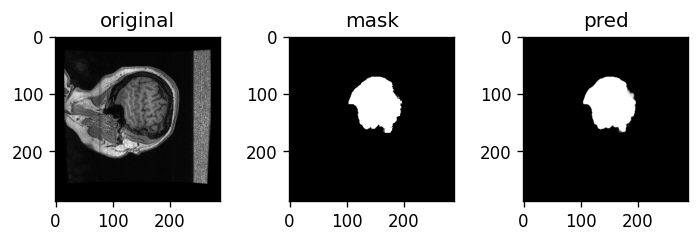

Val: Epoch 19 | Batch: 70 | Combined Loss: 0.02071058750152588 | BCE 0.0068433890119194984 | dice_loss 0.013867199420928955
Val: Epoch 19 | Batch: 80 | Combined Loss: 0.026393376290798187 | BCE 0.008757376112043858 | dice_loss 0.017636001110076904
Val: Epoch 19 | Batch: 90 | Combined Loss: 0.023892786353826523 | BCE 0.007485534530133009 | dice_loss 0.016407251358032227


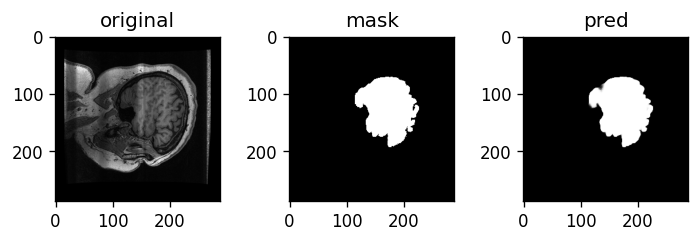

Val: Epoch 19 | Batch: 100 | Combined Loss: 0.02811620756983757 | BCE 0.00884060189127922 | dice_loss 0.01927560567855835
Val: Epoch 19 | Batch: 110 | Combined Loss: 0.020754506811499596 | BCE 0.005240252707153559 | dice_loss 0.015514254570007324
Val: Epoch 19 | Batch: 120 | Combined Loss: 0.02458585426211357 | BCE 0.00843746680766344 | dice_loss 0.016148388385772705


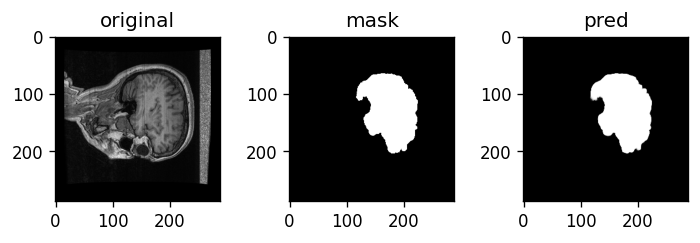

Val: Epoch 19 | Batch: 130 | Combined Loss: 0.0237654447555542 | BCE 0.006703853607177734 | dice_loss 0.017061591148376465
Average val loss for epoch  --> 0.023615380652524807 | BCE: 0.006441659545870843 | dice_loss: 0.01717372117219148
****************************************************************************************************
Train: Epoch 20 | Batch: 0 | Combined Loss: 0.027989564463496208 | BCE 0.006149826105684042 | dice_loss 0.02183973789215088


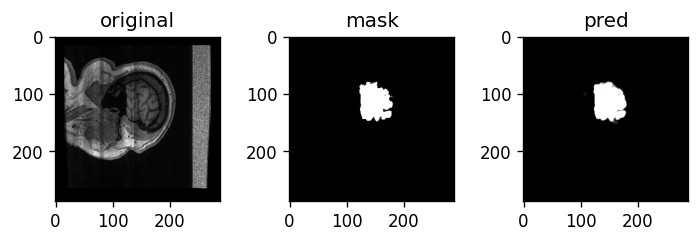

Train: Epoch 20 | Batch: 10 | Combined Loss: 0.021731603890657425 | BCE 0.006343591492623091 | dice_loss 0.015388011932373047
Train: Epoch 20 | Batch: 20 | Combined Loss: 0.021665792912244797 | BCE 0.006829601246863604 | dice_loss 0.01483619213104248
Train: Epoch 20 | Batch: 30 | Combined Loss: 0.017228800803422928 | BCE 0.004668491892516613 | dice_loss 0.01256030797958374
Train: Epoch 20 | Batch: 40 | Combined Loss: 0.030785201117396355 | BCE 0.00621825223788619 | dice_loss 0.024566948413848877
Train: Epoch 20 | Batch: 50 | Combined Loss: 0.02521933615207672 | BCE 0.005745426751673222 | dice_loss 0.019473910331726074
Train: Epoch 20 | Batch: 60 | Combined Loss: 0.022852469235658646 | BCE 0.0065629975870251656 | dice_loss 0.016289472579956055
Train: Epoch 20 | Batch: 70 | Combined Loss: 0.021778861060738564 | BCE 0.0047278194688260555 | dice_loss 0.01705104112625122
Train: Epoch 20 | Batch: 80 | Combined Loss: 0.022311918437480927 | BCE 0.006643764209002256 | dice_loss 0.01566815376281

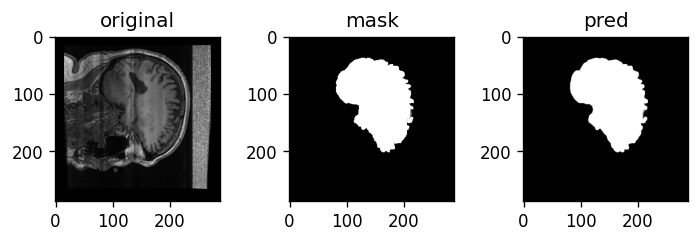

Train: Epoch 20 | Batch: 110 | Combined Loss: 0.020507127046585083 | BCE 0.005470781587064266 | dice_loss 0.015036344528198242
Train: Epoch 20 | Batch: 120 | Combined Loss: 0.020675430074334145 | BCE 0.006125281099230051 | dice_loss 0.01455014944076538
Train: Epoch 20 | Batch: 130 | Combined Loss: 0.01915520802140236 | BCE 0.004328134469687939 | dice_loss 0.014827072620391846
Train: Epoch 20 | Batch: 140 | Combined Loss: 0.019566617906093597 | BCE 0.0049707526341080666 | dice_loss 0.014595866203308105
Train: Epoch 20 | Batch: 150 | Combined Loss: 0.024708133190870285 | BCE 0.005143624264746904 | dice_loss 0.019564509391784668
Train: Epoch 20 | Batch: 160 | Combined Loss: 0.020985018461942673 | BCE 0.006200682837516069 | dice_loss 0.01478433609008789
Train: Epoch 20 | Batch: 170 | Combined Loss: 0.017898833379149437 | BCE 0.004690086469054222 | dice_loss 0.013208746910095215
Train: Epoch 20 | Batch: 180 | Combined Loss: 0.028549514710903168 | BCE 0.007182559929788113 | dice_loss 0.02136

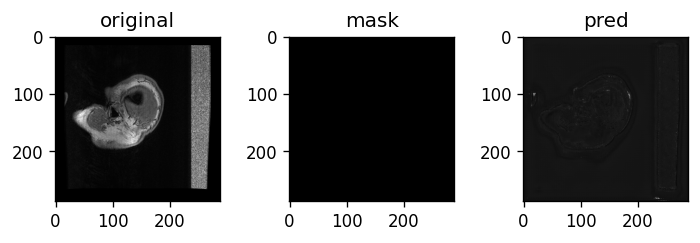

Train: Epoch 20 | Batch: 210 | Combined Loss: 0.028716016560792923 | BCE 0.006022560875862837 | dice_loss 0.0226934552192688
Train: Epoch 20 | Batch: 220 | Combined Loss: 0.020897623151540756 | BCE 0.007769640535116196 | dice_loss 0.01312798261642456
Train: Epoch 20 | Batch: 230 | Combined Loss: 0.022293662652373314 | BCE 0.006712591275572777 | dice_loss 0.015581071376800537
Train: Epoch 20 | Batch: 240 | Combined Loss: 0.02005608379840851 | BCE 0.005160943605005741 | dice_loss 0.014895141124725342
Train: Epoch 20 | Batch: 250 | Combined Loss: 0.0245998315513134 | BCE 0.006629746872931719 | dice_loss 0.01797008514404297
Train: Epoch 20 | Batch: 260 | Combined Loss: 0.020075976848602295 | BCE 0.005956292152404785 | dice_loss 0.01411968469619751
Train: Epoch 20 | Batch: 270 | Combined Loss: 0.028206970542669296 | BCE 0.008745518513023853 | dice_loss 0.019461452960968018
Train: Epoch 20 | Batch: 280 | Combined Loss: 0.022831780835986137 | BCE 0.008093757554888725 | dice_loss 0.01473802328

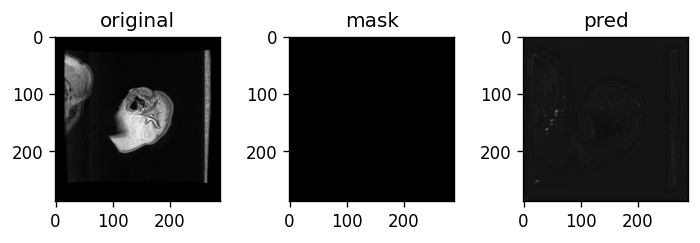

Train: Epoch 20 | Batch: 310 | Combined Loss: 0.02381196990609169 | BCE 0.005773996002972126 | dice_loss 0.01803797483444214
Train: Epoch 20 | Batch: 320 | Combined Loss: 0.02329811081290245 | BCE 0.0075842407532036304 | dice_loss 0.015713870525360107
Train: Epoch 20 | Batch: 330 | Combined Loss: 0.01922006532549858 | BCE 0.005692313890904188 | dice_loss 0.013527750968933105
Train: Epoch 20 | Batch: 340 | Combined Loss: 0.019744714722037315 | BCE 0.005327543709427118 | dice_loss 0.014417171478271484
Train: Epoch 20 | Batch: 350 | Combined Loss: 0.0195951908826828 | BCE 0.005418821237981319 | dice_loss 0.014176368713378906
Train: Epoch 20 | Batch: 360 | Combined Loss: 0.02416238933801651 | BCE 0.0058367615565657616 | dice_loss 0.018325626850128174
Train: Epoch 20 | Batch: 370 | Combined Loss: 0.02430281788110733 | BCE 0.005986965261399746 | dice_loss 0.01831585168838501
Train: Epoch 20 | Batch: 380 | Combined Loss: 0.035359665751457214 | BCE 0.006749613210558891 | dice_loss 0.0286100506

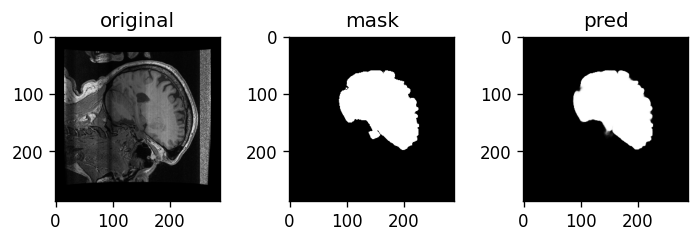

Train: Epoch 20 | Batch: 410 | Combined Loss: 0.025370702147483826 | BCE 0.0067537883296608925 | dice_loss 0.018616914749145508
Train: Epoch 20 | Batch: 420 | Combined Loss: 0.02543989196419716 | BCE 0.00487080542370677 | dice_loss 0.0205690860748291
Train: Epoch 20 | Batch: 430 | Combined Loss: 0.023438092321157455 | BCE 0.005313511472195387 | dice_loss 0.01812458038330078
Train: Epoch 20 | Batch: 440 | Combined Loss: 0.019392672926187515 | BCE 0.005150916986167431 | dice_loss 0.01424175500869751
Train: Epoch 20 | Batch: 450 | Combined Loss: 0.021243272349238396 | BCE 0.006893572863191366 | dice_loss 0.014349699020385742
Train: Epoch 20 | Batch: 460 | Combined Loss: 0.021264128386974335 | BCE 0.006257288157939911 | dice_loss 0.015006840229034424
Train: Epoch 20 | Batch: 470 | Combined Loss: 0.023102527484297752 | BCE 0.0054667056538164616 | dice_loss 0.017635822296142578
Train: Epoch 20 | Batch: 480 | Combined Loss: 0.024544915184378624 | BCE 0.006445249542593956 | dice_loss 0.0180996

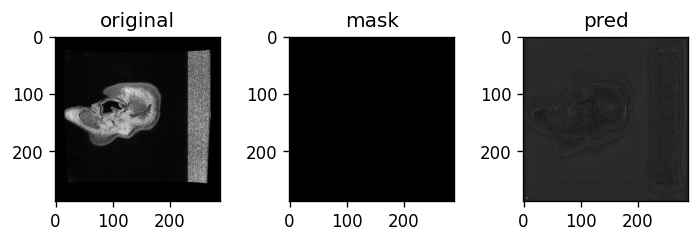

Train: Epoch 20 | Batch: 510 | Combined Loss: 0.02223357930779457 | BCE 0.005067263729870319 | dice_loss 0.017166316509246826
Avg train loss for epoch  --> 0.02237903601831566 | BCE: 0.005968795210558158 | dice_loss: 0.01641024079562154
Val: Epoch 20 | Batch: 0 | Combined Loss: 0.021401988342404366 | BCE 0.007257687393575907 | dice_loss 0.014144301414489746


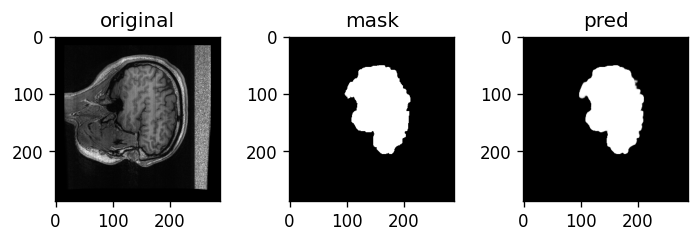

Val: Epoch 20 | Batch: 10 | Combined Loss: 0.01605605147778988 | BCE 0.004421522840857506 | dice_loss 0.011634528636932373
Val: Epoch 20 | Batch: 20 | Combined Loss: 0.017989592626690865 | BCE 0.005187408998608589 | dice_loss 0.012802183628082275
Val: Epoch 20 | Batch: 30 | Combined Loss: 0.01982738822698593 | BCE 0.005539619363844395 | dice_loss 0.014287769794464111


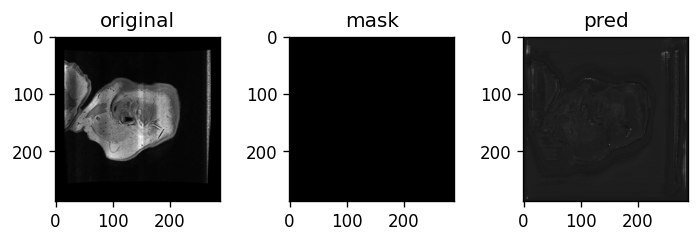

Val: Epoch 20 | Batch: 40 | Combined Loss: 0.022851917892694473 | BCE 0.006770941894501448 | dice_loss 0.01608097553253174
Val: Epoch 20 | Batch: 50 | Combined Loss: 0.02043827995657921 | BCE 0.005707110743969679 | dice_loss 0.014731168746948242
Val: Epoch 20 | Batch: 60 | Combined Loss: 0.01991487294435501 | BCE 0.005205996800214052 | dice_loss 0.014708876609802246


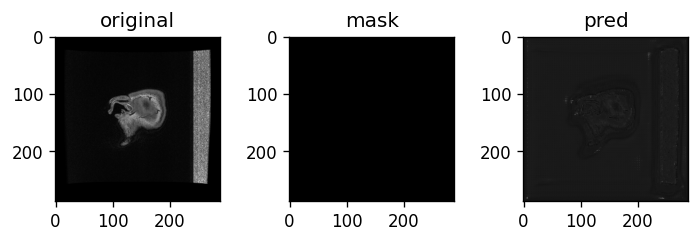

Val: Epoch 20 | Batch: 70 | Combined Loss: 0.02021125890314579 | BCE 0.007400075439363718 | dice_loss 0.01281118392944336
Val: Epoch 20 | Batch: 80 | Combined Loss: 0.028794385492801666 | BCE 0.007173755206167698 | dice_loss 0.021620631217956543
Val: Epoch 20 | Batch: 90 | Combined Loss: 0.020342327654361725 | BCE 0.006549276877194643 | dice_loss 0.01379305124282837


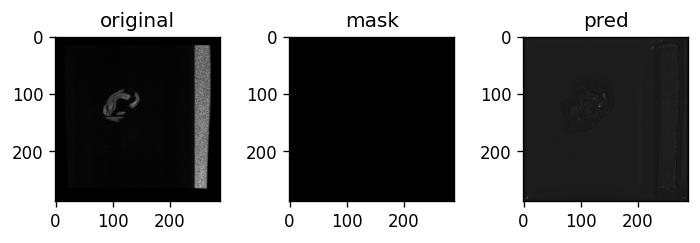

Val: Epoch 20 | Batch: 100 | Combined Loss: 0.021360795944929123 | BCE 0.007581215817481279 | dice_loss 0.01377958059310913
Val: Epoch 20 | Batch: 110 | Combined Loss: 0.022561892867088318 | BCE 0.006000385154038668 | dice_loss 0.016561508178710938
Val: Epoch 20 | Batch: 120 | Combined Loss: 0.019075710326433182 | BCE 0.005705076269805431 | dice_loss 0.013370633125305176


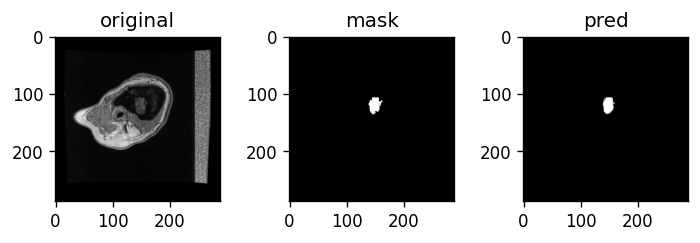

Val: Epoch 20 | Batch: 130 | Combined Loss: 0.02238369919359684 | BCE 0.006250032689422369 | dice_loss 0.016133666038513184
Average val loss for epoch  --> 0.022216094975118283 | BCE: 0.006278682384570991 | dice_loss: 0.015937412668157507
****************************************************************************************************
Train: Epoch 21 | Batch: 0 | Combined Loss: 0.02108517289161682 | BCE 0.005466431844979525 | dice_loss 0.015618741512298584


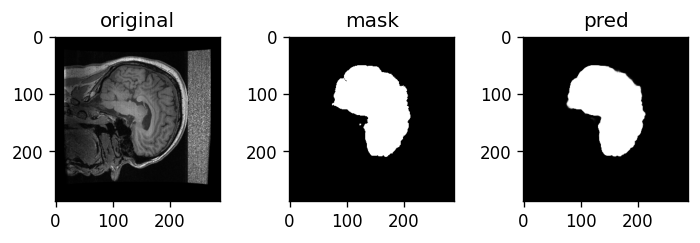

Train: Epoch 21 | Batch: 10 | Combined Loss: 0.019059691578149796 | BCE 0.004293535370379686 | dice_loss 0.014766156673431396
Train: Epoch 21 | Batch: 20 | Combined Loss: 0.02347726933658123 | BCE 0.0063527957536280155 | dice_loss 0.017124474048614502
Train: Epoch 21 | Batch: 30 | Combined Loss: 0.021170664578676224 | BCE 0.00533490302041173 | dice_loss 0.01583576202392578
Train: Epoch 21 | Batch: 40 | Combined Loss: 0.019948657602071762 | BCE 0.004149432759732008 | dice_loss 0.015799224376678467
Train: Epoch 21 | Batch: 50 | Combined Loss: 0.018389970064163208 | BCE 0.005179018713533878 | dice_loss 0.013210952281951904
Train: Epoch 21 | Batch: 60 | Combined Loss: 0.022490166127681732 | BCE 0.007809720002114773 | dice_loss 0.014680445194244385
Train: Epoch 21 | Batch: 70 | Combined Loss: 0.02520490065217018 | BCE 0.005081596784293652 | dice_loss 0.020123302936553955
Train: Epoch 21 | Batch: 80 | Combined Loss: 0.021940993145108223 | BCE 0.0065638297237455845 | dice_loss 0.0153771638870

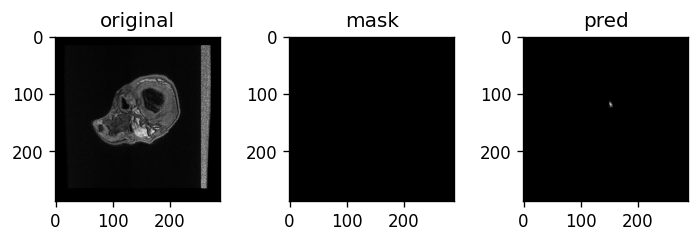

Train: Epoch 21 | Batch: 110 | Combined Loss: 0.01882895827293396 | BCE 0.0056205084547400475 | dice_loss 0.013208448886871338
Train: Epoch 21 | Batch: 120 | Combined Loss: 0.019749630242586136 | BCE 0.006071079056710005 | dice_loss 0.013678550720214844
Train: Epoch 21 | Batch: 130 | Combined Loss: 0.020908253267407417 | BCE 0.006119446363300085 | dice_loss 0.014788806438446045
Train: Epoch 21 | Batch: 140 | Combined Loss: 0.022441405802965164 | BCE 0.006653387099504471 | dice_loss 0.015788018703460693
Train: Epoch 21 | Batch: 150 | Combined Loss: 0.021490339189767838 | BCE 0.005656902678310871 | dice_loss 0.01583343744277954
Train: Epoch 21 | Batch: 160 | Combined Loss: 0.020151540637016296 | BCE 0.005474552046507597 | dice_loss 0.014676988124847412
Train: Epoch 21 | Batch: 170 | Combined Loss: 0.020509354770183563 | BCE 0.005932144820690155 | dice_loss 0.014577209949493408
Train: Epoch 21 | Batch: 180 | Combined Loss: 0.019355274736881256 | BCE 0.004484095145016909 | dice_loss 0.0148

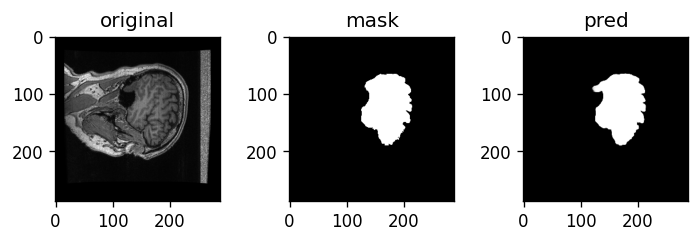

Train: Epoch 21 | Batch: 210 | Combined Loss: 0.023944785818457603 | BCE 0.004129698034375906 | dice_loss 0.01981508731842041
Train: Epoch 21 | Batch: 220 | Combined Loss: 0.026369810104370117 | BCE 0.006382047664374113 | dice_loss 0.019987761974334717
Train: Epoch 21 | Batch: 230 | Combined Loss: 0.02091778814792633 | BCE 0.007411733735352755 | dice_loss 0.013506054878234863
Train: Epoch 21 | Batch: 240 | Combined Loss: 0.01897771656513214 | BCE 0.0034914170391857624 | dice_loss 0.015486299991607666
Train: Epoch 21 | Batch: 250 | Combined Loss: 0.019008878618478775 | BCE 0.004749181680381298 | dice_loss 0.014259696006774902
Train: Epoch 21 | Batch: 260 | Combined Loss: 0.023682979866862297 | BCE 0.0050246394239366055 | dice_loss 0.018658339977264404
Train: Epoch 21 | Batch: 270 | Combined Loss: 0.02157627046108246 | BCE 0.005907997488975525 | dice_loss 0.015668272972106934
Train: Epoch 21 | Batch: 280 | Combined Loss: 0.020499570295214653 | BCE 0.006441278383135796 | dice_loss 0.01405

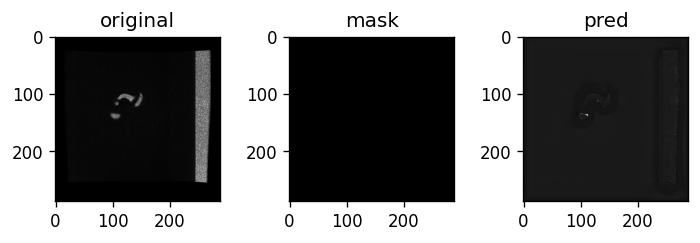

Train: Epoch 21 | Batch: 310 | Combined Loss: 0.020205633714795113 | BCE 0.006805436220020056 | dice_loss 0.01340019702911377
Train: Epoch 21 | Batch: 320 | Combined Loss: 0.021065188571810722 | BCE 0.005845440085977316 | dice_loss 0.01521974802017212
Train: Epoch 21 | Batch: 330 | Combined Loss: 0.024851664900779724 | BCE 0.005720242857933044 | dice_loss 0.01913142204284668
Train: Epoch 21 | Batch: 340 | Combined Loss: 0.017240231856703758 | BCE 0.005042916629463434 | dice_loss 0.012197315692901611
Train: Epoch 21 | Batch: 350 | Combined Loss: 0.019467143341898918 | BCE 0.006559340283274651 | dice_loss 0.012907803058624268
Train: Epoch 21 | Batch: 360 | Combined Loss: 0.017528817057609558 | BCE 0.005164369009435177 | dice_loss 0.012364447116851807
Train: Epoch 21 | Batch: 370 | Combined Loss: 0.019851023331284523 | BCE 0.0065264650620520115 | dice_loss 0.013324558734893799
Train: Epoch 21 | Batch: 380 | Combined Loss: 0.018313394859433174 | BCE 0.0059378608129918575 | dice_loss 0.0123

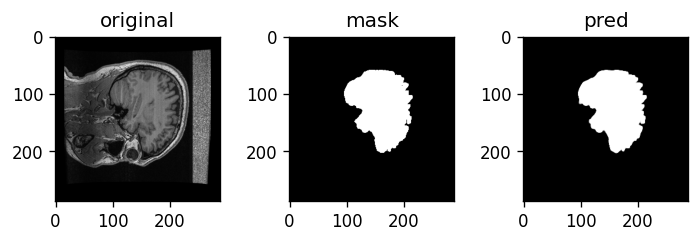

Train: Epoch 21 | Batch: 410 | Combined Loss: 0.019123494625091553 | BCE 0.005502998363226652 | dice_loss 0.013620495796203613
Train: Epoch 21 | Batch: 420 | Combined Loss: 0.025203080847859383 | BCE 0.0073231179267168045 | dice_loss 0.017879962921142578
Train: Epoch 21 | Batch: 430 | Combined Loss: 0.017121408134698868 | BCE 0.004657898563891649 | dice_loss 0.012463510036468506
Train: Epoch 21 | Batch: 440 | Combined Loss: 0.022390149533748627 | BCE 0.0027392723131924868 | dice_loss 0.01965087652206421
Train: Epoch 21 | Batch: 450 | Combined Loss: 0.022864697501063347 | BCE 0.006183681543916464 | dice_loss 0.016681015491485596
Train: Epoch 21 | Batch: 460 | Combined Loss: 0.022243065759539604 | BCE 0.0044745043851435184 | dice_loss 0.017768561840057373
Train: Epoch 21 | Batch: 470 | Combined Loss: 0.027871690690517426 | BCE 0.005660198163241148 | dice_loss 0.02221149206161499
Train: Epoch 21 | Batch: 480 | Combined Loss: 0.02001778781414032 | BCE 0.005904659628868103 | dice_loss 0.014

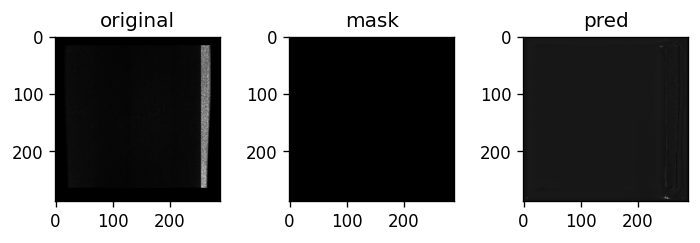

Train: Epoch 21 | Batch: 510 | Combined Loss: 0.017392756417393684 | BCE 0.005155088845640421 | dice_loss 0.01223766803741455
Avg train loss for epoch  --> 0.021300325019134057 | BCE: 0.0058061300433496135 | dice_loss: 0.015494194960502123
Val: Epoch 21 | Batch: 0 | Combined Loss: 0.021577414125204086 | BCE 0.00548368226736784 | dice_loss 0.016093730926513672


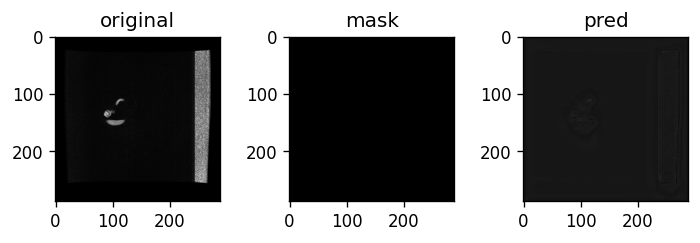

Val: Epoch 21 | Batch: 10 | Combined Loss: 0.022956492379307747 | BCE 0.007297159638255835 | dice_loss 0.015659332275390625
Val: Epoch 21 | Batch: 20 | Combined Loss: 0.028008146211504936 | BCE 0.006048364564776421 | dice_loss 0.021959781646728516
Val: Epoch 21 | Batch: 30 | Combined Loss: 0.01940707117319107 | BCE 0.004825033713132143 | dice_loss 0.014582037925720215


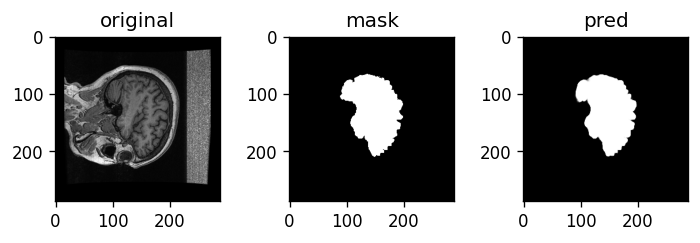

Val: Epoch 21 | Batch: 40 | Combined Loss: 0.02475142665207386 | BCE 0.005067349877208471 | dice_loss 0.0196840763092041
Val: Epoch 21 | Batch: 50 | Combined Loss: 0.019460365176200867 | BCE 0.0052069867961108685 | dice_loss 0.014253377914428711
Val: Epoch 21 | Batch: 60 | Combined Loss: 0.02123822644352913 | BCE 0.0065362644381821156 | dice_loss 0.0147019624710083


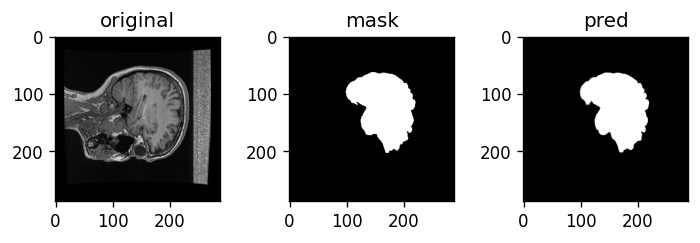

Val: Epoch 21 | Batch: 70 | Combined Loss: 0.018456239253282547 | BCE 0.005174119491130114 | dice_loss 0.01328212022781372
Val: Epoch 21 | Batch: 80 | Combined Loss: 0.023688890039920807 | BCE 0.00720641715452075 | dice_loss 0.01648247241973877
Val: Epoch 21 | Batch: 90 | Combined Loss: 0.018957307562232018 | BCE 0.006314804777503014 | dice_loss 0.012642502784729004


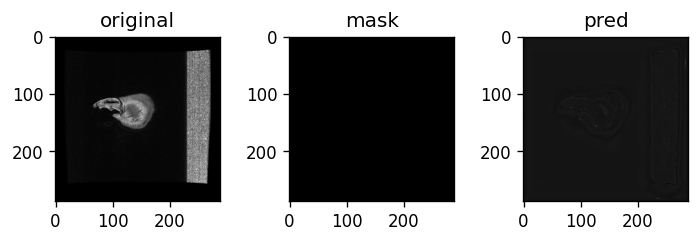

Val: Epoch 21 | Batch: 100 | Combined Loss: 0.020406393334269524 | BCE 0.006894794758409262 | dice_loss 0.013511598110198975
Val: Epoch 21 | Batch: 110 | Combined Loss: 0.02199014276266098 | BCE 0.004904888104647398 | dice_loss 0.017085254192352295
Val: Epoch 21 | Batch: 120 | Combined Loss: 0.02313045784831047 | BCE 0.0048531112261116505 | dice_loss 0.018277347087860107


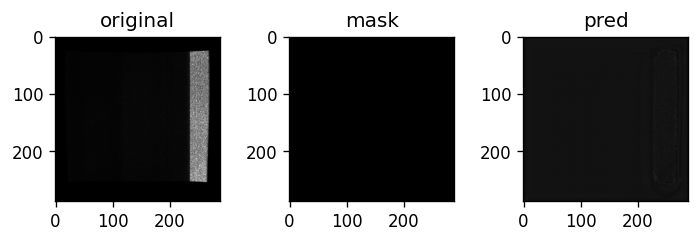

Val: Epoch 21 | Batch: 130 | Combined Loss: 0.026028521358966827 | BCE 0.009562677703797817 | dice_loss 0.016465842723846436
Average val loss for epoch  --> 0.0221455300019847 | BCE: 0.006249598615492384 | dice_loss: 0.015895931367520932
****************************************************************************************************
Train: Epoch 22 | Batch: 0 | Combined Loss: 0.018598103895783424 | BCE 0.004780793562531471 | dice_loss 0.013817310333251953


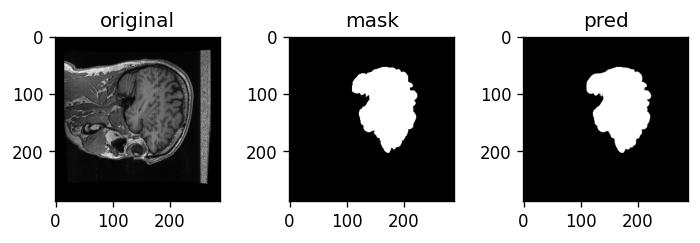

Train: Epoch 22 | Batch: 10 | Combined Loss: 0.01968367025256157 | BCE 0.0051578981801867485 | dice_loss 0.014525771141052246
Train: Epoch 22 | Batch: 20 | Combined Loss: 0.016677696257829666 | BCE 0.0052194176241755486 | dice_loss 0.011458277702331543
Train: Epoch 22 | Batch: 30 | Combined Loss: 0.0249699167907238 | BCE 0.0042596859857439995 | dice_loss 0.020710229873657227
Train: Epoch 22 | Batch: 40 | Combined Loss: 0.020589925348758698 | BCE 0.006803608499467373 | dice_loss 0.01378631591796875
Train: Epoch 22 | Batch: 50 | Combined Loss: 0.021826647222042084 | BCE 0.006217919755727053 | dice_loss 0.015608727931976318
Train: Epoch 22 | Batch: 60 | Combined Loss: 0.017447147518396378 | BCE 0.004777523688971996 | dice_loss 0.012669622898101807
Train: Epoch 22 | Batch: 70 | Combined Loss: 0.01860513538122177 | BCE 0.0051359753124415874 | dice_loss 0.013469159603118896
Train: Epoch 22 | Batch: 80 | Combined Loss: 0.019600147381424904 | BCE 0.005113774444907904 | dice_loss 0.014486372470

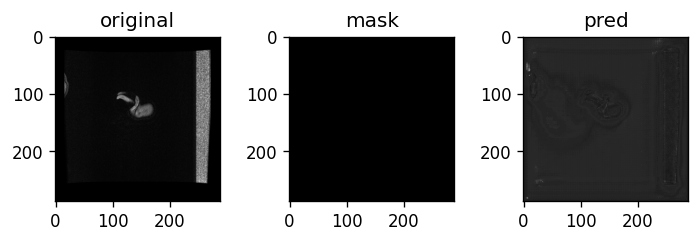

Train: Epoch 22 | Batch: 110 | Combined Loss: 0.015095610171556473 | BCE 0.0032853668089956045 | dice_loss 0.011810243129730225
Train: Epoch 22 | Batch: 120 | Combined Loss: 0.019760267809033394 | BCE 0.0046855974942445755 | dice_loss 0.015074670314788818
Train: Epoch 22 | Batch: 130 | Combined Loss: 0.01821564882993698 | BCE 0.004761270713061094 | dice_loss 0.0134543776512146
Train: Epoch 22 | Batch: 140 | Combined Loss: 0.02228868380188942 | BCE 0.006662073545157909 | dice_loss 0.015626609325408936
Train: Epoch 22 | Batch: 150 | Combined Loss: 0.021267490461468697 | BCE 0.004604177549481392 | dice_loss 0.016663312911987305
Train: Epoch 22 | Batch: 160 | Combined Loss: 0.017315134406089783 | BCE 0.005446896888315678 | dice_loss 0.01186823844909668
Train: Epoch 22 | Batch: 170 | Combined Loss: 0.01800358109176159 | BCE 0.004842816386371851 | dice_loss 0.013160765171051025
Train: Epoch 22 | Batch: 180 | Combined Loss: 0.016451694071292877 | BCE 0.004422820173203945 | dice_loss 0.0120288

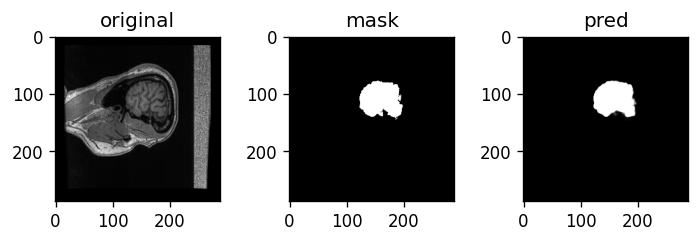

Train: Epoch 22 | Batch: 210 | Combined Loss: 0.022484445944428444 | BCE 0.005241657141596079 | dice_loss 0.017242789268493652
Train: Epoch 22 | Batch: 220 | Combined Loss: 0.020929714664816856 | BCE 0.006111284717917442 | dice_loss 0.014818429946899414
Train: Epoch 22 | Batch: 230 | Combined Loss: 0.020975299179553986 | BCE 0.0076067522168159485 | dice_loss 0.013368546962738037
Train: Epoch 22 | Batch: 240 | Combined Loss: 0.015009294264018536 | BCE 0.0038318736478686333 | dice_loss 0.011177420616149902
Train: Epoch 22 | Batch: 250 | Combined Loss: 0.023759081959724426 | BCE 0.004894450772553682 | dice_loss 0.01886463165283203
Train: Epoch 22 | Batch: 260 | Combined Loss: 0.02156566083431244 | BCE 0.006894276477396488 | dice_loss 0.014671385288238525
Train: Epoch 22 | Batch: 270 | Combined Loss: 0.01883001998066902 | BCE 0.005858678370714188 | dice_loss 0.012971341609954834
Train: Epoch 22 | Batch: 280 | Combined Loss: 0.025985566899180412 | BCE 0.0069594657979905605 | dice_loss 0.019

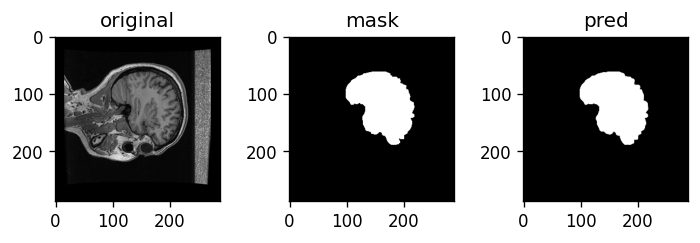

Train: Epoch 22 | Batch: 310 | Combined Loss: 0.020683927461504936 | BCE 0.0070620011538267136 | dice_loss 0.013621926307678223
Train: Epoch 22 | Batch: 320 | Combined Loss: 0.015930604189634323 | BCE 0.004567038267850876 | dice_loss 0.011363565921783447
Train: Epoch 22 | Batch: 330 | Combined Loss: 0.016902659088373184 | BCE 0.003988001961261034 | dice_loss 0.012914657592773438
Train: Epoch 22 | Batch: 340 | Combined Loss: 0.027612492442131042 | BCE 0.007097885478287935 | dice_loss 0.020514607429504395
Train: Epoch 22 | Batch: 350 | Combined Loss: 0.0231354720890522 | BCE 0.008003700524568558 | dice_loss 0.015131771564483643
Train: Epoch 22 | Batch: 360 | Combined Loss: 0.0225902758538723 | BCE 0.007001516409218311 | dice_loss 0.015588760375976562
Train: Epoch 22 | Batch: 370 | Combined Loss: 0.020876146852970123 | BCE 0.006310977973043919 | dice_loss 0.01456516981124878
Train: Epoch 22 | Batch: 380 | Combined Loss: 0.033854637295007706 | BCE 0.006638620514422655 | dice_loss 0.0272160

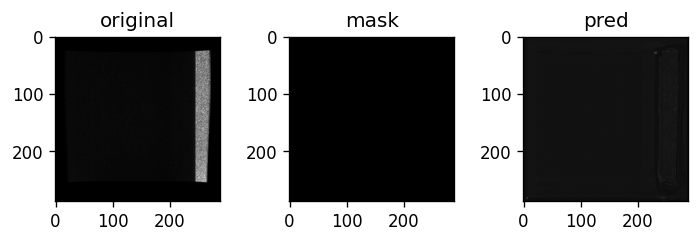

Train: Epoch 22 | Batch: 410 | Combined Loss: 0.022419869899749756 | BCE 0.00675052497535944 | dice_loss 0.01566934585571289
Train: Epoch 22 | Batch: 420 | Combined Loss: 0.02237865887582302 | BCE 0.004644310101866722 | dice_loss 0.0177343487739563
Train: Epoch 22 | Batch: 430 | Combined Loss: 0.019661834463477135 | BCE 0.00543808052316308 | dice_loss 0.014223754405975342
Train: Epoch 22 | Batch: 440 | Combined Loss: 0.02114006318151951 | BCE 0.006287241354584694 | dice_loss 0.014852821826934814
Train: Epoch 22 | Batch: 450 | Combined Loss: 0.01967063918709755 | BCE 0.005504225380718708 | dice_loss 0.014166414737701416
Train: Epoch 22 | Batch: 460 | Combined Loss: 0.018689006567001343 | BCE 0.0045101940631866455 | dice_loss 0.014178812503814697
Train: Epoch 22 | Batch: 470 | Combined Loss: 0.019316760823130608 | BCE 0.006122914608567953 | dice_loss 0.013193845748901367
Train: Epoch 22 | Batch: 480 | Combined Loss: 0.022361986339092255 | BCE 0.0070503875613212585 | dice_loss 0.015311598

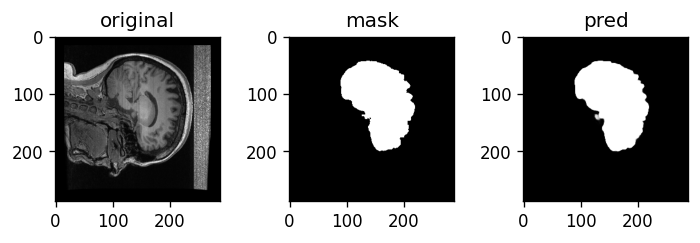

Train: Epoch 22 | Batch: 510 | Combined Loss: 0.018372878432273865 | BCE 0.0047584036365151405 | dice_loss 0.013614475727081299
Avg train loss for epoch  --> 0.020409430414941664 | BCE: 0.005592367467092904 | dice_loss: 0.014817062952343562
Val: Epoch 22 | Batch: 0 | Combined Loss: 0.018376771360635757 | BCE 0.004765096120536327 | dice_loss 0.013611674308776855


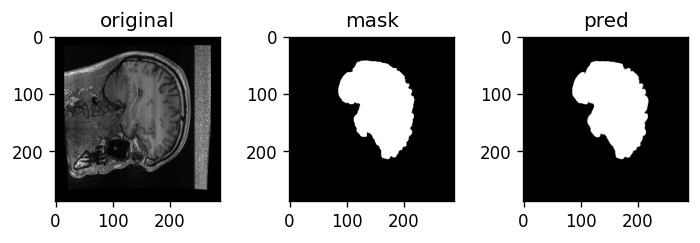

Val: Epoch 22 | Batch: 10 | Combined Loss: 0.019795622676610947 | BCE 0.0068902624770998955 | dice_loss 0.012905359268188477
Val: Epoch 22 | Batch: 20 | Combined Loss: 0.019251786172389984 | BCE 0.005944334901869297 | dice_loss 0.013307452201843262
Val: Epoch 22 | Batch: 30 | Combined Loss: 0.021349521353840828 | BCE 0.004735919181257486 | dice_loss 0.01661360263824463


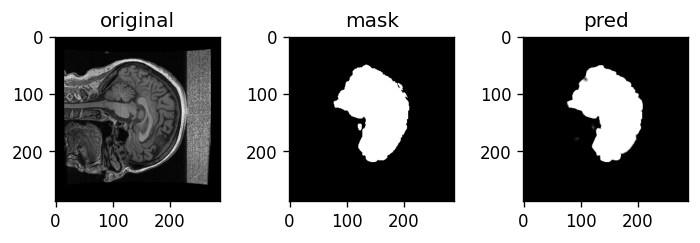

Val: Epoch 22 | Batch: 40 | Combined Loss: 0.016102317720651627 | BCE 0.005115632899105549 | dice_loss 0.010986685752868652
Val: Epoch 22 | Batch: 50 | Combined Loss: 0.020234907045960426 | BCE 0.006363892462104559 | dice_loss 0.01387101411819458
Val: Epoch 22 | Batch: 60 | Combined Loss: 0.018022451549768448 | BCE 0.004721912555396557 | dice_loss 0.013300538063049316


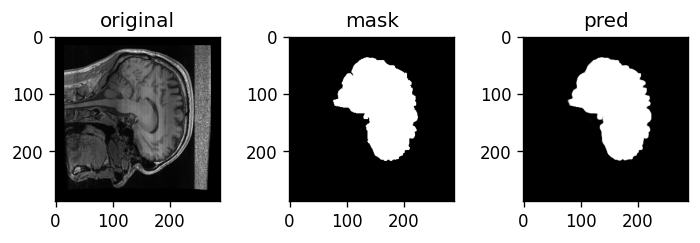

Val: Epoch 22 | Batch: 70 | Combined Loss: 0.022791322320699692 | BCE 0.00885283574461937 | dice_loss 0.013938486576080322
Val: Epoch 22 | Batch: 80 | Combined Loss: 0.023898404091596603 | BCE 0.005916518159210682 | dice_loss 0.017981886863708496
Val: Epoch 22 | Batch: 90 | Combined Loss: 0.020523440092802048 | BCE 0.005478036589920521 | dice_loss 0.015045404434204102


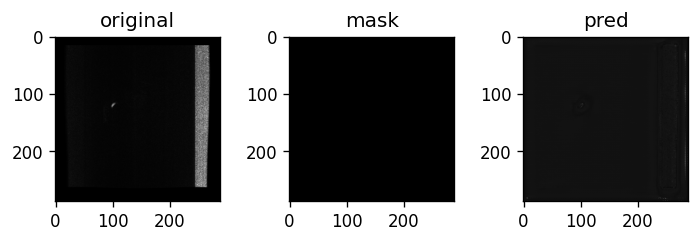

Val: Epoch 22 | Batch: 100 | Combined Loss: 0.01885194517672062 | BCE 0.004902133252471685 | dice_loss 0.013949811458587646
Val: Epoch 22 | Batch: 110 | Combined Loss: 0.025058813393115997 | BCE 0.006181425414979458 | dice_loss 0.018877387046813965
Val: Epoch 22 | Batch: 120 | Combined Loss: 0.018130704760551453 | BCE 0.005245967768132687 | dice_loss 0.012884736061096191


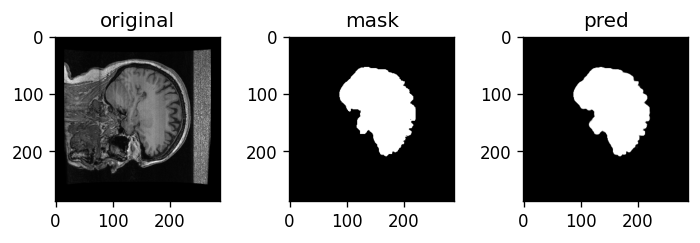

Val: Epoch 22 | Batch: 130 | Combined Loss: 0.021852614358067513 | BCE 0.006992699112743139 | dice_loss 0.014859914779663086
Average val loss for epoch  --> 0.02138131013898938 | BCE: 0.00624129765804995 | dice_loss: 0.0151400124585187
****************************************************************************************************
Train: Epoch 23 | Batch: 0 | Combined Loss: 0.021291978657245636 | BCE 0.0053924983367323875 | dice_loss 0.015899479389190674


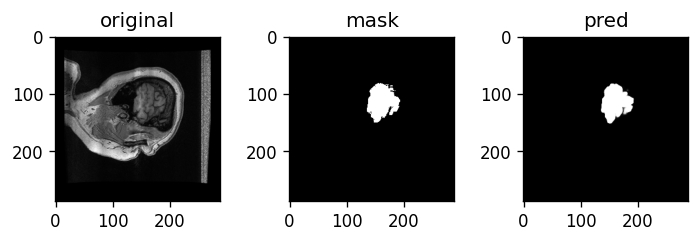

Train: Epoch 23 | Batch: 10 | Combined Loss: 0.020310020074248314 | BCE 0.005672668572515249 | dice_loss 0.014637351036071777
Train: Epoch 23 | Batch: 20 | Combined Loss: 0.01960396021604538 | BCE 0.006009511183947325 | dice_loss 0.013594448566436768
Train: Epoch 23 | Batch: 30 | Combined Loss: 0.017914386466145515 | BCE 0.003940971568226814 | dice_loss 0.013973414897918701
Train: Epoch 23 | Batch: 40 | Combined Loss: 0.017993561923503876 | BCE 0.005651942919939756 | dice_loss 0.012341618537902832
Train: Epoch 23 | Batch: 50 | Combined Loss: 0.018640898168087006 | BCE 0.006299399305135012 | dice_loss 0.012341499328613281
Train: Epoch 23 | Batch: 60 | Combined Loss: 0.01987592503428459 | BCE 0.006266276817768812 | dice_loss 0.013609647750854492
Train: Epoch 23 | Batch: 70 | Combined Loss: 0.01930561661720276 | BCE 0.006056636106222868 | dice_loss 0.013248980045318604
Train: Epoch 23 | Batch: 80 | Combined Loss: 0.020847760140895844 | BCE 0.005200647283345461 | dice_loss 0.01564711332321

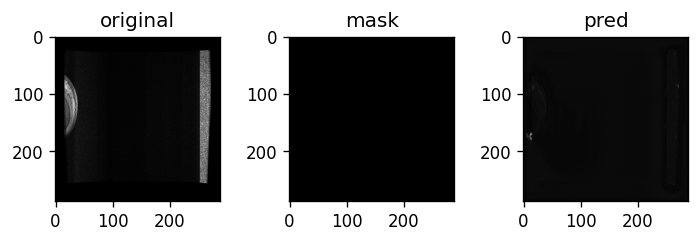

Train: Epoch 23 | Batch: 110 | Combined Loss: 0.019532861188054085 | BCE 0.006864490453153849 | dice_loss 0.012668371200561523
Train: Epoch 23 | Batch: 120 | Combined Loss: 0.020315369591116905 | BCE 0.005877813324332237 | dice_loss 0.014437556266784668
Train: Epoch 23 | Batch: 130 | Combined Loss: 0.018362894654273987 | BCE 0.004599347710609436 | dice_loss 0.01376354694366455
Train: Epoch 23 | Batch: 140 | Combined Loss: 0.017627518624067307 | BCE 0.004896203987300396 | dice_loss 0.012731313705444336
Train: Epoch 23 | Batch: 150 | Combined Loss: 0.024828126654028893 | BCE 0.006346395704895258 | dice_loss 0.018481731414794922
Train: Epoch 23 | Batch: 160 | Combined Loss: 0.02276826649904251 | BCE 0.004767543636262417 | dice_loss 0.01800072193145752
Train: Epoch 23 | Batch: 170 | Combined Loss: 0.01895773783326149 | BCE 0.004395846743136644 | dice_loss 0.014561891555786133
Train: Epoch 23 | Batch: 180 | Combined Loss: 0.024121414870023727 | BCE 0.006227206904441118 | dice_loss 0.0178942

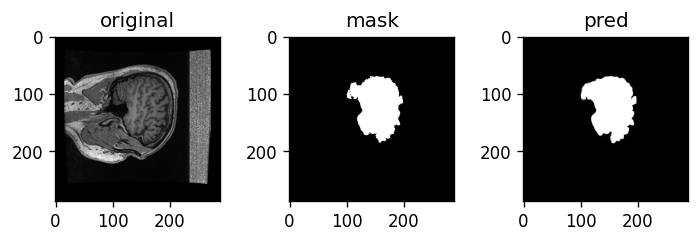

Train: Epoch 23 | Batch: 210 | Combined Loss: 0.018401656299829483 | BCE 0.004852148704230785 | dice_loss 0.013549506664276123
Train: Epoch 23 | Batch: 220 | Combined Loss: 0.02515408582985401 | BCE 0.0057823373936116695 | dice_loss 0.019371747970581055
Train: Epoch 23 | Batch: 230 | Combined Loss: 0.0163904819637537 | BCE 0.005570390727370977 | dice_loss 0.010820090770721436
Train: Epoch 23 | Batch: 240 | Combined Loss: 0.02079138159751892 | BCE 0.006260066758841276 | dice_loss 0.014531314373016357
Train: Epoch 23 | Batch: 250 | Combined Loss: 0.01616433449089527 | BCE 0.005399974528700113 | dice_loss 0.010764360427856445
Train: Epoch 23 | Batch: 260 | Combined Loss: 0.016346750780940056 | BCE 0.00546359783038497 | dice_loss 0.010883152484893799
Train: Epoch 23 | Batch: 270 | Combined Loss: 0.018642088398337364 | BCE 0.005323967430740595 | dice_loss 0.013318121433258057
Train: Epoch 23 | Batch: 280 | Combined Loss: 0.015129871666431427 | BCE 0.004631408024579287 | dice_loss 0.01049846

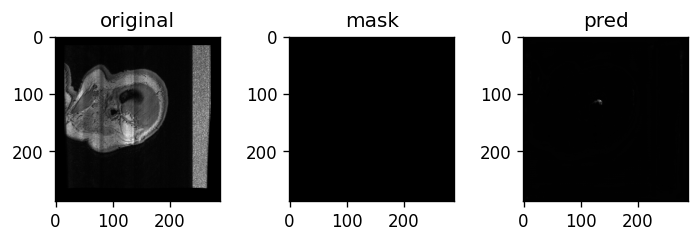

Train: Epoch 23 | Batch: 310 | Combined Loss: 0.017624326050281525 | BCE 0.0045067742466926575 | dice_loss 0.013117551803588867
Train: Epoch 23 | Batch: 320 | Combined Loss: 0.03605373203754425 | BCE 0.0033488424960523844 | dice_loss 0.03270488977432251
Train: Epoch 23 | Batch: 330 | Combined Loss: 0.016366969794034958 | BCE 0.004088710993528366 | dice_loss 0.012278258800506592
Train: Epoch 23 | Batch: 340 | Combined Loss: 0.02036730945110321 | BCE 0.005709156859666109 | dice_loss 0.014658153057098389
Train: Epoch 23 | Batch: 350 | Combined Loss: 0.021913951262831688 | BCE 0.006465202663093805 | dice_loss 0.01544874906539917
Train: Epoch 23 | Batch: 360 | Combined Loss: 0.023177620023489 | BCE 0.008155045099556446 | dice_loss 0.015022575855255127
Train: Epoch 23 | Batch: 370 | Combined Loss: 0.017419172450900078 | BCE 0.0044947401620447636 | dice_loss 0.012924432754516602
Train: Epoch 23 | Batch: 380 | Combined Loss: 0.020229728892445564 | BCE 0.006810160353779793 | dice_loss 0.0134195

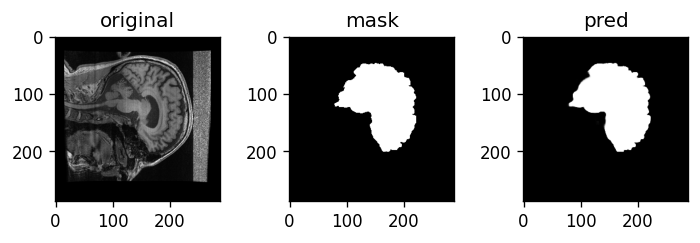

Train: Epoch 23 | Batch: 410 | Combined Loss: 0.019084662199020386 | BCE 0.007019430864602327 | dice_loss 0.012065231800079346
Train: Epoch 23 | Batch: 420 | Combined Loss: 0.01533685252070427 | BCE 0.00409279391169548 | dice_loss 0.011244058609008789
Train: Epoch 23 | Batch: 430 | Combined Loss: 0.018948987126350403 | BCE 0.005057170055806637 | dice_loss 0.013891816139221191
Train: Epoch 23 | Batch: 440 | Combined Loss: 0.01859108731150627 | BCE 0.005231481045484543 | dice_loss 0.013359606266021729
Train: Epoch 23 | Batch: 450 | Combined Loss: 0.018152548000216484 | BCE 0.005501403007656336 | dice_loss 0.012651145458221436
Train: Epoch 23 | Batch: 460 | Combined Loss: 0.02377592772245407 | BCE 0.006435386836528778 | dice_loss 0.017340540885925293
Train: Epoch 23 | Batch: 470 | Combined Loss: 0.015608587302267551 | BCE 0.003333904780447483 | dice_loss 0.012274682521820068
Train: Epoch 23 | Batch: 480 | Combined Loss: 0.019477128982543945 | BCE 0.005690037272870541 | dice_loss 0.0137870

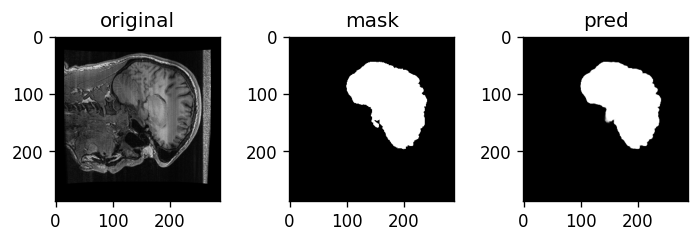

Train: Epoch 23 | Batch: 510 | Combined Loss: 0.020930709317326546 | BCE 0.005854429677128792 | dice_loss 0.015076279640197754
Avg train loss for epoch  --> 0.019619260715054616 | BCE: 0.005504336596455813 | dice_loss: 0.014114924149163441
Val: Epoch 23 | Batch: 0 | Combined Loss: 0.020101165398955345 | BCE 0.005577182397246361 | dice_loss 0.014523983001708984


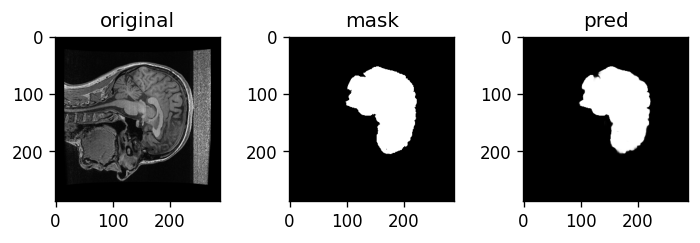

Val: Epoch 23 | Batch: 10 | Combined Loss: 0.021437086164951324 | BCE 0.007100201211869717 | dice_loss 0.014336884021759033
Val: Epoch 23 | Batch: 20 | Combined Loss: 0.018836848437786102 | BCE 0.005123727954924107 | dice_loss 0.01371312141418457
Val: Epoch 23 | Batch: 30 | Combined Loss: 0.01712028868496418 | BCE 0.0054707396775484085 | dice_loss 0.011649549007415771


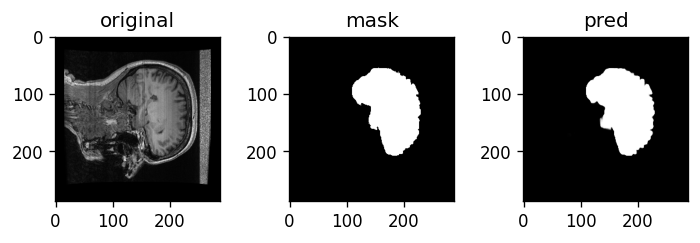

Val: Epoch 23 | Batch: 40 | Combined Loss: 0.018848201259970665 | BCE 0.007701417431235313 | dice_loss 0.011146783828735352
Val: Epoch 23 | Batch: 50 | Combined Loss: 0.020611584186553955 | BCE 0.005858481861650944 | dice_loss 0.014753103256225586
Val: Epoch 23 | Batch: 60 | Combined Loss: 0.01797439530491829 | BCE 0.005290407687425613 | dice_loss 0.012683987617492676


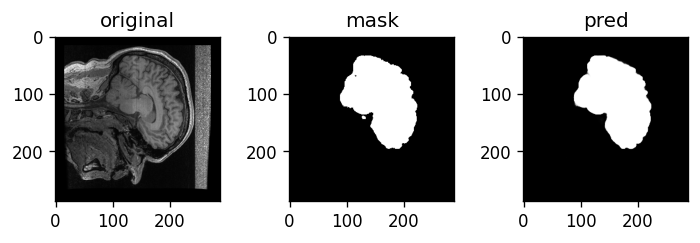

Val: Epoch 23 | Batch: 70 | Combined Loss: 0.01823456585407257 | BCE 0.005304828751832247 | dice_loss 0.012929737567901611
Val: Epoch 23 | Batch: 80 | Combined Loss: 0.03301636874675751 | BCE 0.01283477246761322 | dice_loss 0.020181596279144287
Val: Epoch 23 | Batch: 90 | Combined Loss: 0.030439794063568115 | BCE 0.0033589599188417196 | dice_loss 0.027080833911895752


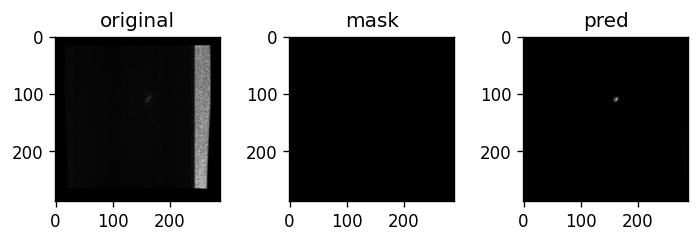

Val: Epoch 23 | Batch: 100 | Combined Loss: 0.019005579873919487 | BCE 0.005570335313677788 | dice_loss 0.0134352445602417
Val: Epoch 23 | Batch: 110 | Combined Loss: 0.01982833445072174 | BCE 0.007247998379170895 | dice_loss 0.012580335140228271
Val: Epoch 23 | Batch: 120 | Combined Loss: 0.01805577240884304 | BCE 0.003876244882121682 | dice_loss 0.014179527759552002


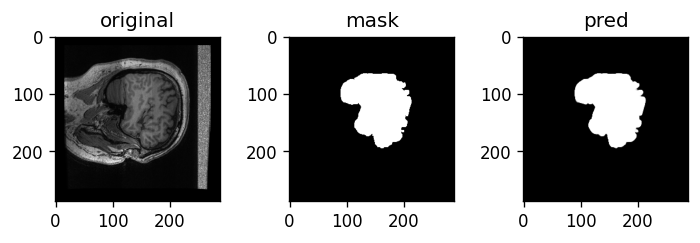

Val: Epoch 23 | Batch: 130 | Combined Loss: 0.023590922355651855 | BCE 0.006060183979570866 | dice_loss 0.017530739307403564
Average val loss for epoch  --> 0.02045383133959991 | BCE: 0.006121756331305261 | dice_loss: 0.014332075030715378
****************************************************************************************************
Train: Epoch 24 | Batch: 0 | Combined Loss: 0.022651996463537216 | BCE 0.005800630431622267 | dice_loss 0.016851365566253662


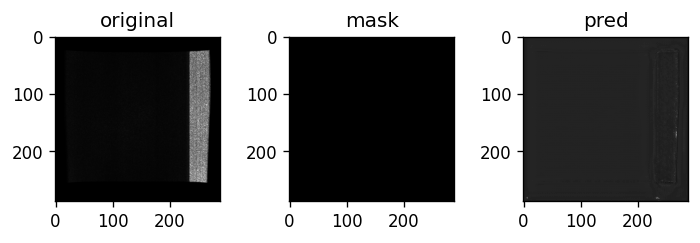

Train: Epoch 24 | Batch: 10 | Combined Loss: 0.020582200959324837 | BCE 0.007508757058531046 | dice_loss 0.013073444366455078
Train: Epoch 24 | Batch: 20 | Combined Loss: 0.017293088138103485 | BCE 0.00499074999243021 | dice_loss 0.01230233907699585
Train: Epoch 24 | Batch: 30 | Combined Loss: 0.017390243709087372 | BCE 0.005951575934886932 | dice_loss 0.01143866777420044
Train: Epoch 24 | Batch: 40 | Combined Loss: 0.02591518871486187 | BCE 0.004973693285137415 | dice_loss 0.020941495895385742
Train: Epoch 24 | Batch: 50 | Combined Loss: 0.015158368274569511 | BCE 0.004592550452798605 | dice_loss 0.01056581735610962
Train: Epoch 24 | Batch: 60 | Combined Loss: 0.018230557441711426 | BCE 0.005609273444861174 | dice_loss 0.012621283531188965
Train: Epoch 24 | Batch: 70 | Combined Loss: 0.020297344774007797 | BCE 0.005934115033596754 | dice_loss 0.014363229274749756
Train: Epoch 24 | Batch: 80 | Combined Loss: 0.023948144167661667 | BCE 0.0083129508420825 | dice_loss 0.015635192394256592

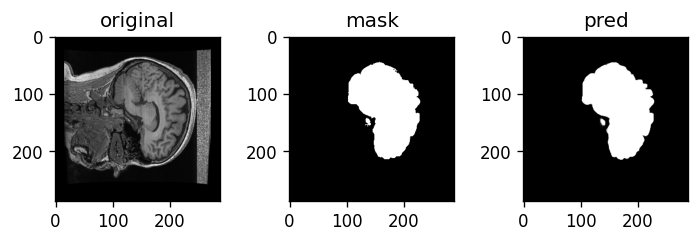

Train: Epoch 24 | Batch: 110 | Combined Loss: 0.018031422048807144 | BCE 0.004668836481869221 | dice_loss 0.013362586498260498
Train: Epoch 24 | Batch: 120 | Combined Loss: 0.023777076974511147 | BCE 0.008497962728142738 | dice_loss 0.015279114246368408
Train: Epoch 24 | Batch: 130 | Combined Loss: 0.017792794853448868 | BCE 0.003962550777941942 | dice_loss 0.013830244541168213
Train: Epoch 24 | Batch: 140 | Combined Loss: 0.018633056432008743 | BCE 0.005545367486774921 | dice_loss 0.013087689876556396
Train: Epoch 24 | Batch: 150 | Combined Loss: 0.02321043610572815 | BCE 0.0065607731230556965 | dice_loss 0.01664966344833374
Train: Epoch 24 | Batch: 160 | Combined Loss: 0.016305608674883842 | BCE 0.0048767756670713425 | dice_loss 0.0114288330078125
Train: Epoch 24 | Batch: 170 | Combined Loss: 0.017453039065003395 | BCE 0.003684723749756813 | dice_loss 0.013768315315246582
Train: Epoch 24 | Batch: 180 | Combined Loss: 0.019994178786873817 | BCE 0.00604532053694129 | dice_loss 0.013948

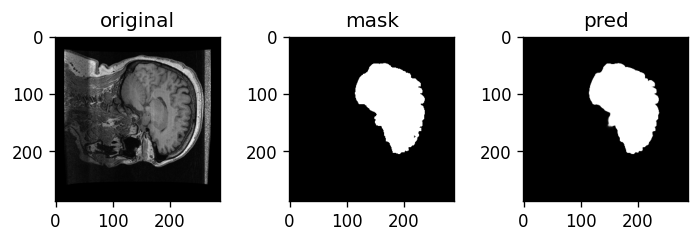

Train: Epoch 24 | Batch: 210 | Combined Loss: 0.019903216511011124 | BCE 0.007285925559699535 | dice_loss 0.012617290019989014
Train: Epoch 24 | Batch: 220 | Combined Loss: 0.01714702695608139 | BCE 0.005326590500771999 | dice_loss 0.011820435523986816
Train: Epoch 24 | Batch: 230 | Combined Loss: 0.0173653457313776 | BCE 0.004144439939409494 | dice_loss 0.013220906257629395
Train: Epoch 24 | Batch: 240 | Combined Loss: 0.015572765842080116 | BCE 0.004612783435732126 | dice_loss 0.010959982872009277
Train: Epoch 24 | Batch: 250 | Combined Loss: 0.016735289245843887 | BCE 0.004588696639984846 | dice_loss 0.012146592140197754
Train: Epoch 24 | Batch: 260 | Combined Loss: 0.01815068908035755 | BCE 0.005974593106657267 | dice_loss 0.012176096439361572
Train: Epoch 24 | Batch: 270 | Combined Loss: 0.01613418012857437 | BCE 0.00373176415450871 | dice_loss 0.01240241527557373
Train: Epoch 24 | Batch: 280 | Combined Loss: 0.016484037041664124 | BCE 0.004017428029328585 | dice_loss 0.0124666094

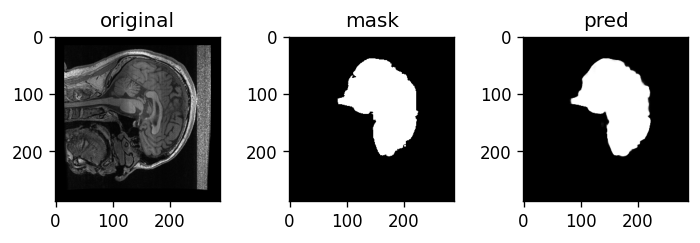

Train: Epoch 24 | Batch: 310 | Combined Loss: 0.018295036628842354 | BCE 0.004998670890927315 | dice_loss 0.013296365737915039
Train: Epoch 24 | Batch: 320 | Combined Loss: 0.016057953238487244 | BCE 0.004606352187693119 | dice_loss 0.0114516019821167
Train: Epoch 24 | Batch: 330 | Combined Loss: 0.016334330663084984 | BCE 0.004869615193456411 | dice_loss 0.011464715003967285
Train: Epoch 24 | Batch: 340 | Combined Loss: 0.01929556392133236 | BCE 0.006013980135321617 | dice_loss 0.013281583786010742
Train: Epoch 24 | Batch: 350 | Combined Loss: 0.01546054519712925 | BCE 0.003867561463266611 | dice_loss 0.011592984199523926
Train: Epoch 24 | Batch: 360 | Combined Loss: 0.02024620771408081 | BCE 0.00572121050208807 | dice_loss 0.014524996280670166
Train: Epoch 24 | Batch: 370 | Combined Loss: 0.02082826755940914 | BCE 0.004988511558622122 | dice_loss 0.015839755535125732
Train: Epoch 24 | Batch: 380 | Combined Loss: 0.018864944577217102 | BCE 0.006906107533723116 | dice_loss 0.0119588375

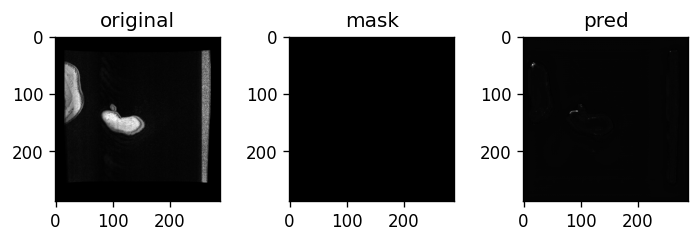

Train: Epoch 24 | Batch: 410 | Combined Loss: 0.019592521712183952 | BCE 0.005517719313502312 | dice_loss 0.01407480239868164
Train: Epoch 24 | Batch: 420 | Combined Loss: 0.022472772747278214 | BCE 0.00709966104477644 | dice_loss 0.0153731107711792
Train: Epoch 24 | Batch: 430 | Combined Loss: 0.026373859494924545 | BCE 0.006140408106148243 | dice_loss 0.020233452320098877
Train: Epoch 24 | Batch: 440 | Combined Loss: 0.018835103139281273 | BCE 0.005343711003661156 | dice_loss 0.013491392135620117
Train: Epoch 24 | Batch: 450 | Combined Loss: 0.017062943428754807 | BCE 0.004374842159450054 | dice_loss 0.012688100337982178
Train: Epoch 24 | Batch: 460 | Combined Loss: 0.018997345119714737 | BCE 0.005867694038897753 | dice_loss 0.013129651546478271
Train: Epoch 24 | Batch: 470 | Combined Loss: 0.021552832797169685 | BCE 0.004968674387782812 | dice_loss 0.016584157943725586
Train: Epoch 24 | Batch: 480 | Combined Loss: 0.016845285892486572 | BCE 0.0049797287210822105 | dice_loss 0.011865

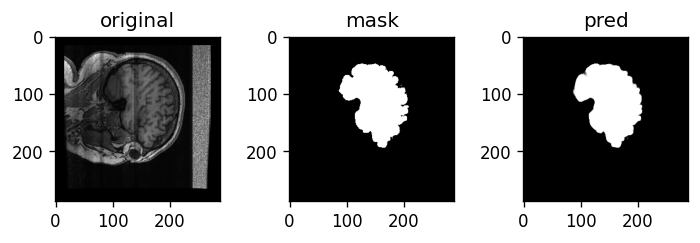

Train: Epoch 24 | Batch: 510 | Combined Loss: 0.020670879632234573 | BCE 0.007515896111726761 | dice_loss 0.013154983520507812
Avg train loss for epoch  --> 0.018912052372506455 | BCE: 0.005361022770631354 | dice_loss: 0.013551029574456823
Val: Epoch 24 | Batch: 0 | Combined Loss: 0.025687679648399353 | BCE 0.008094356395304203 | dice_loss 0.017593324184417725


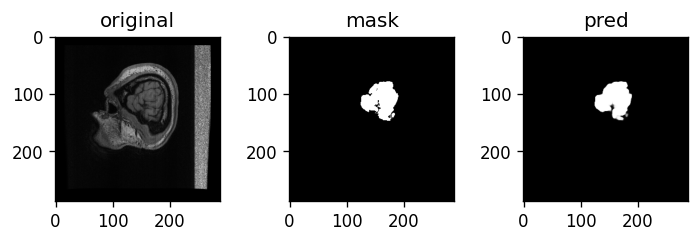

Val: Epoch 24 | Batch: 10 | Combined Loss: 0.022332487627863884 | BCE 0.007425306830555201 | dice_loss 0.01490718126296997
Val: Epoch 24 | Batch: 20 | Combined Loss: 0.023030275478959084 | BCE 0.008160525932908058 | dice_loss 0.014869749546051025
Val: Epoch 24 | Batch: 30 | Combined Loss: 0.024392854422330856 | BCE 0.003101239912211895 | dice_loss 0.021291613578796387


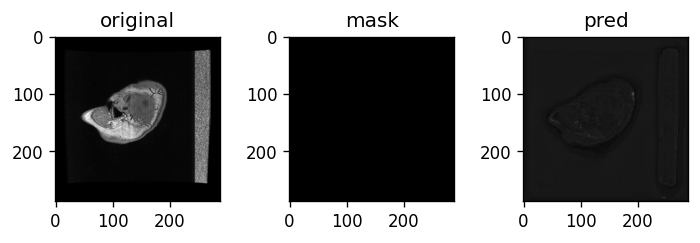

Val: Epoch 24 | Batch: 40 | Combined Loss: 0.02262260764837265 | BCE 0.008441590704023838 | dice_loss 0.014181017875671387
Val: Epoch 24 | Batch: 50 | Combined Loss: 0.018907183781266212 | BCE 0.005440408829599619 | dice_loss 0.01346677541732788
Val: Epoch 24 | Batch: 60 | Combined Loss: 0.021312156692147255 | BCE 0.007724383845925331 | dice_loss 0.013587772846221924


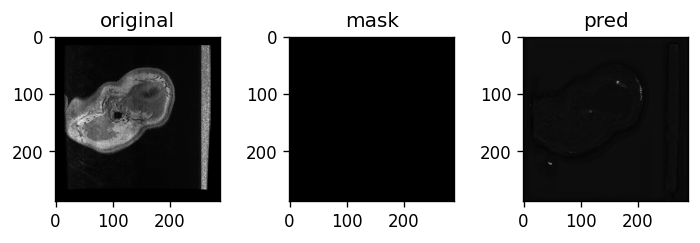

Val: Epoch 24 | Batch: 70 | Combined Loss: 0.01698596030473709 | BCE 0.0053300922736525536 | dice_loss 0.011655867099761963
Val: Epoch 24 | Batch: 80 | Combined Loss: 0.018648840487003326 | BCE 0.004524386953562498 | dice_loss 0.014124453067779541
Val: Epoch 24 | Batch: 90 | Combined Loss: 0.019402960315346718 | BCE 0.006393054500222206 | dice_loss 0.013009905815124512


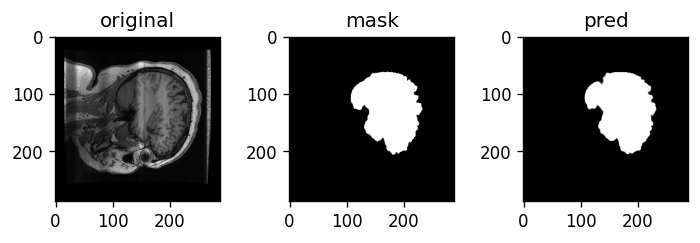

Val: Epoch 24 | Batch: 100 | Combined Loss: 0.023984640836715698 | BCE 0.007336049806326628 | dice_loss 0.016648590564727783
Val: Epoch 24 | Batch: 110 | Combined Loss: 0.02343836799263954 | BCE 0.007537814788520336 | dice_loss 0.01590055227279663
Val: Epoch 24 | Batch: 120 | Combined Loss: 0.014860031194984913 | BCE 0.0035472481977194548 | dice_loss 0.011312782764434814


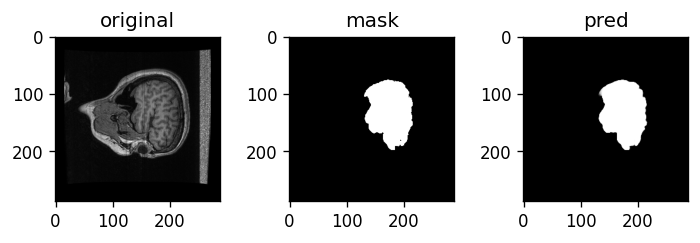

Val: Epoch 24 | Batch: 130 | Combined Loss: 0.021130692213773727 | BCE 0.007233153097331524 | dice_loss 0.013897538185119629
Average val loss for epoch  --> 0.02103549697332912 | BCE: 0.006428702280822175 | dice_loss: 0.014606794604548702
****************************************************************************************************


In [ ]:
train_loss_dict = {}
val_loss_dict = {}
train_loss_means = []
val_loss_means = []

train_BCE_loss_means = []
val_BCE_loss_means = []
train_dice_loss_means = []
val_dice_loss_means = []

for epoch in range(no_of_epochs):

  model, optimizer, loss_hist, BCE_loss_hist, dice_loss_hist = train(model, train_loader, optimizer, loss_func, epoch, device)

  print("Avg train loss for epoch  -->", mean(loss_hist),"| BCE:",mean(BCE_loss_hist),"| dice_loss:",mean(dice_loss_hist))
  train_loss_means.append(mean(loss_hist))
  train_BCE_loss_means.append(mean(BCE_loss_hist))
  train_dice_loss_means.append(mean(dice_loss_hist))

  train_loss_dict[epoch] = loss_hist

  val_loss_hist, val_BCE_loss_hist, val_dice_loss_hist = val(model, val_loader, loss_func, epoch, device)

  print("Average val loss for epoch  -->", mean(val_loss_hist),"| BCE:",mean(val_BCE_loss_hist),"| dice_loss:",mean(val_dice_loss_hist))

  val_loss_means.append(mean(val_loss_hist))
  val_BCE_loss_means.append(mean(val_BCE_loss_hist))
  val_dice_loss_means.append(mean(val_dice_loss_hist))

  val_loss_dict[epoch] = val_loss_hist

  print("****************************************************************************************************")

Text(0, 0.5, 'bce loss')

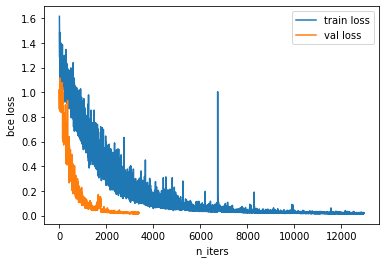

In [ ]:
tl = []
vl = []
for k,v in train_loss_dict.items():
  tl.extend(v)

for k,v in val_loss_dict.items():
  vl.extend(v)

plt.plot( tl , label = 'train loss')
plt.plot( vl , label = 'val loss')
plt.legend()
plt.xlabel('n_iters')
plt.ylabel('bce loss')

Text(0, 0.5, 'bce loss')

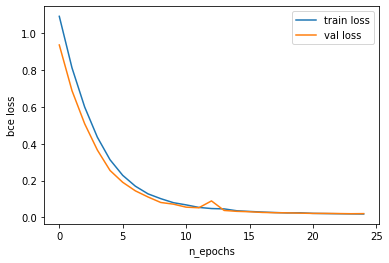

In [ ]:
plt.plot( train_loss_means , label = 'train loss')
plt.plot( val_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('n_epochs')
plt.ylabel('bce loss')

Text(0, 0.5, 'bce loss')

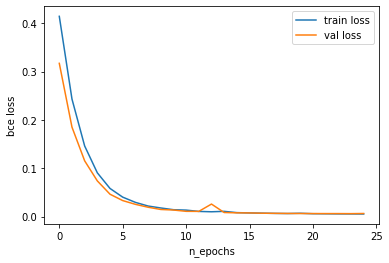

In [ ]:
plt.plot( train_BCE_loss_means , label = 'train loss')
plt.plot( val_BCE_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('n_epochs')
plt.ylabel('bce loss')

Text(0, 0.5, 'bce loss')

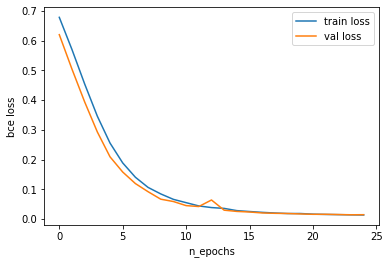

In [ ]:
plt.plot( train_dice_loss_means , label = 'train loss')
plt.plot( val_dice_loss_means , label = 'val loss')
plt.legend()
plt.xlabel('n_epochs')
plt.ylabel('bce loss')

# Save Model

In [ ]:
torch.save(model,'/content/gdrive/MyDrive/VMIA_Lab_Data/GE3/ge3_updated_train70_25epochs_combinedloss.pkl')